# Conditional GANs, and Some Best Practices

In the previous notebook we looked at a simple GAN that followed some — though not all — of the established best practices for building and training GANs. In this notebook we're going to explicitly call out these best practices, attempt to give some intuition for why they might work, and hopefully improve on the results from the previous notebook. 

Additionally, we're going to examine something called a "Conditional" GAN, in which we will provide the discriminator with the original label data and randomly create "labels" for our generator. This has been shown to improve the output of our GANs generally with the added benefit that when we ask our generator for a new sample after training we can provide it with a label. This results in us having much more control over the generated output, and sets the stage for further advancements as seen in architectures such as StyleGAN, GauGAN, and Pix2Pix. 

In the interest of completeness, we're also going to switch to the CIFAR dataset in order to demonstrate a GAN that creates color images. This makes comparing the two results difficult, but as an exercise for the reader it would be straight forward to clone the network and training process from this notebook and apply it to the MNIST dataset.

In [1]:
from keras.datasets.cifar10 import load_data
from keras.models import Model
from keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, LeakyReLU, Dropout, Flatten, Dense, Reshape, Input, Embedding, Concatenate
from keras.utils.vis_utils import plot_model

# Because of an issue with the standard Keras version of Adam
# which doesn't handle sparse matrices well, we're using the 
# tensorflow optimizer. More information about this issue can 
# be found here:
#     https://github.com/keras-team/keras/issues/4365#issuecomment-260482550
from tensorflow.keras.optimizers import Adam

# Another direct from tensorflow import. This version of the loss
# function supports label smoothing. If we try to perform label
# smoothing directly (i.e. manually smoothing the REAL/FAKE labels)
# the built in binary_crossentropy never provides any loss at all
# because it expects binary labels. This caused me many headaches. 
from tensorflow.keras.losses import BinaryCrossentropy

import numpy as np

from matplotlib import pyplot as plt

# Note: Because we're building a conditional GAN, we need the labels. 
# Also note, we're using the "coarse" labels for cifar100, so we'll only have 10 classes. 
(real_train_images, real_train_labels), (real_test_images, real_test_labels) = load_data()

Using TensorFlow backend.


# Establish Some Constants

In [2]:
# Some constants that we'll use throughout this notebook...
# Many of these can be tweaked, and will have an impact on the 
# performance of the network. 

# CIFAR specific
INPUT_SHAPE = (32, 32, 3)
N_CLASSES = 10

# This is backwards from the last notebook.
# The GAN should train either way, but some have suggested using real=0
# improves training. As we'll see, real=1 works just fine, and real=0
# worked in the last lab. Consider trying an apples to apples comparison,
# your milage may vary!
REAL_LABEL_VALUE = 1
FAKE_LABEL_VALUE = 0

# 100 is arbitrary for the latent/noise vector, but what the original DCGAN paper used. 
# A larger value here will allow the GAN to generate more unique outputs. 
NOISE_DIM = 100

# This number should be a large enough space to represent
# "a handful of low resolution examples" of the images we're
# trying to generate. In our case, 8*8 is the "low resolution"
# (downsampled to 4 by 4 of 4, from 32 * 32 -> 4 * 4) and 256
# is "a handful". Increasing this number has a similar effect as
# increasing the NOISE_DIM
LATENT_LOW_RES_VALUE = 4
LATENT_SCALAR = 256
LATENT_DENSE_SIZE = LATENT_SCALAR * LATENT_LOW_RES_VALUE * LATENT_LOW_RES_VALUE
GENERATOR_INITIAL_SHAPE = (LATENT_LOW_RES_VALUE, LATENT_LOW_RES_VALUE, LATENT_SCALAR)

# This is the size of the label embedding layer. 
# Embedding is a kind of alternative to one-hot-encoding for
# categorical data, and is very important to conditional GANs. 
LABEL_EMBEDDING_SIZE = 50

# Preparing and Generating Real Samples

In [3]:
# We're going to normalize from the [0, 255] domain to [-1.0, 1.0]
# This is different from the previous notebook, and a practice that 
# seems to stabalize training. We'll use tanh on the generator to achieve
# the same bound on generated samples [-1.0, 1.0].
def prepare_real_samples(samples):
    prepared_samples = samples.astype('float32')
    prepared_samples = (prepared_samples - 127.5) / 127.5
    
    return prepared_samples

# Note here that we generate random "classes" in addition to the latent vector.
def generate_real_batch(samples, orig_labels, n_samples):
    indices = np.random.randint(0, samples.shape[0], n_samples)
    batch_images = samples[indices]
    
    batch_orig_labels = orig_labels[indices]
    batch_labels = np.full(n_samples, REAL_LABEL_VALUE)

    return batch_images, batch_labels, batch_orig_labels.flatten()

(5, 1)
(3, 1)
(4, 1)
(5, 1)
(3, 1)
(4, 1)
(3, 1)
(1, 1)
(6, 1)
(6, 1)


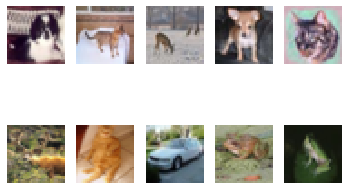

In [4]:
# Prepare the dataset
prepared_real_images = prepare_real_samples(real_train_images)

# Lets quickly visualize our "real" data vs our "fake" data.
real_x, label, orig_label = generate_real_batch(prepared_real_images, real_train_labels, 10)

for l in zip(orig_label, label):
    print(l)

# For better visualuzation we "undo" the [-1, 1] scaling
real_x = (real_x + 1) / 2

for i in range(10):
    ax = plt.subplot(2, 5, i+1)
    ax.axis('off')
    plt.imshow(real_x[i])
plt.show()

In [5]:
# The discriminator is very similar to the one we built in the last notebook.
# However, it now has two inputs: the images and the label. This what makes it
# a conditional GAN. 

# Also note that because we now have 2 inputs, we cannot use the Sequential
# mode, and have to use the functional API.
def create_discriminator(in_shape, n_classes, label_smoothing=0):
    # When we use the discriminator we'll be passing the label as an integer, hence this shape.
    # This is then transformed into the embedding layer. 
    label_input = Input(shape=(1,))
    
    # The embedding layer transforms the class value to an alternative 
    # vector representation with length based on the LABEL_EMBEDDING_SIZE
    embedding_input = Embedding(n_classes, LABEL_EMBEDDING_SIZE)(label_input)
    
    # Embedding is followed by a dense layer, that we need to reshape to 
    # match the input image sizes, so that the input to our feature extractor
    # is 4 width*height matricies: [R, G, B, EMBEDDING]
    embedding_input = Dense(in_shape[0] * in_shape[1])(embedding_input)
    embedding_input = Reshape((in_shape[0], in_shape[1], 1))(embedding_input) # Not just "in_shape" because it may have 3 color channels.
    
    # Now, we setup the image input layer, and merge it with the embedding
    image_input = Input(shape=in_shape)
    merge = Concatenate()([image_input, embedding_input])
    
    # Now, as usual, the feature extractor / Convolutional section.
    feature_extractor = Conv2D(64, (3, 3), padding='same')(merge)
    feature_extractor = LeakyReLU(alpha=0.2)(feature_extractor)
  
    # down to 16x16
    feature_extractor = Conv2D(128, (3,3), strides=(2, 2), padding='same')(feature_extractor)
    feature_extractor = LeakyReLU(alpha=0.2)(feature_extractor)
    
    # 8x8
    feature_extractor = Conv2D(128, (3,3), strides=(2, 2), padding='same')(feature_extractor)
    feature_extractor = LeakyReLU(alpha=0.2)(feature_extractor)

    # 4x4
    feature_extractor = Conv2D(256, (3,3), strides=(2, 2), padding='same')(feature_extractor)
    feature_extractor = LeakyReLU(alpha=0.2)(feature_extractor)
    
    feature_extractor = Flatten()(feature_extractor)
    feature_extractor = Dropout(0.4)(feature_extractor)
    
    out_layer = Dense(1, activation='sigmoid')(feature_extractor)

    # Note the quite small learning rate.
    model = Model([image_input, label_input], out_layer)
    opt = Adam(learning_rate = 0.0002, beta_1=.5)
    loss = BinaryCrossentropy(label_smoothing=label_smoothing)
    model.compile(loss=loss, optimizer=opt, metrics=['accuracy'])
    
    return model


# The generator also needs to accept the labels now.
# Additionally, we're going to change the final layer's 
# activation to tanh such that we have output range [-1, 1]
# which our discriminator expects (because of our pre-processing)
def create_generator(noise_dim, dense_layer_nodes, n_classes):
    # The embedding input is similar to the discriminator, but note
    # that the dense node gets reshaped to match the "low resolution"
    # value, so that it matches the standard input to the CNN layers
    label_input = Input(shape=(1,))
    embedding_input = Embedding(n_classes, LABEL_EMBEDDING_SIZE)(label_input)
    embedding_input = Dense(LATENT_LOW_RES_VALUE * LATENT_LOW_RES_VALUE)(embedding_input)
    embedding_input = Reshape((LATENT_LOW_RES_VALUE, LATENT_LOW_RES_VALUE, 1))(embedding_input)

    # the latent / noise dimension 
    latent_input = Input(shape=(noise_dim,))
    noise_input = Dense(LATENT_DENSE_SIZE)(latent_input)
    noise_input = LeakyReLU(alpha=0.2)(noise_input)
    noise_input = Reshape(GENERATOR_INITIAL_SHAPE)(noise_input)

    # Now merge the two inputs, and do the convolutional layers.
    merge = Concatenate()([noise_input, embedding_input])
    
    # Upsample to 8x8
    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(merge)
    gen = LeakyReLU(alpha=0.2)(gen)

    # Upsample to 16x16
    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(gen)
    gen = LeakyReLU(alpha=0.2)(gen)

    # Upsample to 32x32
    gen = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same')(gen)
    gen = LeakyReLU(alpha=0.2)(gen)
    
    # Finally layer three filters (RGB) and a wide convolution kernal.
    # Plus, note tanh instead of sigmoid for values [-1, 1]
    out_layer = Conv2D(3, (3, 3), activation='tanh', padding='same')(gen)
    
    # Note the model has 2 inputs, and one output. 
    return Model([latent_input, label_input], out_layer)


# Note that we now generate a noise vector AND a random "original_label" 
# from the range of classes.
# Note also: we're sampling from a normal distribution, which is suggested by
# https://arxiv.org/abs/1609.04468
def generate_noise_vector(noise_dim, n_samples, n_classes):
    noise_vector = np.random.normal(size = (n_samples, noise_dim))

    return noise_vector, np.random.randint(0, n_classes, size = n_samples)

# Mostly the same as last lab, but note the new code for "original classes". 
def generate_fake_batch(generator, noise_dim, n_classes, n_samples):
    noise_vector, original_classes = generate_noise_vector(noise_dim, n_samples, n_classes)
    
    batch_images = generator.predict([noise_vector, original_classes])
    batch_labels = np.full(n_samples, FAKE_LABEL_VALUE)
    
    return batch_images, batch_labels, original_classes


# Finally, the full GAN has a few changes 
# and a more complex architecture
def create_gan(generator, discriminator, label_smoothing=0):
    # As before, don't train the discriminator while training the generator
    discriminator.trainable = False
    
    # We need to map the embedding input directly to the 
    # discriminator model, so we grab it here.
    generator_noise_in, generator_embedding_in = generator.input
    generator_out = generator.output
    
    # The input for the discriminator is the generators output as well as
    # the embedding / label input.
    generator_output = discriminator([generator_out, generator_embedding_in])
    
    # The complete model:
    model = Model([generator_noise_in, generator_embedding_in], generator_output)
    opt = Adam(learning_rate = 0.0002, beta_1=.5)
    loss = BinaryCrossentropy(label_smoothing=label_smoothing)
    model.compile(loss=loss, optimizer=opt, metrics=['accuracy'])
    
    return model

# Inspecting The Models

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
embedding_1 (Embedding)         (None, 1, 50)        500         input_1[0][0]                    
__________________________________________________________________________________________________
dense_1 (Dense)                 (None, 1, 1024)      52224       embedding_1[0][0]                
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 32, 32, 3)    0                                            
____________________________________________________________________________________________

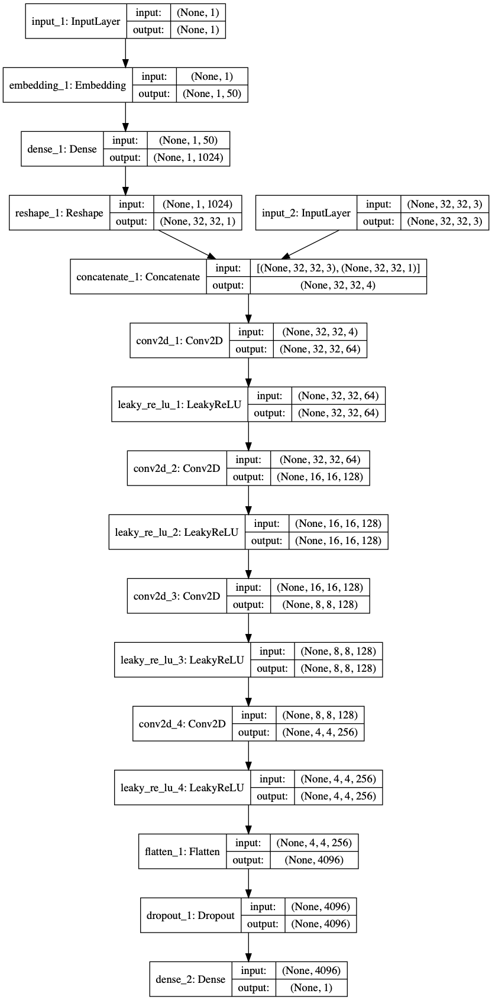

In [6]:
# Lets get fresh copies of everything.
discriminator = create_discriminator(INPUT_SHAPE, N_CLASSES)
discriminator.summary()
plot_model(discriminator, to_file='discriminator_plot.png', show_shapes=True, show_layer_names=True)

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 4096)         413696      input_4[0][0]                    
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 50)        500         input_3[0][0]                    
____________________________________________________________________________________________

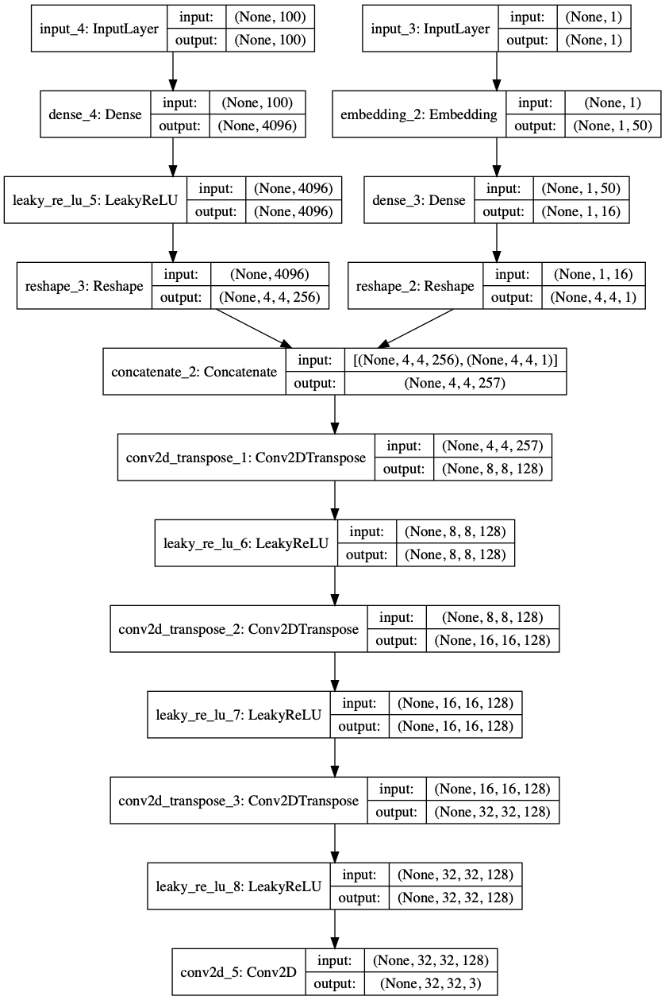

In [7]:
generator = create_generator(NOISE_DIM, LATENT_DENSE_SIZE, N_CLASSES)
generator.summary()
plot_model(generator, to_file='generator_plot.png', show_shapes=True, show_layer_names=True)

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
dense_4 (Dense)                 (None, 4096)         413696      input_4[0][0]                    
__________________________________________________________________________________________________
embedding_2 (Embedding)         (None, 1, 50)        500         input_3[0][0]                    
____________________________________________________________________________________________

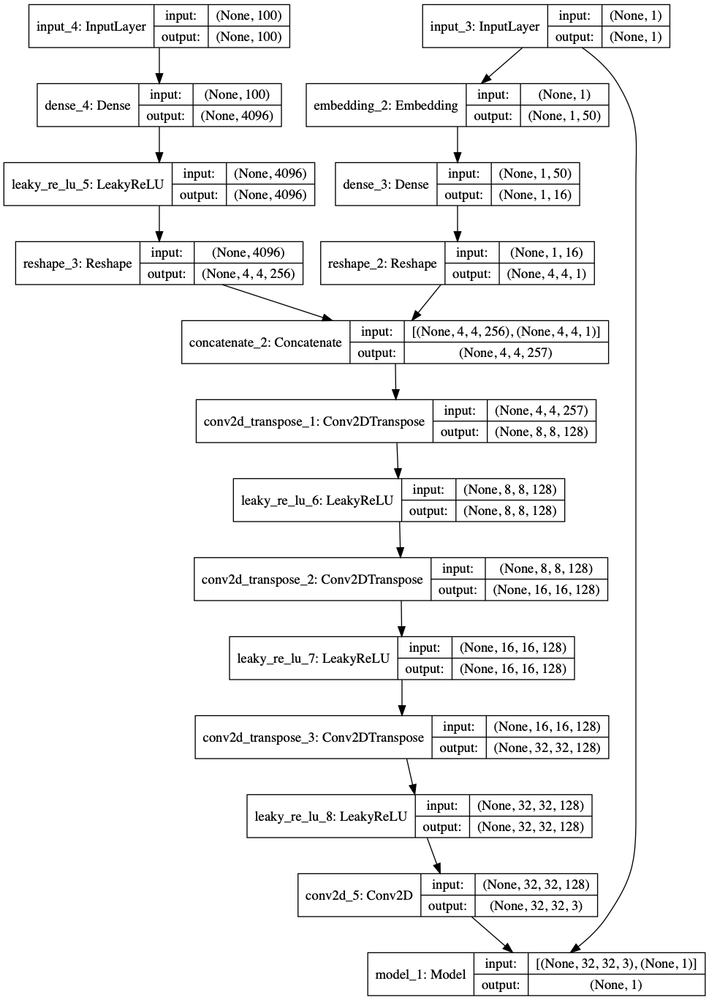

In [8]:
gan = create_gan(generator, discriminator)
gan.summary()
plot_model(gan, to_file='gan_plot.png', show_shapes=True, show_layer_names=True)

# Training the GAN

In [9]:
# The training has also changed somewhat. Of course we need to now provide the 
# class labels to the generator and discriminator directly. We also need to apply
# the label smoothing and image noise. 

# Yes, this is an annoyingly long function header for training
def train_gan_single_epoch(gan, generator, discriminator, noise_dim, batches, batch_size, image_noise_magnitude, verbose=1):          
    for i in range(batches):
        real_batch_images, real_batch_labels, real_classes = generate_real_batch(prepared_real_images, real_train_labels, batch_size // 2)
        fake_batch_images, fake_batch_labels, fake_classes = generate_fake_batch(generator, noise_dim, N_CLASSES, batch_size // 2)

        # Adding noise.
        if image_noise_magnitude > 0:
            real_noise_tensor = np.random.uniform(-1 * image_noise_magnitude, image_noise_magnitude, real_batch_images.shape)
            fake_noise_tensor = np.random.uniform(-1 * image_noise_magnitude, image_noise_magnitude, fake_batch_images.shape)

            real_batch_images = real_batch_images + real_noise_tensor
            fake_batch_images = fake_batch_images + fake_noise_tensor
        
        # Training a batch of real, then a batch of fake, rather than a shuffled mix
        # could impact training, but it gives us more granular information about the
        # discriminator's performance. 
        discriminator_real_met = discriminator.train_on_batch([real_batch_images, real_classes], real_batch_labels)
        discriminator_fake_met = discriminator.train_on_batch([fake_batch_images, fake_classes], fake_batch_labels)
        
        # Make some noise for the full model to train on
        gan_input_vector, gan_classes = generate_noise_vector(noise_dim, batch_size, N_CLASSES)

        # Standard label inversion here.
        gan_labels = np.full(batch_size, REAL_LABEL_VALUE)
        gan_met = gan.train_on_batch([gan_input_vector, gan_classes], gan_labels)
        
        if verbose >= 2: 
            print(f"{i} / {batches}: {discriminator_real_met}, {discriminator_fake_met}, {gan_met}")
            
            if verbose >= 3:
                print("Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)")
                print("Real samples this round...")
                for i in range(10):
                    ax = plt.subplot(2, 5, i+1)
                    ax.axis('off')
                    ax.set_title(f"{real_batch_labels[i]:.2f}, {real_classes[i]}")
                    plt.imshow((real_batch_images[i] + 1) / 2)

                plt.show()

                print("Fake samples this round...")
                for i in range(10):
                    ax = plt.subplot(2, 5, i+1)
                    ax.axis('off')
                    ax.set_title(f"{fake_batch_labels[i]:.2f}, {fake_classes[i]}")
                    plt.imshow((fake_batch_images[i] + 1) / 2)

                plt.show() 


# Verbosity: 
#   0 = nothing
#   1 = intial information only, train silently
#   2 = loss during each mini-batch statistics
#   3 = sample images after each mini-batch
def train_gan(gan, generator, discriminator, latent_dim, epochs, batches_per_epoch, batch_size, initial_image_noise, verbose=1):
    image_noise_decrement = initial_image_noise / epochs
    image_noise_magnitude = initial_image_noise
    
    if verbose > 0: 
        print(f"Beginning training... {epochs} epochs, each with {batches_per_epoch} batches of {batch_size}")
        print(f"Latent vector size {latent_dim}")
        print(f"Image noise initial magnitude: {image_noise_magnitude}, decay: {image_noise_decrement}")
        print("Training... ")
        print("Metrics: Discriminator Real, Discriminator Fake, Generator")
    
    for i in range(epochs):
        train_gan_single_epoch(gan, generator, discriminator, latent_dim, batches_per_epoch, batch_size, image_noise_magnitude, verbose=verbose)

        # Decrease noise amount
        image_noise_magnitude -= image_noise_decrement


        if verbose >= 1:
            # To evaluate, we'll look at 10 randomly generated samples.
            # And we'll also see what the discriminator has to say about them
            fake_images, fake_labels, fake_classes = generate_fake_batch(generator, latent_dim, N_CLASSES, 10) # No noise, no smoothing on the human evaluation images
            disc_fake_classifications = discriminator.predict([fake_images, fake_classes])
            fake_images = (fake_images + 1) / 2 # Renormalize to 0-1 range, from -1 to 1 range
            
            print(f'After {(i+1)*BATCHES*BATCH_SIZE} samples.')
            print('Image labels are D(image) and Class(image)')
            print('  Generated Images and Discriminator Output:')
            for i in range(10):
                ax = plt.subplot(2, 5, i+1)
                ax.axis('off')
                ax.set_title(f'{disc_fake_classifications[i][0]:.2f}, {fake_classes[i]}')
                plt.imshow(fake_images[i])

            plt.tight_layout()
            plt.show()
            
            # Now, same thing for real samples:
            print('  Real Images and Discriminator Output:')
            real_images, real_batch_labels, real_classes = generate_real_batch(prepared_real_images, real_train_labels, 10)
            disc_real_classifications = discriminator.predict([real_images, real_classes])
            real_images = (real_images + 1) / 2 # Renormalize to 0-1 range, from -1 to 1 range
            for i in range(10):
                ax = plt.subplot(2, 5, i+1)
                ax.axis('off')
                ax.set_title(f"{disc_real_classifications[i][0]:.2f} {real_classes[i]}")
                plt.imshow(real_images[i])

            plt.tight_layout()
            plt.show()

            

# Okay, Lets Train!

Beginning training... 1 epochs, each with 3 batches of 128
Latent vector size 100
Image noise initial magnitude: 0.1, decay: 0.1
Training... 
Metrics: Discriminator Real, Discriminator Fake, Generator


/Users/tylerbettilyon/.local/share/virtualenvs/deep-learning-intro-1Adgpw9A/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/Users/tylerbettilyon/.local/share/virtualenvs/deep-learning-intro-1Adgpw9A/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 / 3: [0.6948152, 0.4375], [0.69920707, 0.015625], [0.6907997, 1.0]
Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)
Real samples this round...


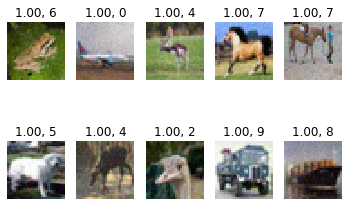

Fake samples this round...


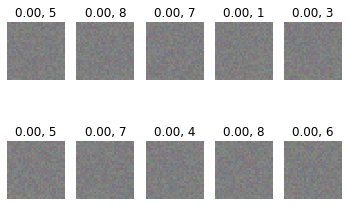

/Users/tylerbettilyon/.local/share/virtualenvs/deep-learning-intro-1Adgpw9A/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 / 3: [0.62949693, 1.0], [0.7063707, 0.0], [0.68747437, 1.0]
Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)
Real samples this round...


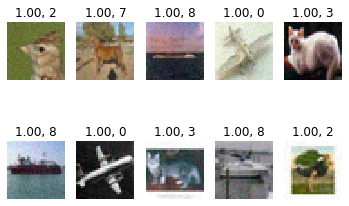

Fake samples this round...


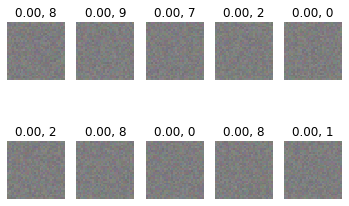

2 / 3: [0.5781209, 1.0], [0.716145, 0.0], [0.68030214, 1.0]
Samples this round with label value (binary REAL/FAKE) and 'class' (0-9 for CIFAR)
Real samples this round...


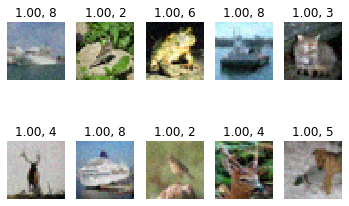

Fake samples this round...


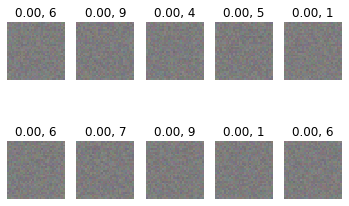

After 384 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


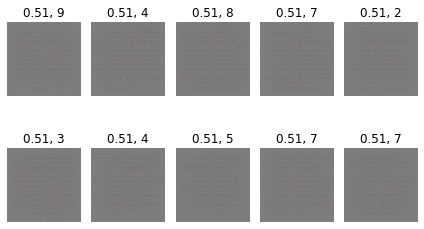

  Real Images and Discriminator Output:


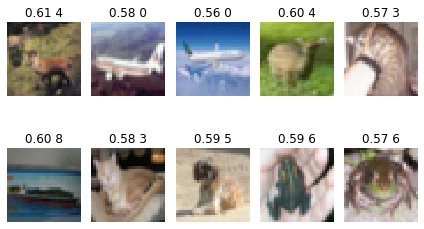

In [10]:
# Lets get fresh copies of everything.
# discriminator = create_discriminator(INPUT_SHAPE, N_CLASSES)
# generator = create_generator(NOISE_DIM, LATENT_DENSE_SIZE, N_CLASSES)
# gan = create_gan(generator, discriminator)

EPOCHS = 1
BATCHES = 3
BATCH_SIZE = 128
IMAGE_NOISE_START = .1

# Lets train some at high verbosity, then we'll train more
# This logging code avoids a matplotlib warning for clipping
# which is due to the noise added to our training images. 
# You may want to comment this code out, or disable it, 
# when you make changes to ensure you are properly warned!
import logging

logger = logging.getLogger()
old_level = logger.level
logger.setLevel(100)
train_gan(gan, generator, discriminator, NOISE_DIM, EPOCHS, BATCHES, BATCH_SIZE, IMAGE_NOISE_START, verbose=3)    
logger.setLevel(old_level)

Beginning training... 50 epochs, each with 100 batches of 128
Latent vector size 100
Image noise initial magnitude: 0.1, decay: 0.002
Training... 
Metrics: Discriminator Real, Discriminator Fake, Generator


/Users/tylerbettilyon/.local/share/virtualenvs/deep-learning-intro-1Adgpw9A/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 / 100: [0.70083576, 0.34375], [0.69883835, 0.0], [0.69164217, 1.0]


/Users/tylerbettilyon/.local/share/virtualenvs/deep-learning-intro-1Adgpw9A/lib/python3.7/site-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 / 100: [0.6455165, 1.0], [0.7031936, 0.0], [0.6900822, 1.0]
2 / 100: [0.5957413, 1.0], [0.7106716, 0.0], [0.6857672, 1.0]
3 / 100: [0.53335154, 1.0], [0.7243508, 0.0], [0.67422575, 1.0]
4 / 100: [0.46934462, 1.0], [0.7533941, 0.0], [0.6501436, 1.0]
5 / 100: [0.39646477, 1.0], [0.8107674, 0.0], [0.61362505, 1.0]
6 / 100: [0.3501241, 1.0], [0.8878109, 0.0], [0.5823039, 1.0]
7 / 100: [0.30606878, 1.0], [0.9203612, 0.0], [0.59696746, 1.0]
8 / 100: [0.33092436, 1.0], [0.83921397, 0.0], [0.6761242, 0.953125]
9 / 100: [0.324979, 1.0], [0.69184804, 0.5625], [0.83820105, 0.0]
10 / 100: [0.36184683, 0.921875], [0.5660933, 1.0], [0.98682857, 0.0]
11 / 100: [0.4323935, 0.828125], [0.54404277, 1.0], [0.95702815, 0.0]
12 / 100: [0.35509375, 0.921875], [0.57106745, 1.0], [0.89622414, 0.0]
13 / 100: [0.40428135, 0.84375], [0.61909366, 1.0], [0.81166285, 0.0]
14 / 100: [0.41549522, 0.890625], [0.6661037, 1.0], [0.763512, 0.0]
15 / 100: [0.36549753, 0.890625], [0.6965891, 0.296875], [0.74175394, 0.0]


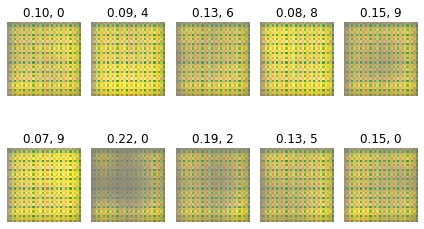

  Real Images and Discriminator Output:


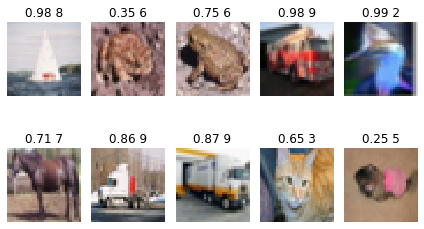

0 / 100: [0.35711366, 0.921875], [0.25445893, 1.0], [2.3307467, 0.0]
1 / 100: [0.41175672, 0.890625], [0.5735353, 0.953125], [2.0400176, 0.0]
2 / 100: [0.41245678, 0.875], [0.35392806, 1.0], [1.9465344, 0.0]
3 / 100: [0.51168317, 0.765625], [0.5627005, 0.953125], [1.4525912, 0.0]
4 / 100: [0.46289873, 0.875], [0.42843217, 1.0], [1.5091146, 0.0]
5 / 100: [0.45320943, 0.859375], [0.3994057, 1.0], [1.4811251, 0.0]
6 / 100: [0.39409423, 0.921875], [0.3824523, 1.0], [1.480049, 0.0]
7 / 100: [0.5230068, 0.796875], [0.39049318, 1.0], [1.4297764, 0.0]
8 / 100: [0.39961958, 0.875], [0.3631313, 1.0], [1.4993887, 0.0]
9 / 100: [0.4352923, 0.859375], [0.35727936, 1.0], [1.5958797, 0.0]
10 / 100: [0.41907066, 0.875], [0.31196153, 1.0], [1.7763603, 0.0]
11 / 100: [0.3309149, 0.9375], [0.27871147, 1.0], [2.0272398, 0.0]
12 / 100: [0.291812, 1.0], [0.24283019, 1.0], [2.2183557, 0.0]
13 / 100: [0.2975321, 0.9375], [0.22682777, 1.0], [2.1780124, 0.0]
14 / 100: [0.3427803, 0.9375], [0.28618628, 1.0], [2.

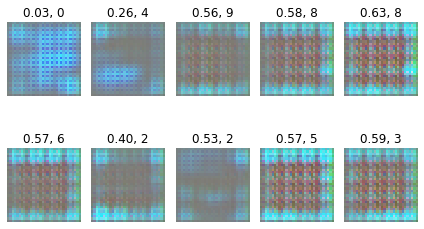

  Real Images and Discriminator Output:


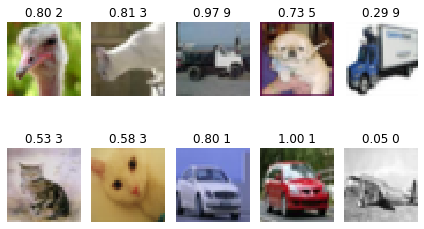

0 / 100: [0.54650545, 0.84375], [0.57636595, 0.59375], [1.6217446, 0.0234375]
1 / 100: [0.53219867, 0.84375], [0.5761102, 0.65625], [1.350311, 0.0625]
2 / 100: [0.47182202, 0.84375], [0.60234106, 0.65625], [1.2052765, 0.09375]
3 / 100: [0.34080654, 0.921875], [0.5600265, 0.765625], [1.2286856, 0.0234375]
4 / 100: [0.4230495, 0.890625], [0.50224763, 0.984375], [1.1953418, 0.0]
5 / 100: [0.30769792, 0.9375], [0.47204667, 1.0], [1.2992166, 0.0]
6 / 100: [0.28562015, 0.984375], [0.41297007, 1.0], [1.4147674, 0.0]
7 / 100: [0.32613224, 0.921875], [0.41890192, 0.984375], [1.4244826, 0.0]
8 / 100: [0.310061, 0.953125], [0.50808084, 0.859375], [1.4875875, 0.0]
9 / 100: [0.35839972, 0.921875], [0.6568925, 0.71875], [1.611212, 0.0]
10 / 100: [0.5842368, 0.6875], [0.49832183, 0.828125], [1.7563801, 0.0]
11 / 100: [0.48675245, 0.8125], [0.32237428, 1.0], [2.1218283, 0.0]
12 / 100: [0.51353824, 0.734375], [0.3207675, 1.0], [2.0218596, 0.0]
13 / 100: [0.40114045, 0.875], [0.35278004, 1.0], [1.914249

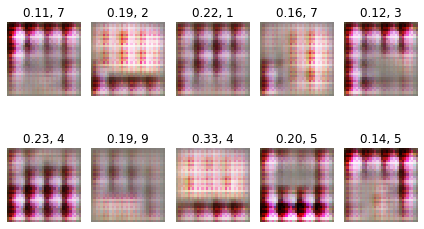

  Real Images and Discriminator Output:


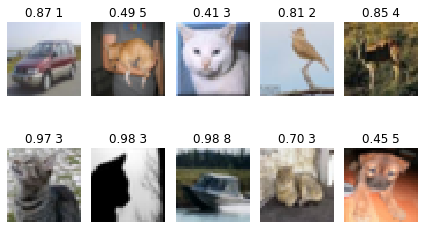

0 / 100: [0.51122886, 0.796875], [0.2945219, 1.0], [2.3609319, 0.0]
1 / 100: [0.4194218, 0.828125], [0.29076076, 1.0], [2.256865, 0.0]
2 / 100: [0.44611862, 0.828125], [0.32502493, 0.984375], [2.4019797, 0.0]
3 / 100: [0.32134792, 0.953125], [0.2661356, 1.0], [2.4654045, 0.0]
4 / 100: [0.49376965, 0.828125], [0.39008653, 0.9375], [2.8600388, 0.0]
5 / 100: [0.47805852, 0.796875], [0.30022612, 1.0], [2.6357317, 0.0]
6 / 100: [0.3782933, 0.890625], [0.36732236, 0.96875], [2.491492, 0.0]
7 / 100: [0.39934516, 0.875], [0.3416289, 0.96875], [2.6437905, 0.0]
8 / 100: [0.60226846, 0.734375], [0.41528773, 0.921875], [2.2792625, 0.0]
9 / 100: [0.5316415, 0.78125], [0.35920396, 0.953125], [2.0357845, 0.0234375]
10 / 100: [0.46189567, 0.796875], [0.40585843, 0.875], [2.2610173, 0.0]
11 / 100: [0.5706423, 0.703125], [0.37663183, 0.953125], [2.3652763, 0.0]
12 / 100: [0.55034643, 0.71875], [0.32048145, 0.953125], [2.2540512, 0.0078125]
13 / 100: [0.6046094, 0.65625], [0.4368311, 0.921875], [1.883603

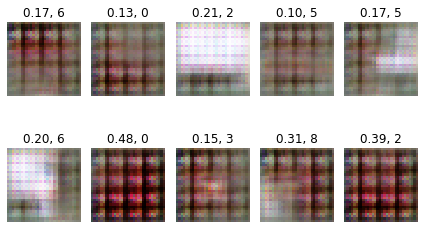

  Real Images and Discriminator Output:


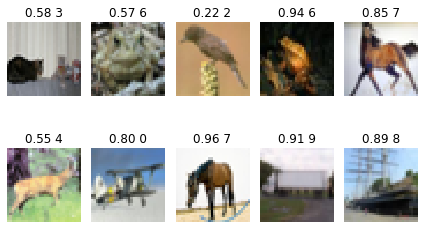

0 / 100: [0.5356153, 0.796875], [0.42710805, 0.890625], [1.8361075, 0.03125]
1 / 100: [0.5637881, 0.671875], [0.42356563, 0.890625], [1.7595141, 0.046875]
2 / 100: [0.63508004, 0.65625], [0.49996287, 0.890625], [1.723352, 0.03125]
3 / 100: [0.5456882, 0.703125], [0.5032584, 0.796875], [1.6521835, 0.0703125]
4 / 100: [0.73538214, 0.53125], [0.45820007, 0.859375], [1.6788956, 0.0546875]
5 / 100: [0.6777723, 0.59375], [0.5337986, 0.796875], [1.5951674, 0.0859375]
6 / 100: [0.6531315, 0.59375], [0.5291631, 0.765625], [1.5973103, 0.03125]
7 / 100: [0.57265687, 0.703125], [0.41105437, 0.921875], [1.5621861, 0.0625]
8 / 100: [0.43997017, 0.8125], [0.39288265, 0.984375], [1.7621228, 0.0078125]
9 / 100: [0.53011656, 0.75], [0.41353256, 0.90625], [1.6913345, 0.0390625]
10 / 100: [0.54991794, 0.75], [0.4027975, 0.90625], [1.8471624, 0.0234375]
11 / 100: [0.4987461, 0.765625], [0.41194367, 0.890625], [1.7022529, 0.03125]
12 / 100: [0.45920032, 0.828125], [0.43489867, 0.859375], [1.8957896, 0.02343

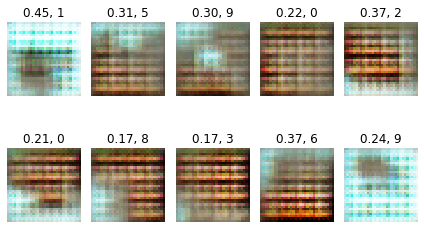

  Real Images and Discriminator Output:


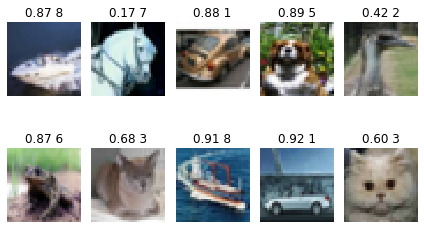

0 / 100: [0.42328173, 0.90625], [0.43646944, 0.921875], [1.3543048, 0.015625]
1 / 100: [0.41140175, 0.9375], [0.52402425, 0.828125], [1.484308, 0.015625]
2 / 100: [0.48963618, 0.765625], [0.42308962, 0.890625], [1.386009, 0.0390625]
3 / 100: [0.372056, 0.953125], [0.45216703, 0.9375], [1.4669595, 0.0625]
4 / 100: [0.3607331, 0.90625], [0.49331874, 0.84375], [1.6313785, 0.0859375]
5 / 100: [0.46117398, 0.828125], [0.53754246, 0.8125], [1.5026195, 0.15625]
6 / 100: [0.4497991, 0.84375], [0.60043323, 0.703125], [1.4505801, 0.125]
7 / 100: [0.41024286, 0.890625], [0.68797934, 0.71875], [1.4993826, 0.171875]
8 / 100: [0.5000614, 0.765625], [0.7987597, 0.734375], [1.7138804, 0.140625]
9 / 100: [0.6186032, 0.625], [0.5814117, 0.734375], [1.6789544, 0.125]
10 / 100: [0.64594924, 0.640625], [0.48802227, 0.875], [1.7175301, 0.125]
11 / 100: [0.59412825, 0.640625], [0.5443862, 0.78125], [1.5927715, 0.1953125]
12 / 100: [0.50408053, 0.8125], [0.7041318, 0.59375], [1.7970219, 0.09375]
13 / 100: [0.

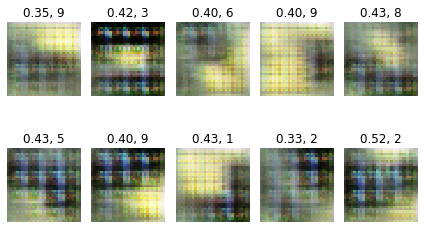

  Real Images and Discriminator Output:


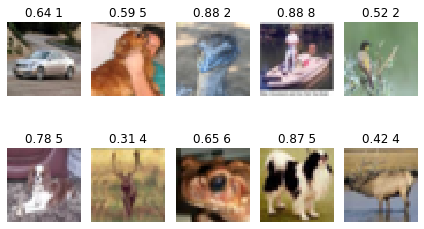

0 / 100: [0.48248965, 0.765625], [0.5873722, 0.71875], [1.1623483, 0.046875]
1 / 100: [0.5632431, 0.65625], [0.707299, 0.546875], [1.1114919, 0.078125]
2 / 100: [0.5826186, 0.609375], [0.89573705, 0.421875], [1.0887524, 0.0703125]
3 / 100: [0.82111096, 0.390625], [0.9056171, 0.328125], [1.1493409, 0.015625]
4 / 100: [0.8087856, 0.328125], [0.5746412, 0.796875], [1.3112888, 0.0078125]
5 / 100: [0.8649687, 0.328125], [0.45314047, 0.984375], [1.336705, 0.0]
6 / 100: [0.82427895, 0.328125], [0.46226397, 1.0], [1.3018799, 0.0]
7 / 100: [0.73898876, 0.53125], [0.46753514, 0.9375], [1.3325961, 0.0078125]
8 / 100: [0.6330179, 0.625], [0.40471423, 1.0], [1.543267, 0.0]
9 / 100: [0.55835533, 0.765625], [0.39417148, 1.0], [1.5605185, 0.0]
10 / 100: [0.51056427, 0.828125], [0.40338644, 1.0], [1.44488, 0.0]
11 / 100: [0.54774016, 0.71875], [0.43183902, 1.0], [1.3554354, 0.0]
12 / 100: [0.5910174, 0.6875], [0.5755786, 0.875], [1.1211267, 0.015625]
13 / 100: [0.44760802, 0.859375], [0.6735485, 0.6406

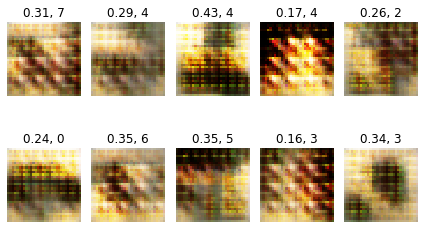

  Real Images and Discriminator Output:


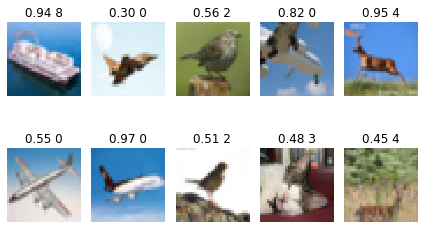

0 / 100: [0.47865057, 0.765625], [0.43376213, 0.953125], [1.4089533, 0.015625]
1 / 100: [0.55054325, 0.734375], [0.4326656, 0.96875], [1.4377637, 0.0]
2 / 100: [0.58297, 0.703125], [0.4525379, 0.96875], [1.3861907, 0.0]
3 / 100: [0.60933495, 0.703125], [0.48583823, 0.9375], [1.1866293, 0.0078125]
4 / 100: [0.3965489, 0.921875], [0.4907275, 0.953125], [1.2630625, 0.0]
5 / 100: [0.47684318, 0.765625], [0.51766884, 0.875], [1.2336413, 0.0]
6 / 100: [0.5503204, 0.765625], [0.55390584, 0.84375], [1.2442017, 0.0078125]
7 / 100: [0.59703374, 0.671875], [0.6018506, 0.75], [1.2296121, 0.046875]
8 / 100: [0.65152115, 0.625], [0.61305815, 0.734375], [1.1835095, 0.0234375]
9 / 100: [0.87812114, 0.484375], [0.7507636, 0.546875], [1.0758749, 0.0546875]
10 / 100: [0.6963717, 0.53125], [0.643239, 0.671875], [1.1013021, 0.0234375]
11 / 100: [0.85574865, 0.40625], [0.64674747, 0.609375], [1.1472179, 0.0234375]
12 / 100: [0.7701087, 0.484375], [0.6173599, 0.765625], [1.1456637, 0.0390625]
13 / 100: [0.71

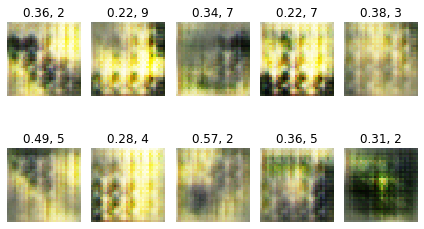

  Real Images and Discriminator Output:


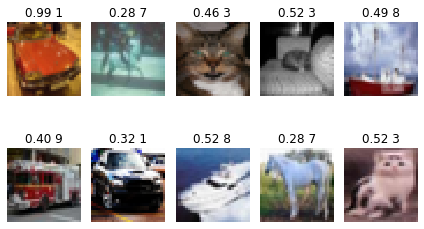

0 / 100: [0.75969994, 0.484375], [0.5790811, 0.75], [1.2126527, 0.0546875]
1 / 100: [0.6445036, 0.59375], [0.5335232, 0.8125], [1.1736801, 0.0703125]
2 / 100: [0.56695926, 0.6875], [0.53708786, 0.78125], [1.2709093, 0.0625]
3 / 100: [0.6361597, 0.71875], [0.5372768, 0.828125], [1.2765067, 0.046875]
4 / 100: [0.5723971, 0.828125], [0.44103652, 0.890625], [1.3838779, 0.015625]
5 / 100: [0.48806432, 0.796875], [0.46479034, 0.921875], [1.3827717, 0.0078125]
6 / 100: [0.52890766, 0.796875], [0.4494077, 0.9375], [1.3525211, 0.0234375]
7 / 100: [0.53209543, 0.75], [0.47594884, 0.90625], [1.3686271, 0.015625]
8 / 100: [0.44599918, 0.84375], [0.453147, 0.9375], [1.4659257, 0.0]
9 / 100: [0.53936553, 0.703125], [0.4613978, 0.90625], [1.4491079, 0.0]
10 / 100: [0.5533781, 0.671875], [0.43828112, 0.953125], [1.4210413, 0.0234375]
11 / 100: [0.5951517, 0.625], [0.5030769, 0.890625], [1.2700821, 0.046875]
12 / 100: [0.56820834, 0.734375], [0.53144395, 0.84375], [1.2657804, 0.0234375]
13 / 100: [0.61

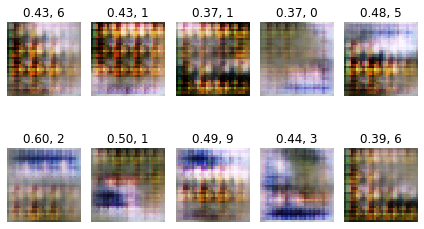

  Real Images and Discriminator Output:


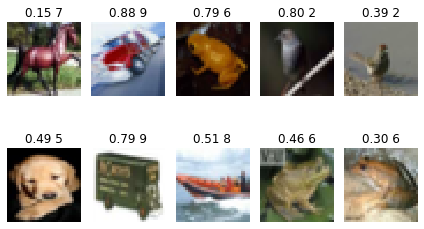

0 / 100: [0.72658527, 0.5], [0.7347474, 0.546875], [0.96583927, 0.234375]
1 / 100: [0.73105574, 0.5625], [0.74571717, 0.484375], [1.0791996, 0.1484375]
2 / 100: [0.7831627, 0.484375], [0.6846609, 0.5625], [0.9943243, 0.25]
3 / 100: [0.7074374, 0.59375], [0.74108404, 0.46875], [1.0463945, 0.21875]
4 / 100: [0.71944344, 0.515625], [0.73145574, 0.484375], [1.030201, 0.2109375]
5 / 100: [0.696417, 0.578125], [0.69151425, 0.53125], [1.0944378, 0.15625]
6 / 100: [0.78357923, 0.40625], [0.723627, 0.515625], [1.0360136, 0.1484375]
7 / 100: [0.7886587, 0.46875], [0.5720738, 0.734375], [1.0277784, 0.140625]
8 / 100: [0.6857582, 0.5625], [0.5651845, 0.765625], [1.0561886, 0.1171875]
9 / 100: [0.628104, 0.59375], [0.5651511, 0.828125], [1.1102393, 0.0703125]
10 / 100: [0.6086001, 0.671875], [0.53619677, 0.8125], [1.2125449, 0.0703125]
11 / 100: [0.5134368, 0.796875], [0.5124897, 0.875], [1.187752, 0.09375]
12 / 100: [0.51377916, 0.78125], [0.51777184, 0.859375], [1.2690187, 0.0625]
13 / 100: [0.45

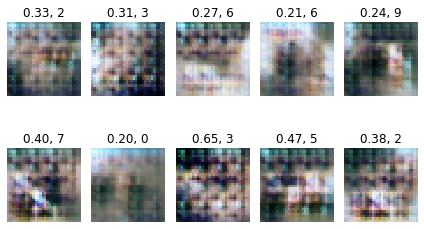

  Real Images and Discriminator Output:


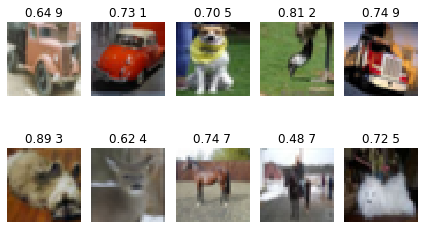

0 / 100: [0.5615578, 0.703125], [0.6042257, 0.765625], [1.1288575, 0.03125]
1 / 100: [0.54615045, 0.71875], [0.52496123, 0.890625], [1.1753545, 0.015625]
2 / 100: [0.48936737, 0.796875], [0.5194607, 0.875], [1.206286, 0.0234375]
3 / 100: [0.55427027, 0.75], [0.58829224, 0.765625], [1.2608144, 0.0078125]
4 / 100: [0.5170412, 0.703125], [0.46402022, 0.96875], [1.4108217, 0.0078125]
5 / 100: [0.5237887, 0.765625], [0.44417715, 0.921875], [1.3754447, 0.0078125]
6 / 100: [0.5656229, 0.6875], [0.50152236, 0.90625], [1.4097478, 0.0]
7 / 100: [0.5549952, 0.71875], [0.5349579, 0.890625], [1.2673094, 0.0234375]
8 / 100: [0.5582959, 0.703125], [0.5125343, 0.875], [1.2940176, 0.03125]
9 / 100: [0.5565387, 0.71875], [0.5844686, 0.78125], [1.2621598, 0.046875]
10 / 100: [0.65953076, 0.609375], [0.5963771, 0.671875], [1.1427107, 0.046875]
11 / 100: [0.5532979, 0.734375], [0.60067177, 0.734375], [1.1524922, 0.046875]
12 / 100: [0.5085133, 0.796875], [0.5931229, 0.671875], [1.3239678, 0.03125]
13 / 100

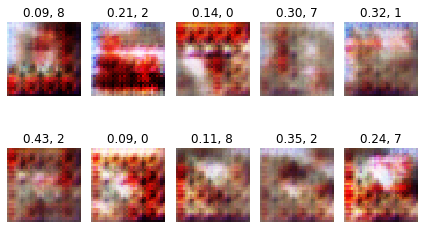

  Real Images and Discriminator Output:


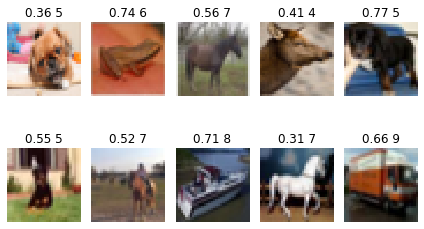

0 / 100: [0.5694026, 0.734375], [0.3449791, 1.0], [1.7136114, 0.0]
1 / 100: [0.521938, 0.71875], [0.3553102, 1.0], [1.5411499, 0.0078125]
2 / 100: [0.48727787, 0.71875], [0.44984466, 0.890625], [1.5655503, 0.0]
3 / 100: [0.46217656, 0.84375], [0.4614318, 0.90625], [1.4032869, 0.0234375]
4 / 100: [0.5082228, 0.78125], [0.5255023, 0.828125], [1.3326448, 0.0546875]
5 / 100: [0.51421785, 0.71875], [0.55174553, 0.78125], [1.1771226, 0.1328125]
6 / 100: [0.5407989, 0.71875], [0.6190274, 0.703125], [1.1142554, 0.15625]
7 / 100: [0.60393316, 0.671875], [0.74715996, 0.546875], [1.0916595, 0.1875]
8 / 100: [0.672515, 0.609375], [0.6987299, 0.625], [1.0354867, 0.1875]
9 / 100: [0.6722436, 0.578125], [0.63601315, 0.671875], [1.0169941, 0.1796875]
10 / 100: [0.7692952, 0.515625], [0.6716306, 0.515625], [1.1010021, 0.171875]
11 / 100: [0.7743941, 0.546875], [0.610973, 0.6875], [1.157479, 0.1171875]
12 / 100: [0.70438266, 0.53125], [0.612061, 0.640625], [1.1179144, 0.109375]
13 / 100: [0.74754137, 0.

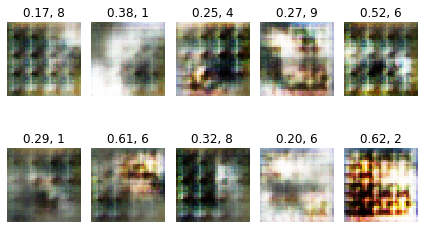

  Real Images and Discriminator Output:


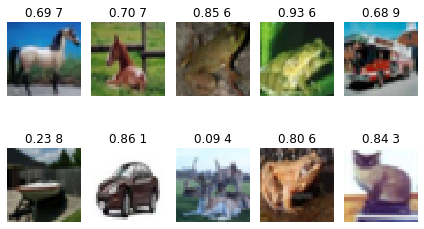

0 / 100: [0.58796066, 0.75], [0.5567745, 0.75], [1.3013353, 0.0625]
1 / 100: [0.67155457, 0.59375], [0.5300094, 0.765625], [1.1891656, 0.0859375]
2 / 100: [0.5745907, 0.71875], [0.4949504, 0.859375], [1.1576471, 0.1328125]
3 / 100: [0.579129, 0.65625], [0.60766137, 0.734375], [1.2204535, 0.0703125]
4 / 100: [0.61365426, 0.65625], [0.5312134, 0.828125], [1.2396463, 0.0859375]
5 / 100: [0.5952221, 0.609375], [0.49675626, 0.875], [1.2936664, 0.046875]
6 / 100: [0.48727933, 0.765625], [0.4669972, 0.84375], [1.4398807, 0.0390625]
7 / 100: [0.571189, 0.6875], [0.4005137, 0.953125], [1.4897435, 0.0234375]
8 / 100: [0.53735507, 0.78125], [0.41800874, 0.9375], [1.4206847, 0.0546875]
9 / 100: [0.55835986, 0.765625], [0.5444672, 0.75], [1.2815483, 0.078125]
10 / 100: [0.51807976, 0.71875], [0.45455858, 0.90625], [1.371958, 0.03125]
11 / 100: [0.5770117, 0.734375], [0.5116401, 0.8125], [1.3444409, 0.0546875]
12 / 100: [0.5858026, 0.71875], [0.45606932, 0.921875], [1.3824575, 0.015625]
13 / 100: [0

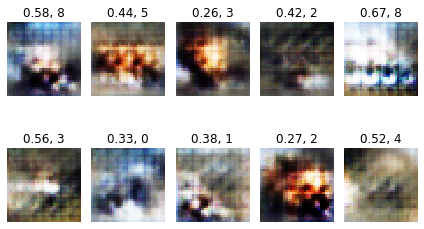

  Real Images and Discriminator Output:


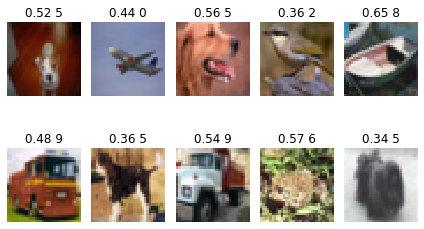

0 / 100: [0.7427088, 0.5], [0.6965688, 0.59375], [0.9551023, 0.15625]
1 / 100: [0.7573652, 0.515625], [0.6459985, 0.59375], [0.9580874, 0.109375]
2 / 100: [0.77681434, 0.375], [0.64770603, 0.671875], [1.014719, 0.0859375]
3 / 100: [0.7212485, 0.453125], [0.6387094, 0.671875], [1.017129, 0.109375]
4 / 100: [0.732947, 0.4375], [0.6350703, 0.609375], [1.0037766, 0.09375]
5 / 100: [0.7982322, 0.421875], [0.5538244, 0.84375], [0.962243, 0.1640625]
6 / 100: [0.75160897, 0.375], [0.6646936, 0.578125], [0.95546377, 0.203125]
7 / 100: [0.6707966, 0.546875], [0.6086997, 0.71875], [1.003239, 0.09375]
8 / 100: [0.66811913, 0.53125], [0.59433866, 0.765625], [0.999316, 0.125]
9 / 100: [0.66610205, 0.59375], [0.62138236, 0.765625], [1.0168864, 0.1484375]
10 / 100: [0.69824517, 0.546875], [0.56447375, 0.796875], [1.0402462, 0.0625]
11 / 100: [0.69497055, 0.5625], [0.6630379, 0.640625], [0.9984493, 0.125]
12 / 100: [0.6822703, 0.53125], [0.6138053, 0.671875], [0.9549234, 0.109375]
13 / 100: [0.75163263

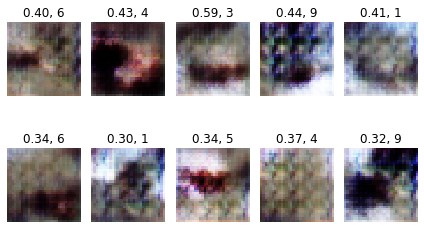

  Real Images and Discriminator Output:


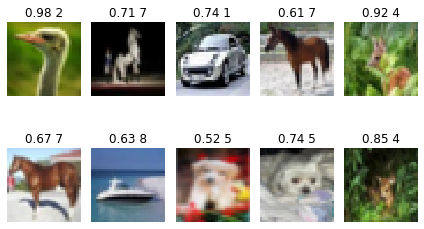

0 / 100: [0.62915194, 0.625], [0.6263463, 0.703125], [1.1610119, 0.0859375]
1 / 100: [0.5656759, 0.65625], [0.58995116, 0.765625], [1.1094643, 0.125]
2 / 100: [0.5273818, 0.796875], [0.56993043, 0.828125], [1.1294737, 0.1328125]
3 / 100: [0.61895275, 0.640625], [0.55147195, 0.8125], [1.094237, 0.0859375]
4 / 100: [0.56320846, 0.75], [0.56512636, 0.71875], [0.9882227, 0.09375]
5 / 100: [0.56497264, 0.75], [0.541493, 0.75], [1.0726904, 0.1015625]
6 / 100: [0.5986567, 0.6875], [0.58053905, 0.75], [1.049774, 0.1171875]
7 / 100: [0.620224, 0.6875], [0.58898765, 0.71875], [1.0315713, 0.109375]
8 / 100: [0.5790322, 0.6875], [0.5829122, 0.8125], [1.0274342, 0.09375]
9 / 100: [0.5575899, 0.671875], [0.55924666, 0.78125], [1.0459186, 0.140625]
10 / 100: [0.5867373, 0.671875], [0.60868543, 0.765625], [1.1408176, 0.125]
11 / 100: [0.5569056, 0.75], [0.6243138, 0.78125], [1.129282, 0.109375]
12 / 100: [0.62295794, 0.65625], [0.5868312, 0.796875], [1.1239841, 0.109375]
13 / 100: [0.5382218, 0.78125]

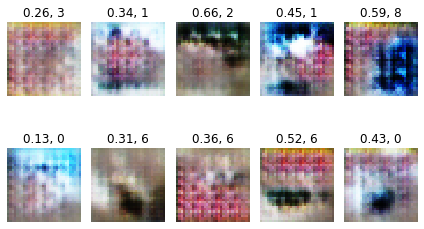

  Real Images and Discriminator Output:


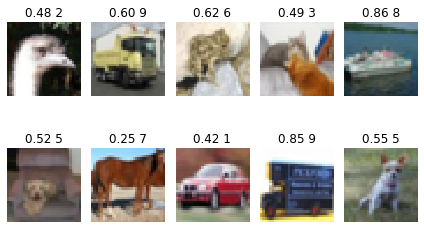

0 / 100: [0.57001793, 0.75], [0.6158389, 0.6875], [1.2580743, 0.125]
1 / 100: [0.6174842, 0.640625], [0.5689767, 0.765625], [1.1982785, 0.1015625]
2 / 100: [0.5812793, 0.734375], [0.61566806, 0.703125], [1.1085131, 0.1953125]
3 / 100: [0.6425936, 0.609375], [0.69836676, 0.59375], [1.1245192, 0.15625]
4 / 100: [0.6067785, 0.6875], [0.64326227, 0.6875], [1.1003598, 0.140625]
5 / 100: [0.63400954, 0.609375], [0.64255714, 0.71875], [1.043407, 0.2265625]
6 / 100: [0.5832926, 0.65625], [0.60913277, 0.671875], [0.95364356, 0.234375]
7 / 100: [0.63682425, 0.578125], [0.6586977, 0.625], [0.9832568, 0.234375]
8 / 100: [0.648906, 0.65625], [0.6280128, 0.671875], [0.9960861, 0.203125]
9 / 100: [0.61402905, 0.640625], [0.6336932, 0.609375], [1.0009139, 0.1484375]
10 / 100: [0.5984863, 0.6875], [0.6025071, 0.6875], [0.9542714, 0.2265625]
11 / 100: [0.63395274, 0.65625], [0.6559732, 0.578125], [1.0417917, 0.1171875]
12 / 100: [0.61002165, 0.625], [0.589705, 0.8125], [1.1039045, 0.09375]
13 / 100: [0.

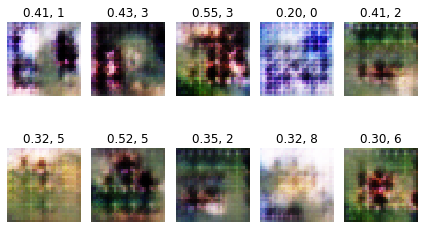

  Real Images and Discriminator Output:


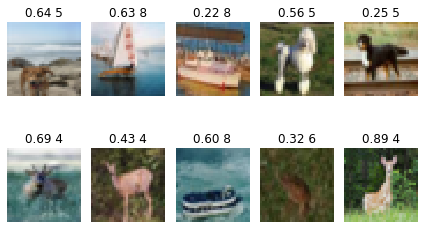

0 / 100: [0.5956913, 0.703125], [0.5796954, 0.796875], [1.1227856, 0.09375]
1 / 100: [0.57805765, 0.6875], [0.6076412, 0.703125], [1.1610118, 0.0703125]
2 / 100: [0.62896085, 0.6875], [0.57768977, 0.703125], [1.1405033, 0.03125]
3 / 100: [0.63835573, 0.640625], [0.6057307, 0.734375], [1.1021297, 0.0703125]
4 / 100: [0.56403315, 0.6875], [0.64043206, 0.609375], [1.1334903, 0.046875]
5 / 100: [0.6110329, 0.671875], [0.562884, 0.828125], [1.1016247, 0.0859375]
6 / 100: [0.56347036, 0.703125], [0.5693886, 0.796875], [1.0902079, 0.1171875]
7 / 100: [0.59934354, 0.671875], [0.6315726, 0.6875], [1.0728697, 0.078125]
8 / 100: [0.6008847, 0.6875], [0.54985213, 0.859375], [1.1131945, 0.0859375]
9 / 100: [0.635053, 0.640625], [0.5630635, 0.78125], [1.1656537, 0.0546875]
10 / 100: [0.5235821, 0.734375], [0.5442827, 0.796875], [1.0919883, 0.1015625]
11 / 100: [0.6027211, 0.640625], [0.56361055, 0.75], [1.1431308, 0.015625]
12 / 100: [0.5806612, 0.625], [0.560817, 0.765625], [1.1754909, 0.046875]
13

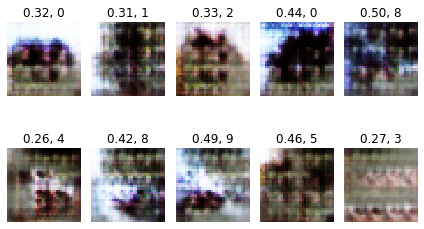

  Real Images and Discriminator Output:


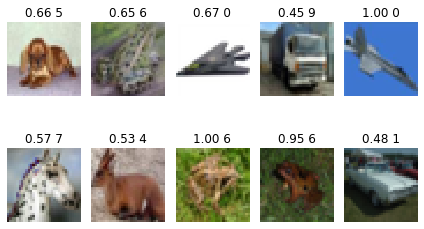

0 / 100: [0.49200404, 0.765625], [0.5195791, 0.875], [1.0460076, 0.046875]
1 / 100: [0.5173245, 0.8125], [0.5111623, 0.90625], [1.0974019, 0.0390625]
2 / 100: [0.4611221, 0.78125], [0.51937705, 0.890625], [1.0994993, 0.0703125]
3 / 100: [0.53464043, 0.671875], [0.5389825, 0.875], [1.1141057, 0.0390625]
4 / 100: [0.5429295, 0.734375], [0.53148556, 0.875], [1.120045, 0.0234375]
5 / 100: [0.50791764, 0.75], [0.5314735, 0.8125], [1.1220285, 0.078125]
6 / 100: [0.5380236, 0.71875], [0.5976013, 0.71875], [1.1054965, 0.1015625]
7 / 100: [0.5211983, 0.71875], [0.5377495, 0.8125], [1.1107353, 0.078125]
8 / 100: [0.5241695, 0.78125], [0.59234774, 0.71875], [1.0528756, 0.1796875]
9 / 100: [0.5413685, 0.703125], [0.6682681, 0.6875], [1.01066, 0.1484375]
10 / 100: [0.46305683, 0.796875], [0.64206684, 0.734375], [1.0665545, 0.1640625]
11 / 100: [0.5435533, 0.75], [0.61347985, 0.6875], [1.2329636, 0.0703125]
12 / 100: [0.47983515, 0.828125], [0.5600019, 0.796875], [1.3900132, 0.046875]
13 / 100: [0.5

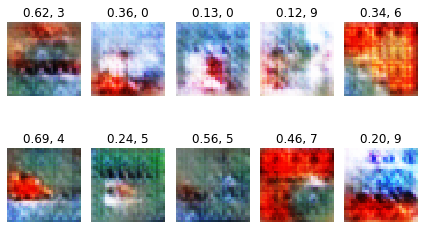

  Real Images and Discriminator Output:


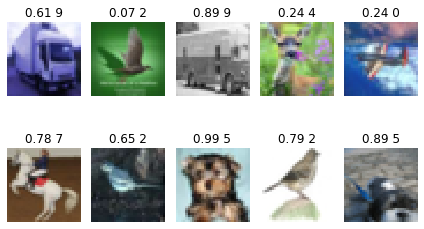

0 / 100: [0.5205897, 0.71875], [0.4967742, 0.828125], [1.9452609, 0.0390625]
1 / 100: [0.66000104, 0.625], [0.40116966, 0.921875], [1.8110396, 0.0078125]
2 / 100: [0.58170855, 0.625], [0.6064435, 0.640625], [1.6824243, 0.03125]
3 / 100: [0.5916299, 0.703125], [0.5707208, 0.734375], [1.5203476, 0.0234375]
4 / 100: [0.63391066, 0.65625], [0.5559337, 0.765625], [1.4183705, 0.1015625]
5 / 100: [0.6988827, 0.578125], [0.70541054, 0.609375], [1.3476965, 0.0546875]
6 / 100: [0.7401908, 0.46875], [0.62369525, 0.65625], [1.3248752, 0.0546875]
7 / 100: [0.8153839, 0.421875], [0.639632, 0.65625], [1.282569, 0.0625]
8 / 100: [0.74124265, 0.46875], [0.5959551, 0.71875], [1.3332317, 0.046875]
9 / 100: [0.8424487, 0.421875], [0.5105001, 0.796875], [1.4486442, 0.0703125]
10 / 100: [0.83045244, 0.40625], [0.5105471, 0.828125], [1.4214709, 0.0546875]
11 / 100: [0.698964, 0.546875], [0.4706127, 0.828125], [1.4281846, 0.0390625]
12 / 100: [0.6584723, 0.5625], [0.513608, 0.796875], [1.2760979, 0.09375]
13 

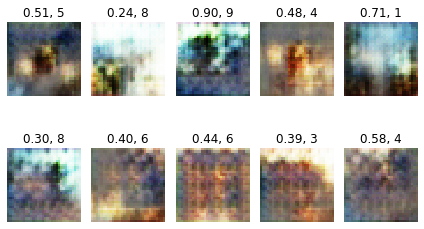

  Real Images and Discriminator Output:


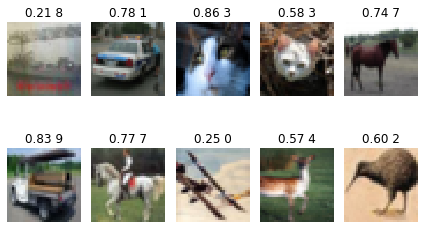

0 / 100: [0.54956496, 0.703125], [0.71812797, 0.671875], [0.9834883, 0.1796875]
1 / 100: [0.556723, 0.765625], [0.7290454, 0.671875], [1.0592784, 0.1640625]
2 / 100: [0.52254903, 0.78125], [0.5078888, 0.828125], [1.3172317, 0.140625]
3 / 100: [0.4766981, 0.765625], [0.6962894, 0.625], [1.4317584, 0.0625]
4 / 100: [0.58768696, 0.65625], [0.5057477, 0.859375], [1.3478229, 0.0859375]
5 / 100: [0.7012875, 0.546875], [0.51442426, 0.84375], [1.1774347, 0.109375]
6 / 100: [0.57958084, 0.703125], [0.58665, 0.71875], [1.2780042, 0.15625]
7 / 100: [0.54053986, 0.71875], [0.5133232, 0.78125], [1.3358072, 0.171875]
8 / 100: [0.68785584, 0.546875], [0.5642823, 0.6875], [1.2605801, 0.1875]
9 / 100: [0.5904811, 0.640625], [0.6660159, 0.703125], [1.2517741, 0.09375]
10 / 100: [0.6724225, 0.609375], [0.577345, 0.796875], [1.1742885, 0.109375]
11 / 100: [0.61788034, 0.578125], [0.5711326, 0.8125], [1.1995558, 0.0625]
12 / 100: [0.5852322, 0.625], [0.45317364, 0.921875], [1.2812564, 0.0625]
13 / 100: [0.

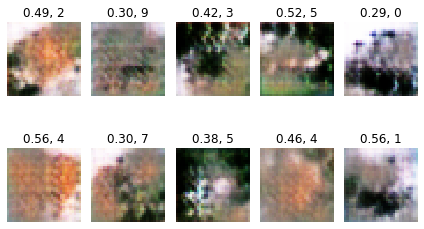

  Real Images and Discriminator Output:


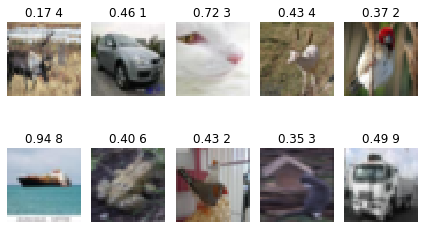

0 / 100: [0.6869761, 0.578125], [0.6794534, 0.625], [1.1590896, 0.09375]
1 / 100: [0.708027, 0.5625], [0.56047714, 0.765625], [1.265243, 0.0546875]
2 / 100: [0.823539, 0.4375], [0.571465, 0.84375], [1.1366732, 0.140625]
3 / 100: [0.74248916, 0.46875], [0.6106758, 0.703125], [1.1206826, 0.0859375]
4 / 100: [0.748085, 0.546875], [0.56695914, 0.75], [1.0084687, 0.1875]
5 / 100: [0.7298108, 0.484375], [0.6111821, 0.78125], [1.0313786, 0.2109375]
6 / 100: [0.64113176, 0.515625], [0.6281732, 0.640625], [1.0411098, 0.21875]
7 / 100: [0.68529093, 0.5], [0.5395035, 0.796875], [1.1552643, 0.09375]
8 / 100: [0.68875873, 0.515625], [0.6072385, 0.734375], [1.1586618, 0.1171875]
9 / 100: [0.7105251, 0.5625], [0.5959846, 0.71875], [1.1382744, 0.1328125]
10 / 100: [0.730271, 0.515625], [0.666287, 0.671875], [1.1448328, 0.0703125]
11 / 100: [0.6874784, 0.625], [0.5803449, 0.71875], [1.178644, 0.1015625]
12 / 100: [0.6335944, 0.625], [0.5249794, 0.828125], [1.2020535, 0.1015625]
13 / 100: [0.62195027, 0

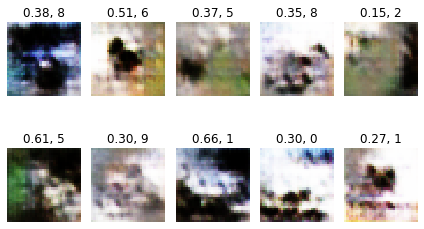

  Real Images and Discriminator Output:


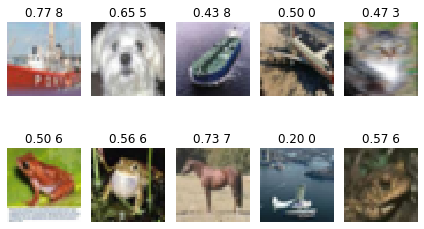

0 / 100: [0.6926695, 0.53125], [0.55061024, 0.796875], [1.1060271, 0.1328125]
1 / 100: [0.651261, 0.65625], [0.5685589, 0.8125], [1.1189606, 0.1171875]
2 / 100: [0.5736114, 0.671875], [0.577528, 0.765625], [1.1155503, 0.0625]
3 / 100: [0.6851839, 0.5625], [0.55922514, 0.78125], [1.152054, 0.0703125]
4 / 100: [0.6091925, 0.640625], [0.47007585, 0.921875], [1.1681591, 0.046875]
5 / 100: [0.5458657, 0.78125], [0.55536354, 0.8125], [1.1710033, 0.0390625]
6 / 100: [0.6103878, 0.640625], [0.5136479, 0.875], [1.23099, 0.03125]
7 / 100: [0.6471822, 0.5625], [0.50411725, 0.921875], [1.187593, 0.0390625]
8 / 100: [0.58928275, 0.65625], [0.52800643, 0.84375], [1.1633357, 0.0625]
9 / 100: [0.6609615, 0.609375], [0.556797, 0.828125], [1.1366384, 0.0625]
10 / 100: [0.5823389, 0.65625], [0.52862823, 0.859375], [1.0868974, 0.03125]
11 / 100: [0.59611154, 0.640625], [0.591992, 0.71875], [1.0206373, 0.0703125]
12 / 100: [0.5675111, 0.6875], [0.59607124, 0.703125], [1.015232, 0.1640625]
13 / 100: [0.6423

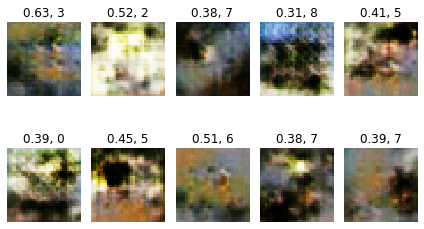

  Real Images and Discriminator Output:


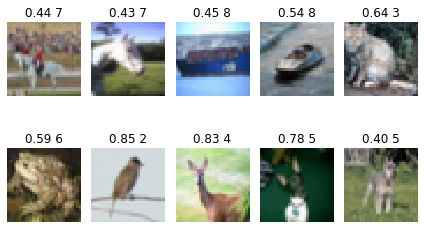

0 / 100: [0.58946955, 0.6875], [0.5233581, 0.84375], [1.0934372, 0.109375]
1 / 100: [0.66664183, 0.578125], [0.57900417, 0.75], [1.0049871, 0.171875]
2 / 100: [0.5899361, 0.6875], [0.6308805, 0.65625], [1.0069653, 0.1796875]
3 / 100: [0.58853716, 0.65625], [0.6238285, 0.703125], [0.97088337, 0.171875]
4 / 100: [0.6123823, 0.671875], [0.59979117, 0.703125], [1.0739114, 0.125]
5 / 100: [0.5176081, 0.75], [0.5197021, 0.859375], [1.1139305, 0.0625]
6 / 100: [0.58994305, 0.625], [0.5551543, 0.765625], [1.0876276, 0.140625]
7 / 100: [0.5836173, 0.703125], [0.54633975, 0.796875], [1.1111808, 0.109375]
8 / 100: [0.56524867, 0.71875], [0.60462487, 0.71875], [1.0864753, 0.125]
9 / 100: [0.59695244, 0.625], [0.5868515, 0.765625], [1.1179827, 0.125]
10 / 100: [0.6144482, 0.75], [0.62143886, 0.703125], [1.0833611, 0.140625]
11 / 100: [0.61084545, 0.65625], [0.5737018, 0.765625], [1.1080649, 0.1640625]
12 / 100: [0.6023375, 0.609375], [0.59444255, 0.6875], [1.2196703, 0.0859375]
13 / 100: [0.6710372

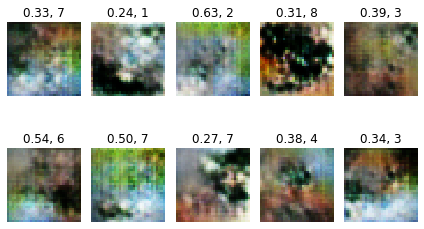

  Real Images and Discriminator Output:


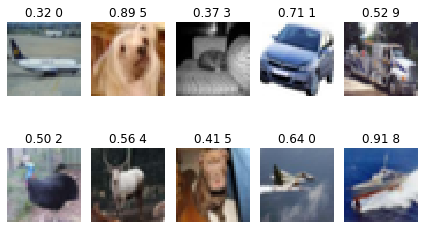

0 / 100: [0.6063616, 0.6875], [0.55204505, 0.765625], [1.0818815, 0.1640625]
1 / 100: [0.6423883, 0.609375], [0.63598585, 0.65625], [1.0094163, 0.1953125]
2 / 100: [0.63177395, 0.65625], [0.5941881, 0.640625], [1.0423727, 0.1953125]
3 / 100: [0.65992904, 0.59375], [0.63293844, 0.6875], [1.0682942, 0.078125]
4 / 100: [0.61520255, 0.671875], [0.55986506, 0.796875], [1.0375068, 0.0859375]
5 / 100: [0.58047926, 0.703125], [0.62791413, 0.65625], [1.0806818, 0.109375]
6 / 100: [0.6408343, 0.578125], [0.55349994, 0.78125], [1.1302501, 0.0546875]
7 / 100: [0.66453475, 0.578125], [0.6218848, 0.625], [1.1053424, 0.140625]
8 / 100: [0.67599833, 0.53125], [0.6175983, 0.734375], [1.0766923, 0.125]
9 / 100: [0.64899087, 0.625], [0.627297, 0.671875], [1.1078907, 0.125]
10 / 100: [0.60685325, 0.6875], [0.58233607, 0.734375], [1.1103065, 0.15625]
11 / 100: [0.6338525, 0.59375], [0.6079189, 0.78125], [1.1606097, 0.0859375]
12 / 100: [0.64385206, 0.578125], [0.5335225, 0.890625], [1.2056824, 0.0546875]
1

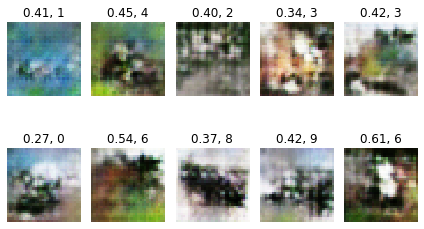

  Real Images and Discriminator Output:


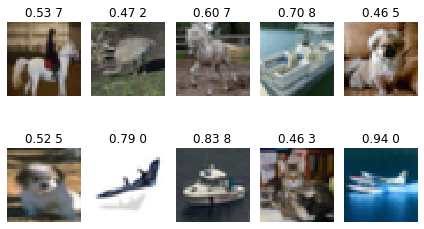

0 / 100: [0.63284034, 0.59375], [0.54198426, 0.890625], [1.1074007, 0.0859375]
1 / 100: [0.7316763, 0.484375], [0.61961716, 0.71875], [1.1409049, 0.109375]
2 / 100: [0.6633948, 0.59375], [0.5304937, 0.875], [1.0039084, 0.1640625]
3 / 100: [0.6273067, 0.671875], [0.60425365, 0.671875], [1.0494266, 0.140625]
4 / 100: [0.6385683, 0.625], [0.56523645, 0.765625], [1.1067128, 0.109375]
5 / 100: [0.60380006, 0.640625], [0.61098176, 0.6875], [1.1170565, 0.09375]
6 / 100: [0.56967556, 0.703125], [0.5171384, 0.796875], [1.1286253, 0.0546875]
7 / 100: [0.59055316, 0.703125], [0.5854952, 0.75], [1.1203972, 0.0703125]
8 / 100: [0.6165689, 0.625], [0.6203931, 0.65625], [1.0419661, 0.125]
9 / 100: [0.6182778, 0.65625], [0.6136807, 0.8125], [1.0252018, 0.109375]
10 / 100: [0.68011224, 0.59375], [0.52691704, 0.8125], [1.0492544, 0.171875]
11 / 100: [0.6565101, 0.625], [0.5931427, 0.75], [1.0262446, 0.25]
12 / 100: [0.6636002, 0.65625], [0.7077812, 0.53125], [0.9834296, 0.2109375]
13 / 100: [0.5955982, 

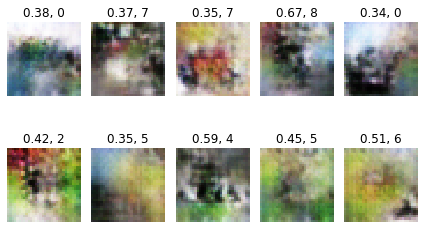

  Real Images and Discriminator Output:


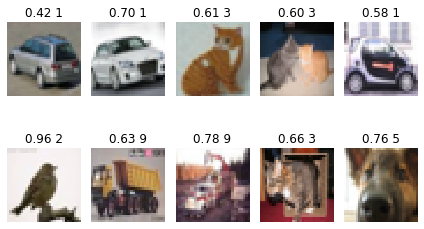

0 / 100: [0.6020845, 0.640625], [0.5935402, 0.78125], [0.9336173, 0.203125]
1 / 100: [0.62881887, 0.59375], [0.6644492, 0.609375], [0.96752346, 0.171875]
2 / 100: [0.6359028, 0.640625], [0.69186795, 0.53125], [0.9556484, 0.1640625]
3 / 100: [0.60247594, 0.6875], [0.62775314, 0.625], [0.9559711, 0.1953125]
4 / 100: [0.57891065, 0.625], [0.5878077, 0.75], [0.96823144, 0.1796875]
5 / 100: [0.6249218, 0.625], [0.5839792, 0.75], [1.0502821, 0.1640625]
6 / 100: [0.6557348, 0.59375], [0.59993935, 0.734375], [1.010529, 0.15625]
7 / 100: [0.6946369, 0.53125], [0.62582934, 0.75], [0.9830073, 0.171875]
8 / 100: [0.6635042, 0.5625], [0.6056274, 0.6875], [0.9869416, 0.171875]
9 / 100: [0.6536328, 0.65625], [0.660726, 0.640625], [1.0180244, 0.203125]
10 / 100: [0.6395966, 0.734375], [0.6084807, 0.78125], [1.0367751, 0.125]
11 / 100: [0.69614655, 0.515625], [0.6189493, 0.671875], [1.0185978, 0.1328125]
12 / 100: [0.67657703, 0.546875], [0.61393094, 0.734375], [1.010686, 0.1171875]
13 / 100: [0.662163

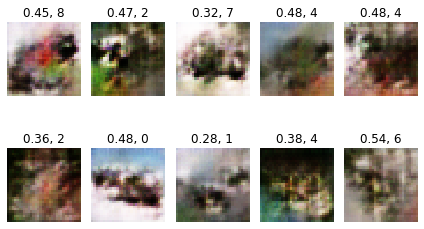

  Real Images and Discriminator Output:


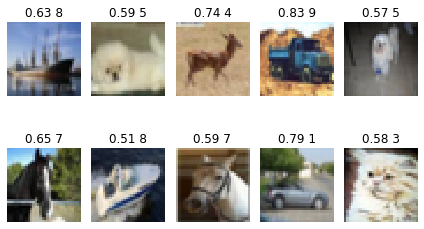

0 / 100: [0.6391011, 0.59375], [0.52660143, 0.890625], [0.9330599, 0.140625]
1 / 100: [0.54740083, 0.71875], [0.6673647, 0.671875], [1.0083079, 0.1484375]
2 / 100: [0.5501208, 0.703125], [0.6757473, 0.671875], [1.022891, 0.171875]
3 / 100: [0.5672586, 0.71875], [0.6110257, 0.75], [0.97606957, 0.140625]
4 / 100: [0.59724504, 0.65625], [0.6903458, 0.59375], [1.0013397, 0.171875]
5 / 100: [0.5932605, 0.71875], [0.69753075, 0.546875], [1.0795501, 0.109375]
6 / 100: [0.5957691, 0.640625], [0.52637804, 0.84375], [1.2504653, 0.0625]
7 / 100: [0.6803851, 0.53125], [0.46284038, 0.890625], [1.3300798, 0.0390625]
8 / 100: [0.66054356, 0.5], [0.5004492, 0.90625], [1.1904235, 0.0546875]
9 / 100: [0.62362874, 0.625], [0.5307899, 0.890625], [1.135714, 0.1171875]
10 / 100: [0.58357996, 0.6875], [0.5984212, 0.78125], [1.0642338, 0.140625]
11 / 100: [0.58290356, 0.75], [0.71027166, 0.65625], [1.0596278, 0.1015625]
12 / 100: [0.56979734, 0.6875], [0.5951658, 0.734375], [0.9909437, 0.171875]
13 / 100: [0.

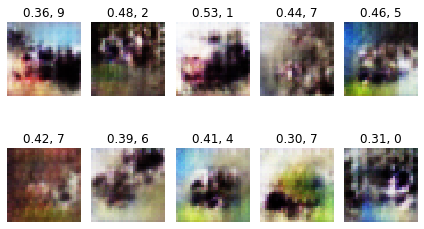

  Real Images and Discriminator Output:


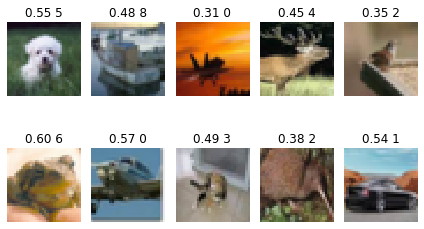

0 / 100: [0.6901563, 0.484375], [0.60447025, 0.734375], [1.0098995, 0.1171875]
1 / 100: [0.65287554, 0.5625], [0.64677024, 0.640625], [1.0879819, 0.125]
2 / 100: [0.6308305, 0.640625], [0.55371255, 0.8125], [1.1149697, 0.078125]
3 / 100: [0.60247767, 0.609375], [0.5034184, 0.84375], [1.1851325, 0.0390625]
4 / 100: [0.64093137, 0.5625], [0.51225364, 0.796875], [1.1842864, 0.0546875]
5 / 100: [0.6150521, 0.671875], [0.50108504, 0.84375], [1.1827439, 0.0859375]
6 / 100: [0.5853849, 0.65625], [0.5243359, 0.84375], [1.1184989, 0.0859375]
7 / 100: [0.6371298, 0.671875], [0.65429425, 0.625], [1.0921206, 0.140625]
8 / 100: [0.59718835, 0.65625], [0.6228006, 0.75], [1.0796429, 0.1328125]
9 / 100: [0.61820364, 0.6875], [0.54929423, 0.71875], [1.0235075, 0.2109375]
10 / 100: [0.6486003, 0.609375], [0.6466367, 0.65625], [0.98345643, 0.25]
11 / 100: [0.58617055, 0.640625], [0.64991325, 0.578125], [1.0482767, 0.1640625]
12 / 100: [0.61974525, 0.671875], [0.6469073, 0.734375], [0.9869336, 0.1640625]


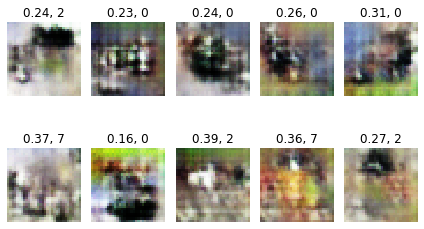

  Real Images and Discriminator Output:


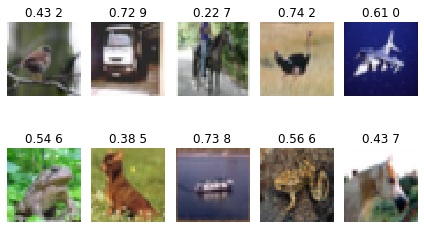

0 / 100: [0.6142133, 0.671875], [0.598163, 0.734375], [1.1612791, 0.0625]
1 / 100: [0.6544159, 0.578125], [0.54310083, 0.828125], [1.1194004, 0.046875]
2 / 100: [0.6367428, 0.640625], [0.57432854, 0.78125], [1.1507833, 0.078125]
3 / 100: [0.6607372, 0.578125], [0.5186957, 0.84375], [1.1485226, 0.1015625]
4 / 100: [0.5540457, 0.734375], [0.6097524, 0.78125], [1.0464267, 0.140625]
5 / 100: [0.5183538, 0.75], [0.6558933, 0.625], [1.0559407, 0.171875]
6 / 100: [0.55053234, 0.78125], [0.67447364, 0.578125], [0.9471725, 0.2265625]
7 / 100: [0.60649073, 0.640625], [0.5766649, 0.78125], [1.0456808, 0.171875]
8 / 100: [0.59065855, 0.765625], [0.5922836, 0.734375], [1.148521, 0.1015625]
9 / 100: [0.6292333, 0.5625], [0.5288261, 0.765625], [1.1913409, 0.109375]
10 / 100: [0.5414145, 0.78125], [0.6049056, 0.75], [1.1023129, 0.125]
11 / 100: [0.5741943, 0.671875], [0.5341282, 0.796875], [1.0843799, 0.15625]
12 / 100: [0.60246056, 0.671875], [0.5696653, 0.78125], [1.0419102, 0.1796875]
13 / 100: [0.

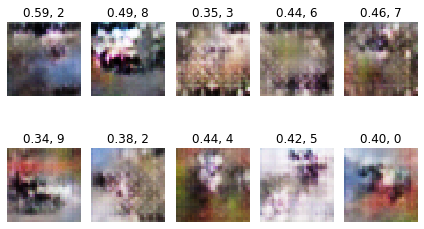

  Real Images and Discriminator Output:


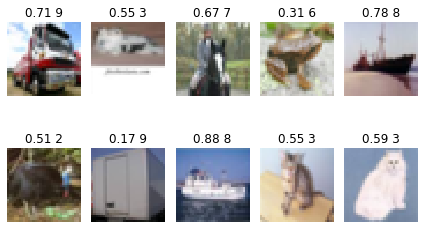

0 / 100: [0.6749927, 0.53125], [0.5679312, 0.78125], [1.2827106, 0.0546875]
1 / 100: [0.7036105, 0.53125], [0.5119935, 0.828125], [1.289252, 0.015625]
2 / 100: [0.68473345, 0.515625], [0.5166106, 0.796875], [1.197855, 0.078125]
3 / 100: [0.6517161, 0.546875], [0.50635856, 0.8125], [1.1171279, 0.109375]
4 / 100: [0.5596279, 0.640625], [0.5988486, 0.734375], [1.1357298, 0.1015625]
5 / 100: [0.6815202, 0.609375], [0.61843866, 0.734375], [1.1561205, 0.0703125]
6 / 100: [0.68733954, 0.609375], [0.5368202, 0.84375], [1.2104208, 0.109375]
7 / 100: [0.580404, 0.671875], [0.52206975, 0.828125], [1.2354999, 0.09375]
8 / 100: [0.58129454, 0.671875], [0.600032, 0.71875], [1.2432879, 0.09375]
9 / 100: [0.5316058, 0.78125], [0.4908301, 0.875], [1.2881156, 0.0390625]
10 / 100: [0.6377317, 0.703125], [0.48654568, 0.859375], [1.2617316, 0.0703125]
11 / 100: [0.62499356, 0.65625], [0.55285573, 0.828125], [1.1732341, 0.0546875]
12 / 100: [0.58400303, 0.734375], [0.57954526, 0.71875], [1.1133527, 0.125]
1

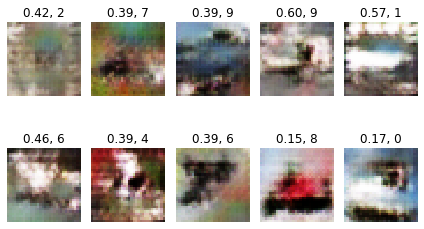

  Real Images and Discriminator Output:


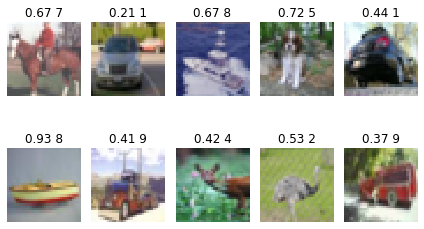

0 / 100: [0.61143994, 0.6875], [0.6160816, 0.6875], [1.0873809, 0.1015625]
1 / 100: [0.61435664, 0.703125], [0.62326187, 0.703125], [1.1024618, 0.1484375]
2 / 100: [0.5563849, 0.703125], [0.5848406, 0.75], [1.1557825, 0.0859375]
3 / 100: [0.6882137, 0.578125], [0.5861225, 0.78125], [1.1567888, 0.125]
4 / 100: [0.65334845, 0.609375], [0.5765357, 0.71875], [1.142195, 0.140625]
5 / 100: [0.6332762, 0.671875], [0.6202959, 0.671875], [1.1268961, 0.171875]
6 / 100: [0.60060936, 0.640625], [0.54469466, 0.859375], [1.1314158, 0.140625]
7 / 100: [0.645972, 0.59375], [0.5560749, 0.78125], [1.1269192, 0.1484375]
8 / 100: [0.58082247, 0.625], [0.53685117, 0.796875], [1.2494588, 0.0546875]
9 / 100: [0.61691487, 0.65625], [0.49556977, 0.875], [1.2724354, 0.0625]
10 / 100: [0.64082545, 0.625], [0.54942983, 0.78125], [1.2296672, 0.0859375]
11 / 100: [0.7006782, 0.53125], [0.61130536, 0.71875], [1.1397172, 0.125]
12 / 100: [0.59376466, 0.71875], [0.61599654, 0.71875], [1.1040144, 0.1171875]
13 / 100: [

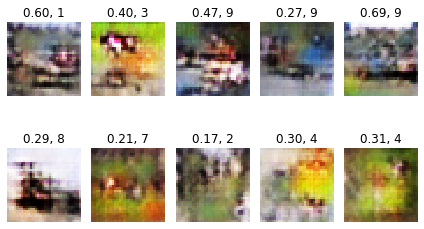

  Real Images and Discriminator Output:


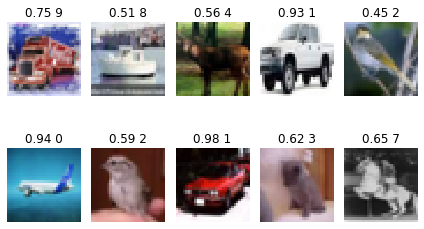

0 / 100: [0.636657, 0.640625], [0.5309375, 0.828125], [1.1616235, 0.09375]
1 / 100: [0.5874512, 0.671875], [0.51474357, 0.890625], [1.1369367, 0.1015625]
2 / 100: [0.6061685, 0.65625], [0.536412, 0.8125], [1.0888402, 0.15625]
3 / 100: [0.5705512, 0.640625], [0.5561731, 0.734375], [1.1667609, 0.0859375]
4 / 100: [0.49315315, 0.828125], [0.5433934, 0.796875], [1.2435474, 0.078125]
5 / 100: [0.5564046, 0.640625], [0.53353286, 0.859375], [1.1412287, 0.1328125]
6 / 100: [0.5567355, 0.6875], [0.5288594, 0.84375], [1.0419548, 0.171875]
7 / 100: [0.63125014, 0.6875], [0.6351311, 0.71875], [1.0445206, 0.171875]
8 / 100: [0.59385175, 0.71875], [0.68001944, 0.625], [1.0490553, 0.1953125]
9 / 100: [0.61330605, 0.65625], [0.6060847, 0.6875], [1.0975398, 0.234375]
10 / 100: [0.59086406, 0.671875], [0.6651912, 0.5625], [1.2093556, 0.078125]
11 / 100: [0.6068889, 0.640625], [0.5178275, 0.875], [1.2418435, 0.0390625]
12 / 100: [0.67958707, 0.59375], [0.54735106, 0.8125], [1.2308717, 0.0859375]
13 / 100

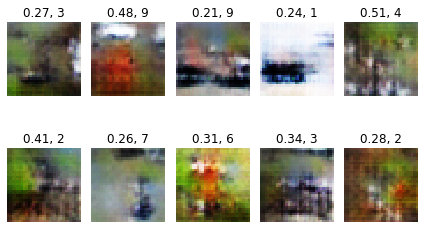

  Real Images and Discriminator Output:


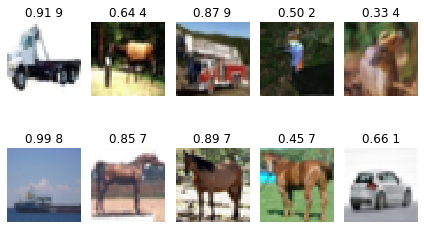

0 / 100: [0.7951163, 0.5], [0.65651506, 0.640625], [1.1994278, 0.1328125]
1 / 100: [0.6869478, 0.546875], [0.59876955, 0.734375], [1.217121, 0.1328125]
2 / 100: [0.6629309, 0.59375], [0.5295883, 0.828125], [1.1624668, 0.203125]
3 / 100: [0.6026528, 0.640625], [0.65259176, 0.71875], [1.3056059, 0.0703125]
4 / 100: [0.6839121, 0.578125], [0.591737, 0.671875], [1.3773627, 0.0625]
5 / 100: [0.71086794, 0.5625], [0.49701554, 0.796875], [1.3787348, 0.0703125]
6 / 100: [0.7313695, 0.46875], [0.4570229, 0.890625], [1.285847, 0.0859375]
7 / 100: [0.6066004, 0.6875], [0.50706303, 0.828125], [1.1730247, 0.15625]
8 / 100: [0.51797545, 0.703125], [0.66016096, 0.6875], [1.1664562, 0.15625]
9 / 100: [0.56224567, 0.734375], [0.6958387, 0.609375], [1.1809275, 0.1015625]
10 / 100: [0.7396488, 0.5625], [0.6392768, 0.65625], [1.1838983, 0.1484375]
11 / 100: [0.66273105, 0.546875], [0.5430887, 0.78125], [1.2667027, 0.09375]
12 / 100: [0.7183305, 0.484375], [0.6197231, 0.703125], [1.3727903, 0.0234375]
13 /

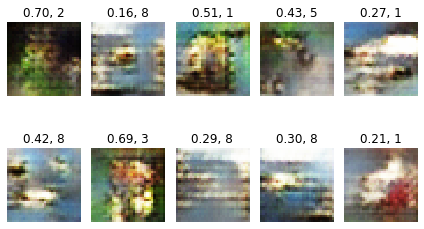

  Real Images and Discriminator Output:


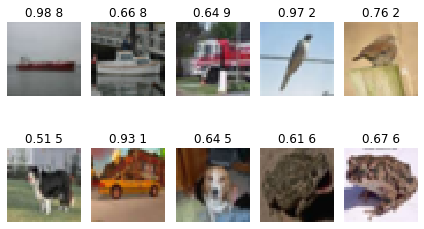

0 / 100: [0.5982499, 0.6875], [0.6225441, 0.65625], [1.1733903, 0.1171875]
1 / 100: [0.66662216, 0.609375], [0.599492, 0.75], [1.2710409, 0.0546875]
2 / 100: [0.6595057, 0.59375], [0.5387035, 0.78125], [1.3450879, 0.03125]
3 / 100: [0.53612345, 0.734375], [0.53549075, 0.78125], [1.4721789, 0.03125]
4 / 100: [0.6518181, 0.609375], [0.5177032, 0.859375], [1.3026931, 0.046875]
5 / 100: [0.6579462, 0.578125], [0.57674253, 0.8125], [1.1873758, 0.0859375]
6 / 100: [0.6012278, 0.671875], [0.55488414, 0.859375], [1.2552843, 0.1015625]
7 / 100: [0.57722056, 0.703125], [0.44785348, 0.890625], [1.2614788, 0.0703125]
8 / 100: [0.6404674, 0.59375], [0.6325936, 0.78125], [1.2957121, 0.1015625]
9 / 100: [0.5057128, 0.78125], [0.44984648, 0.953125], [1.2757865, 0.0625]
10 / 100: [0.5814942, 0.65625], [0.5472951, 0.78125], [1.3262928, 0.0703125]
11 / 100: [0.5724857, 0.703125], [0.51320136, 0.84375], [1.1312735, 0.1328125]
12 / 100: [0.5898911, 0.65625], [0.6338366, 0.734375], [1.2192374, 0.1015625]
13

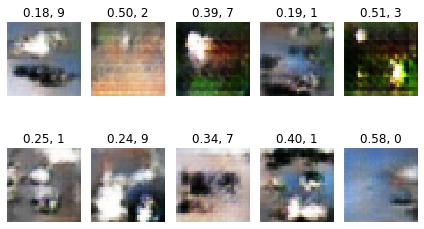

  Real Images and Discriminator Output:


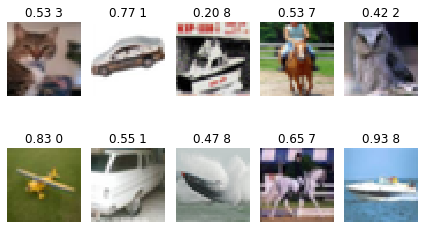

0 / 100: [0.613836, 0.65625], [0.5851428, 0.765625], [1.0814052, 0.1796875]
1 / 100: [0.6102522, 0.6875], [0.5494317, 0.8125], [0.9998383, 0.1953125]
2 / 100: [0.5884737, 0.6875], [0.63049036, 0.640625], [0.9996813, 0.234375]
3 / 100: [0.63034445, 0.734375], [0.64560497, 0.671875], [0.9506829, 0.3515625]
4 / 100: [0.5930161, 0.703125], [0.66928154, 0.578125], [0.94108343, 0.2421875]
5 / 100: [0.57208943, 0.703125], [0.69042075, 0.546875], [0.9253562, 0.28125]
6 / 100: [0.60625887, 0.609375], [0.6185632, 0.640625], [1.0002766, 0.1796875]
7 / 100: [0.6532556, 0.59375], [0.5894432, 0.703125], [0.97660935, 0.25]
8 / 100: [0.5371928, 0.734375], [0.62465763, 0.734375], [1.0747598, 0.109375]
9 / 100: [0.57518184, 0.640625], [0.50761014, 0.875], [1.1730328, 0.1015625]
10 / 100: [0.5416887, 0.71875], [0.49375653, 0.890625], [1.2032022, 0.0859375]
11 / 100: [0.5032821, 0.8125], [0.5063854, 0.890625], [1.1830163, 0.0703125]
12 / 100: [0.60393107, 0.609375], [0.53602046, 0.8125], [1.1682906, 0.078

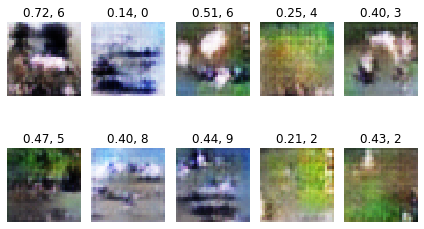

  Real Images and Discriminator Output:


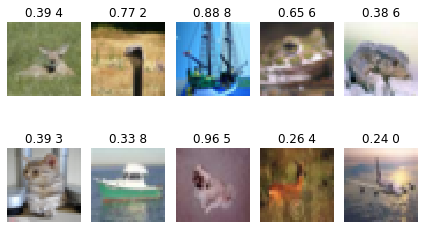

0 / 100: [0.54845655, 0.78125], [0.58295625, 0.65625], [1.0921361, 0.171875]
1 / 100: [0.5699551, 0.703125], [0.6369318, 0.734375], [1.0448765, 0.203125]
2 / 100: [0.53526974, 0.734375], [0.7533062, 0.53125], [1.1671779, 0.1328125]
3 / 100: [0.6500293, 0.59375], [0.49718675, 0.875], [1.2109399, 0.09375]
4 / 100: [0.7303194, 0.5], [0.58345854, 0.828125], [1.1512542, 0.1328125]
5 / 100: [0.6260259, 0.640625], [0.6260518, 0.734375], [1.1044822, 0.09375]
6 / 100: [0.6183382, 0.640625], [0.5973281, 0.734375], [1.1270283, 0.140625]
7 / 100: [0.5725988, 0.71875], [0.5897316, 0.734375], [1.23407, 0.0390625]
8 / 100: [0.57261014, 0.75], [0.5082245, 0.828125], [1.1831702, 0.09375]
9 / 100: [0.48633453, 0.78125], [0.574592, 0.75], [1.1461695, 0.1484375]
10 / 100: [0.53528225, 0.765625], [0.73297924, 0.640625], [1.1882166, 0.1328125]
11 / 100: [0.637633, 0.640625], [0.61279315, 0.734375], [1.2336526, 0.0859375]
12 / 100: [0.67584455, 0.609375], [0.6304867, 0.734375], [1.1469855, 0.09375]
13 / 100:

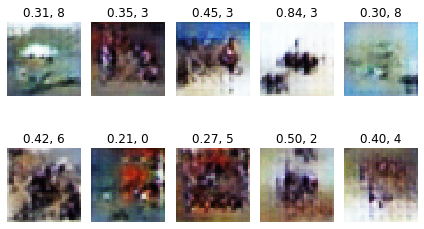

  Real Images and Discriminator Output:


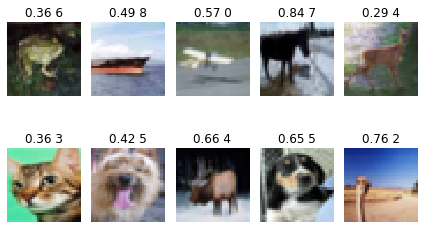

0 / 100: [0.68223494, 0.578125], [0.6205202, 0.6875], [1.1224493, 0.1640625]
1 / 100: [0.639801, 0.59375], [0.6285331, 0.703125], [1.2076797, 0.125]
2 / 100: [0.7130222, 0.53125], [0.7049289, 0.703125], [1.3725675, 0.0234375]
3 / 100: [0.68270445, 0.578125], [0.43708342, 0.921875], [1.5111965, 0.0078125]
4 / 100: [0.71554434, 0.546875], [0.48078108, 0.875], [1.3594384, 0.046875]
5 / 100: [0.6815506, 0.5625], [0.6181187, 0.65625], [1.111681, 0.09375]
6 / 100: [0.52937776, 0.75], [0.66492236, 0.640625], [1.06134, 0.1328125]
7 / 100: [0.5680454, 0.6875], [0.702411, 0.5625], [1.0474751, 0.125]
8 / 100: [0.6162518, 0.71875], [0.64904773, 0.65625], [0.9528962, 0.28125]
9 / 100: [0.6527407, 0.59375], [0.7279829, 0.578125], [0.99945235, 0.1953125]
10 / 100: [0.59355736, 0.71875], [0.65026045, 0.609375], [1.0116372, 0.1953125]
11 / 100: [0.6748779, 0.59375], [0.6663952, 0.65625], [1.0320086, 0.2265625]
12 / 100: [0.6019236, 0.671875], [0.6252818, 0.703125], [1.035919, 0.1640625]
13 / 100: [0.56

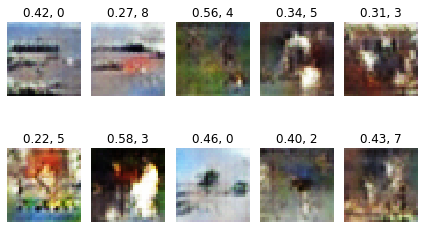

  Real Images and Discriminator Output:


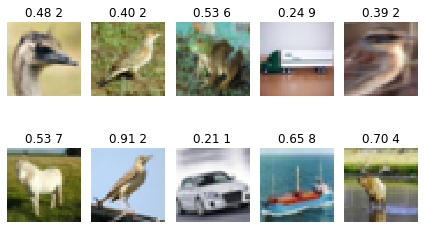

0 / 100: [0.70891225, 0.578125], [0.55043083, 0.78125], [1.0328412, 0.1640625]
1 / 100: [0.67241454, 0.609375], [0.7323127, 0.5625], [1.0557549, 0.140625]
2 / 100: [0.6184896, 0.609375], [0.6125542, 0.640625], [1.1242673, 0.0703125]
3 / 100: [0.59706783, 0.65625], [0.5480263, 0.78125], [1.097166, 0.0703125]
4 / 100: [0.623317, 0.625], [0.5441952, 0.734375], [1.1435559, 0.0390625]
5 / 100: [0.5857698, 0.75], [0.54761183, 0.828125], [1.0393869, 0.1796875]
6 / 100: [0.60683376, 0.59375], [0.5965595, 0.703125], [1.0709927, 0.15625]
7 / 100: [0.5701706, 0.671875], [0.56913733, 0.75], [1.1379001, 0.078125]
8 / 100: [0.61787856, 0.6875], [0.588318, 0.75], [1.156248, 0.109375]
9 / 100: [0.53864163, 0.796875], [0.52490705, 0.8125], [1.0377209, 0.1640625]
10 / 100: [0.6144409, 0.6875], [0.6348747, 0.703125], [1.0431406, 0.1328125]
11 / 100: [0.5673641, 0.734375], [0.5689212, 0.78125], [1.0839416, 0.1015625]
12 / 100: [0.5988873, 0.65625], [0.5209235, 0.78125], [1.1993022, 0.046875]
13 / 100: [0.

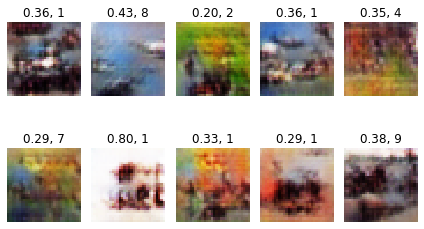

  Real Images and Discriminator Output:


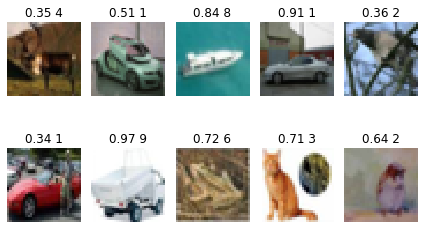

0 / 100: [0.72576153, 0.53125], [0.67247283, 0.6875], [1.0840119, 0.1328125]
1 / 100: [0.7205215, 0.546875], [0.5263738, 0.859375], [1.0987835, 0.0625]
2 / 100: [0.7080127, 0.515625], [0.5891957, 0.75], [1.1199449, 0.109375]
3 / 100: [0.550123, 0.6875], [0.62373763, 0.75], [1.0745027, 0.125]
4 / 100: [0.58115935, 0.6875], [0.525946, 0.828125], [1.1179534, 0.09375]
5 / 100: [0.5888386, 0.6875], [0.62313086, 0.6875], [1.0731883, 0.1484375]
6 / 100: [0.6165015, 0.703125], [0.6440316, 0.703125], [1.0949581, 0.109375]
7 / 100: [0.64246523, 0.65625], [0.5554901, 0.828125], [1.0585468, 0.140625]
8 / 100: [0.65035546, 0.609375], [0.5812166, 0.796875], [1.1264336, 0.078125]
9 / 100: [0.59943306, 0.640625], [0.55324835, 0.796875], [1.2357845, 0.0390625]
10 / 100: [0.61262274, 0.640625], [0.51060706, 0.859375], [1.2776728, 0.0625]
11 / 100: [0.5852181, 0.671875], [0.5443785, 0.84375], [1.2032073, 0.0703125]
12 / 100: [0.58570254, 0.71875], [0.60818505, 0.703125], [1.1666393, 0.078125]
13 / 100: [

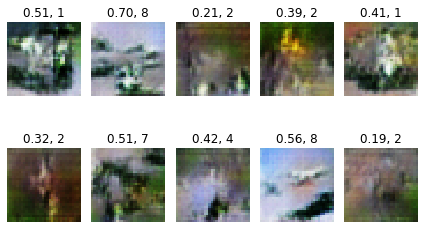

  Real Images and Discriminator Output:


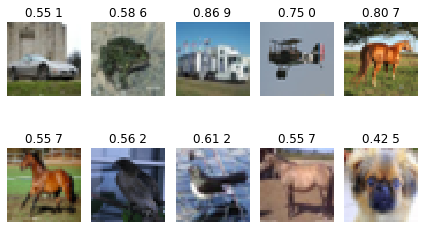

0 / 100: [0.61524266, 0.6875], [0.73340595, 0.625], [1.1025364, 0.1484375]
1 / 100: [0.6870484, 0.625], [0.56805634, 0.765625], [1.0677829, 0.1328125]
2 / 100: [0.648577, 0.578125], [0.59039235, 0.796875], [1.0311445, 0.140625]
3 / 100: [0.56383836, 0.75], [0.69820917, 0.640625], [1.0484049, 0.1015625]
4 / 100: [0.6163347, 0.65625], [0.6714187, 0.578125], [1.0608358, 0.1328125]
5 / 100: [0.61420405, 0.640625], [0.61877835, 0.71875], [1.1008319, 0.0703125]
6 / 100: [0.65503836, 0.515625], [0.57286954, 0.859375], [1.0830064, 0.0859375]
7 / 100: [0.70392764, 0.5], [0.57373726, 0.78125], [1.0010263, 0.140625]
8 / 100: [0.59308195, 0.625], [0.588747, 0.71875], [1.1644603, 0.1015625]
9 / 100: [0.6918467, 0.53125], [0.54428613, 0.828125], [1.1267463, 0.125]
10 / 100: [0.5727288, 0.65625], [0.6104437, 0.703125], [1.1263549, 0.1015625]
11 / 100: [0.6951731, 0.578125], [0.5911279, 0.734375], [1.1549202, 0.078125]
12 / 100: [0.70127344, 0.5], [0.48455495, 0.875], [1.097038, 0.125]
13 / 100: [0.53

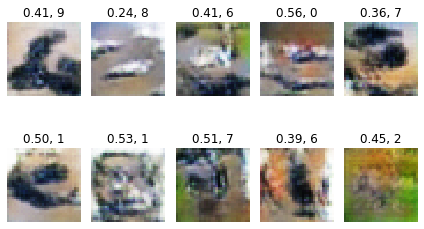

  Real Images and Discriminator Output:


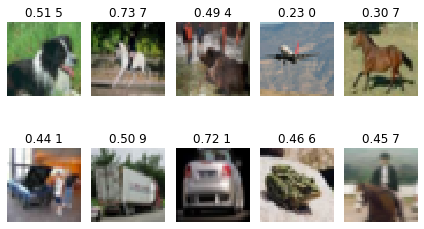

0 / 100: [0.63326293, 0.59375], [0.6058196, 0.78125], [1.0324031, 0.109375]
1 / 100: [0.60026693, 0.734375], [0.61156243, 0.71875], [1.048909, 0.09375]
2 / 100: [0.72575355, 0.546875], [0.56671625, 0.765625], [1.077031, 0.09375]
3 / 100: [0.6821972, 0.515625], [0.53876734, 0.859375], [1.0820318, 0.09375]
4 / 100: [0.6369977, 0.609375], [0.53994906, 0.84375], [0.9718818, 0.1484375]
5 / 100: [0.6347942, 0.640625], [0.58928275, 0.75], [0.9878659, 0.1171875]
6 / 100: [0.5972498, 0.671875], [0.56249607, 0.8125], [0.94788456, 0.1796875]
7 / 100: [0.5874933, 0.65625], [0.62828106, 0.65625], [0.98309726, 0.21875]
8 / 100: [0.56503356, 0.765625], [0.6464927, 0.78125], [0.99336475, 0.1796875]
9 / 100: [0.56413823, 0.734375], [0.546612, 0.78125], [1.0489836, 0.125]
10 / 100: [0.6024137, 0.65625], [0.5735558, 0.734375], [1.0201812, 0.1015625]
11 / 100: [0.6626377, 0.625], [0.5824959, 0.765625], [1.0532532, 0.1640625]
12 / 100: [0.62081236, 0.609375], [0.56427026, 0.796875], [0.97951525, 0.203125]


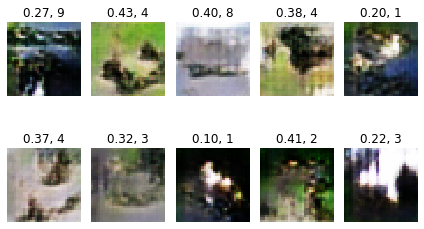

  Real Images and Discriminator Output:


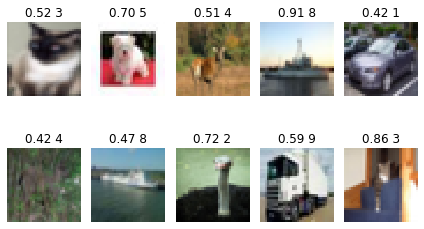

0 / 100: [0.64652723, 0.578125], [0.60337114, 0.796875], [1.1098512, 0.1171875]
1 / 100: [0.6066245, 0.6875], [0.6363956, 0.703125], [1.0133063, 0.15625]
2 / 100: [0.65123963, 0.578125], [0.6537822, 0.5625], [1.0040376, 0.21875]
3 / 100: [0.65245396, 0.609375], [0.5725229, 0.734375], [1.1380521, 0.1171875]
4 / 100: [0.6007226, 0.6875], [0.6468576, 0.65625], [1.1036047, 0.140625]
5 / 100: [0.598912, 0.765625], [0.62195706, 0.671875], [1.0529649, 0.109375]
6 / 100: [0.6628103, 0.578125], [0.59199136, 0.765625], [1.0291703, 0.1171875]
7 / 100: [0.5688224, 0.6875], [0.6375128, 0.65625], [1.0395405, 0.1015625]
8 / 100: [0.5923619, 0.6875], [0.61807376, 0.640625], [1.0391407, 0.1328125]
9 / 100: [0.65388805, 0.546875], [0.6098443, 0.765625], [0.9709039, 0.1484375]
10 / 100: [0.58612114, 0.6875], [0.5948457, 0.75], [1.0395544, 0.109375]
11 / 100: [0.58586144, 0.65625], [0.53475153, 0.765625], [1.0231695, 0.140625]
12 / 100: [0.6896796, 0.5], [0.5468111, 0.796875], [1.0269895, 0.171875]
13 / 1

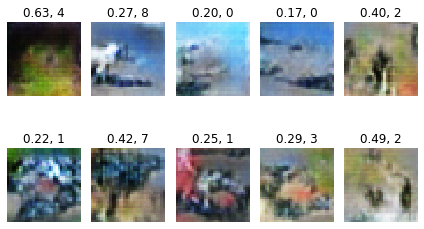

  Real Images and Discriminator Output:


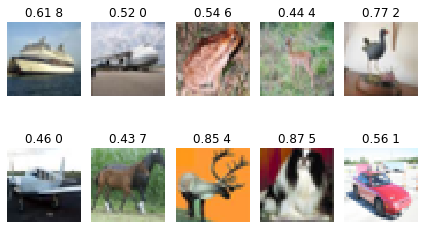

0 / 100: [0.63530624, 0.625], [0.47717988, 0.84375], [1.222626, 0.1015625]
1 / 100: [0.66596913, 0.578125], [0.56847095, 0.796875], [1.113702, 0.1328125]
2 / 100: [0.6522059, 0.640625], [0.6028394, 0.765625], [1.0072367, 0.15625]
3 / 100: [0.6310842, 0.578125], [0.6106919, 0.6875], [1.0329373, 0.140625]
4 / 100: [0.61690444, 0.640625], [0.58538616, 0.75], [0.97509146, 0.1484375]
5 / 100: [0.60090697, 0.671875], [0.6263901, 0.65625], [0.947224, 0.1875]
6 / 100: [0.6498807, 0.640625], [0.58527994, 0.703125], [0.96383196, 0.1875]
7 / 100: [0.5935838, 0.6875], [0.6181383, 0.734375], [0.9766155, 0.15625]
8 / 100: [0.68874955, 0.5625], [0.6539944, 0.640625], [0.9970606, 0.1640625]
9 / 100: [0.6258334, 0.703125], [0.6017898, 0.703125], [1.0180677, 0.21875]
10 / 100: [0.59820664, 0.703125], [0.66636777, 0.640625], [0.99236953, 0.203125]
11 / 100: [0.6325644, 0.640625], [0.63976943, 0.578125], [1.0188086, 0.203125]
12 / 100: [0.643448, 0.625], [0.630349, 0.640625], [0.9584879, 0.21875]
13 / 100

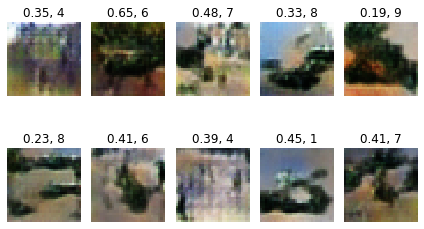

  Real Images and Discriminator Output:


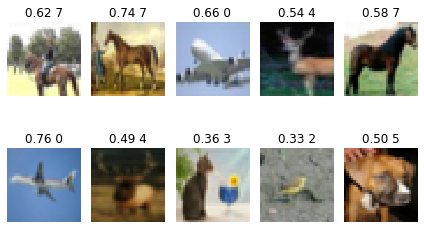

0 / 100: [0.730786, 0.484375], [0.5591116, 0.734375], [1.110659, 0.109375]
1 / 100: [0.7076217, 0.515625], [0.5959327, 0.765625], [1.0414536, 0.1328125]
2 / 100: [0.67145544, 0.609375], [0.5439032, 0.828125], [0.9853422, 0.15625]
3 / 100: [0.6070099, 0.640625], [0.57674336, 0.796875], [0.90356266, 0.2421875]
4 / 100: [0.62046707, 0.59375], [0.7321591, 0.5625], [0.9280896, 0.2421875]
5 / 100: [0.6137706, 0.65625], [0.745729, 0.5], [0.9592236, 0.1171875]
6 / 100: [0.6683033, 0.46875], [0.6081908, 0.765625], [1.0348232, 0.1328125]
7 / 100: [0.66244125, 0.625], [0.61158496, 0.75], [1.0954149, 0.0859375]
8 / 100: [0.7176548, 0.515625], [0.57733154, 0.78125], [1.0733293, 0.1015625]
9 / 100: [0.6547872, 0.578125], [0.5822363, 0.78125], [1.0419768, 0.1640625]
10 / 100: [0.6163904, 0.671875], [0.5844339, 0.765625], [0.97839326, 0.203125]
11 / 100: [0.60679966, 0.71875], [0.64809036, 0.671875], [0.87553966, 0.328125]
12 / 100: [0.60078585, 0.65625], [0.7404652, 0.578125], [0.93401694, 0.3125]
13

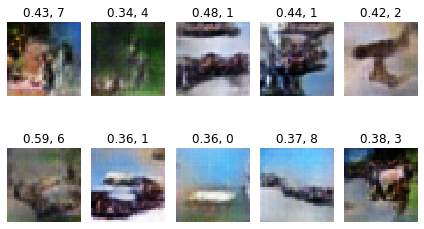

  Real Images and Discriminator Output:


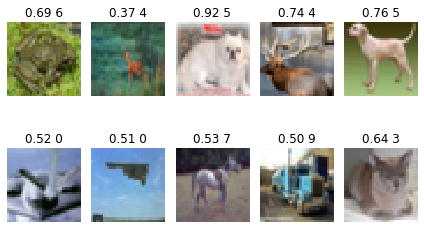

0 / 100: [0.68012524, 0.5625], [0.6237961, 0.703125], [0.9606666, 0.1640625]
1 / 100: [0.6340617, 0.609375], [0.6392694, 0.6875], [0.8789716, 0.265625]
2 / 100: [0.61118394, 0.671875], [0.6927066, 0.578125], [0.82019055, 0.3515625]
3 / 100: [0.6355977, 0.6875], [0.7266245, 0.5], [0.87293994, 0.28125]
4 / 100: [0.69111824, 0.53125], [0.63737, 0.65625], [0.9663356, 0.15625]
5 / 100: [0.6412454, 0.625], [0.5756556, 0.71875], [1.0274541, 0.15625]
6 / 100: [0.5226318, 0.84375], [0.59275985, 0.71875], [1.0444484, 0.15625]
7 / 100: [0.55924547, 0.71875], [0.6126187, 0.71875], [0.96408737, 0.234375]
8 / 100: [0.6013813, 0.640625], [0.66566193, 0.65625], [0.97274715, 0.1875]
9 / 100: [0.5756039, 0.71875], [0.65626043, 0.65625], [0.964331, 0.2265625]
10 / 100: [0.6289489, 0.65625], [0.6199657, 0.71875], [0.997921, 0.1875]
11 / 100: [0.6323602, 0.59375], [0.58849204, 0.71875], [1.0383797, 0.125]
12 / 100: [0.66423297, 0.609375], [0.57829726, 0.734375], [0.9995034, 0.171875]
13 / 100: [0.6601003, 

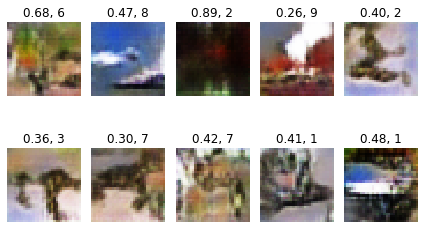

  Real Images and Discriminator Output:


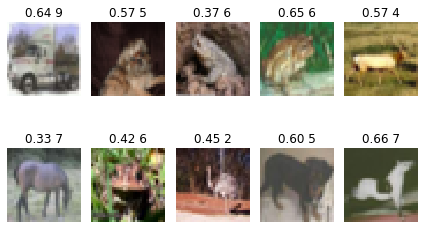

0 / 100: [0.6528183, 0.671875], [0.7594792, 0.421875], [0.91863525, 0.1484375]
1 / 100: [0.698681, 0.53125], [0.71109664, 0.59375], [0.9231846, 0.265625]
2 / 100: [0.6819407, 0.515625], [0.57639694, 0.78125], [0.99268675, 0.1796875]
3 / 100: [0.62378013, 0.53125], [0.595153, 0.78125], [0.9963104, 0.1953125]
4 / 100: [0.666866, 0.609375], [0.55178094, 0.8125], [1.0014694, 0.1953125]
5 / 100: [0.673331, 0.546875], [0.56085235, 0.734375], [1.0140567, 0.1953125]
6 / 100: [0.74803203, 0.515625], [0.53209704, 0.875], [0.9372126, 0.21875]
7 / 100: [0.6280736, 0.609375], [0.67790496, 0.59375], [0.9544847, 0.1640625]
8 / 100: [0.6835588, 0.515625], [0.5664613, 0.796875], [1.0042791, 0.1171875]
9 / 100: [0.70055735, 0.546875], [0.6081145, 0.703125], [0.9757527, 0.15625]
10 / 100: [0.6577195, 0.578125], [0.6084489, 0.734375], [0.9847078, 0.1875]
11 / 100: [0.6425314, 0.640625], [0.6018137, 0.6875], [0.96240854, 0.28125]
12 / 100: [0.68221354, 0.484375], [0.69416183, 0.5625], [0.9248709, 0.2734375

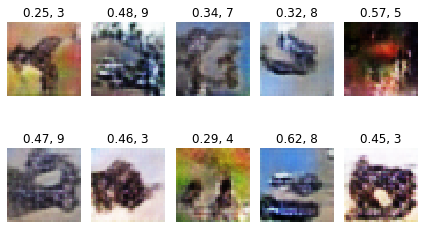

  Real Images and Discriminator Output:


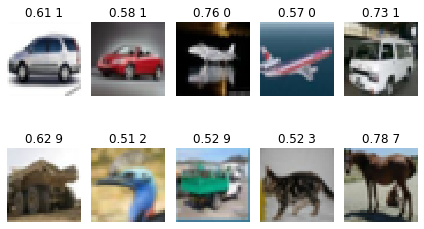

0 / 100: [0.65542114, 0.6875], [0.59977233, 0.765625], [0.97049695, 0.1875]
1 / 100: [0.62396634, 0.59375], [0.61797917, 0.6875], [0.9312459, 0.2109375]
2 / 100: [0.6347811, 0.609375], [0.60873127, 0.625], [1.0514648, 0.1015625]
3 / 100: [0.65600187, 0.59375], [0.5496927, 0.84375], [1.0404822, 0.1328125]
4 / 100: [0.66643393, 0.578125], [0.5206153, 0.828125], [1.0181987, 0.1171875]
5 / 100: [0.60239506, 0.71875], [0.57503843, 0.75], [1.0155135, 0.1484375]
6 / 100: [0.5839626, 0.671875], [0.6744331, 0.65625], [0.9825969, 0.1640625]
7 / 100: [0.60100996, 0.6875], [0.65268993, 0.65625], [0.9191, 0.2421875]
8 / 100: [0.66646755, 0.5625], [0.61905575, 0.6875], [0.8809898, 0.2265625]
9 / 100: [0.6236423, 0.6875], [0.6744441, 0.609375], [0.93314964, 0.1953125]
10 / 100: [0.63468504, 0.625], [0.59940445, 0.78125], [0.9544429, 0.171875]
11 / 100: [0.61083764, 0.65625], [0.61842716, 0.75], [1.0198017, 0.1328125]
12 / 100: [0.62915826, 0.609375], [0.61368227, 0.6875], [1.0593739, 0.0703125]
13 / 

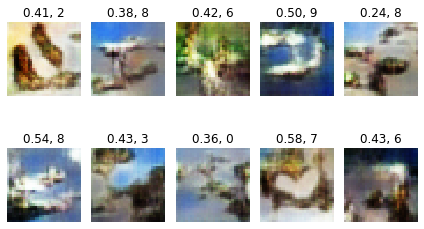

  Real Images and Discriminator Output:


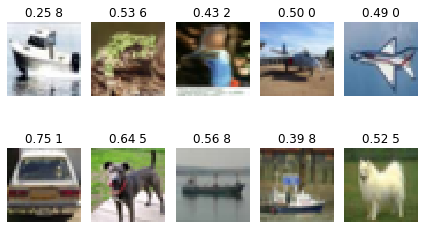

0 / 100: [0.64209414, 0.65625], [0.71067214, 0.515625], [0.9857918, 0.1328125]
1 / 100: [0.6647558, 0.578125], [0.62745136, 0.75], [0.9919994, 0.15625]
2 / 100: [0.71357787, 0.453125], [0.60070765, 0.703125], [0.99628323, 0.15625]
3 / 100: [0.6950033, 0.546875], [0.6620755, 0.6875], [0.9294042, 0.296875]
4 / 100: [0.67820895, 0.546875], [0.601657, 0.765625], [0.9913245, 0.1328125]
5 / 100: [0.62557936, 0.71875], [0.57013154, 0.765625], [1.0342577, 0.1484375]
6 / 100: [0.71207523, 0.5625], [0.59510875, 0.671875], [1.0175035, 0.1484375]
7 / 100: [0.6445873, 0.609375], [0.5870791, 0.75], [0.98918784, 0.1875]
8 / 100: [0.6057717, 0.6875], [0.6215228, 0.65625], [0.996879, 0.1953125]
9 / 100: [0.7119254, 0.578125], [0.61321187, 0.71875], [0.9552523, 0.2109375]
10 / 100: [0.69013673, 0.5625], [0.67161506, 0.625], [0.90502906, 0.2421875]
11 / 100: [0.6670301, 0.65625], [0.670041, 0.515625], [0.95457816, 0.21875]
12 / 100: [0.6003735, 0.671875], [0.66991866, 0.5625], [0.96014786, 0.1484375]
13 

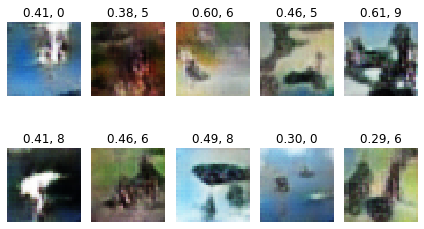

  Real Images and Discriminator Output:


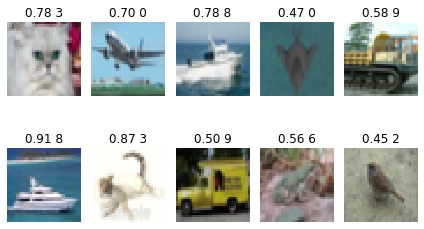

0 / 100: [0.5340279, 0.8125], [0.72161186, 0.5], [0.89298517, 0.234375]
1 / 100: [0.6506019, 0.59375], [0.6593073, 0.703125], [0.80688107, 0.359375]
2 / 100: [0.66402525, 0.578125], [0.70243245, 0.609375], [0.92333996, 0.1953125]
3 / 100: [0.60465205, 0.65625], [0.6066178, 0.8125], [1.0006595, 0.1796875]
4 / 100: [0.59706974, 0.6875], [0.5993191, 0.71875], [0.99491346, 0.1796875]
5 / 100: [0.6132747, 0.609375], [0.6597264, 0.65625], [1.0008057, 0.2109375]
6 / 100: [0.6214505, 0.671875], [0.647894, 0.625], [0.9481113, 0.2890625]
7 / 100: [0.69247925, 0.5], [0.70061857, 0.625], [0.8773167, 0.2890625]
8 / 100: [0.6344329, 0.625], [0.63116986, 0.75], [0.86430705, 0.2734375]
9 / 100: [0.65029556, 0.5625], [0.6837418, 0.515625], [0.92892736, 0.21875]
10 / 100: [0.59835786, 0.6875], [0.61361235, 0.703125], [0.91984165, 0.2265625]
11 / 100: [0.66187966, 0.625], [0.583622, 0.75], [0.9155445, 0.15625]
12 / 100: [0.6319874, 0.609375], [0.5908561, 0.796875], [0.91872466, 0.1484375]
13 / 100: [0.65

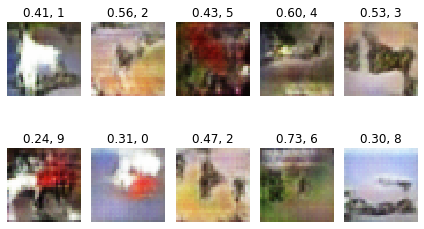

  Real Images and Discriminator Output:


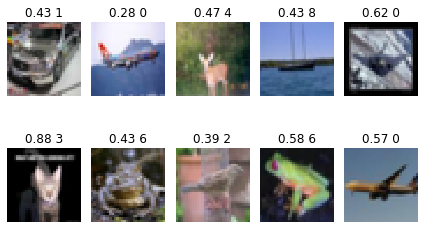

0 / 100: [0.631637, 0.65625], [0.75513, 0.546875], [0.9013775, 0.2421875]
1 / 100: [0.65261686, 0.625], [0.67549145, 0.671875], [0.9481499, 0.1796875]
2 / 100: [0.6290735, 0.625], [0.64008176, 0.65625], [0.9643084, 0.1796875]
3 / 100: [0.64174616, 0.640625], [0.56761587, 0.78125], [1.0024985, 0.125]
4 / 100: [0.5652443, 0.71875], [0.6158409, 0.671875], [0.9862889, 0.1484375]
5 / 100: [0.6313292, 0.625], [0.63260615, 0.6875], [0.89368266, 0.21875]
6 / 100: [0.6407846, 0.59375], [0.70188177, 0.5], [0.8795024, 0.3046875]
7 / 100: [0.5884371, 0.703125], [0.7063383, 0.53125], [0.92071104, 0.234375]
8 / 100: [0.69119346, 0.578125], [0.59768444, 0.703125], [0.9561616, 0.203125]
9 / 100: [0.71281826, 0.421875], [0.61720425, 0.71875], [0.9576607, 0.171875]
10 / 100: [0.6674226, 0.625], [0.6424707, 0.71875], [1.0073152, 0.1171875]
11 / 100: [0.71184206, 0.484375], [0.68295264, 0.640625], [0.97180563, 0.109375]
12 / 100: [0.7209078, 0.5], [0.5816188, 0.75], [0.99798346, 0.109375]
13 / 100: [0.738

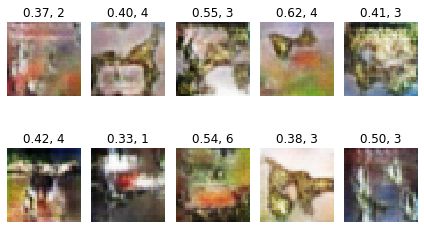

  Real Images and Discriminator Output:


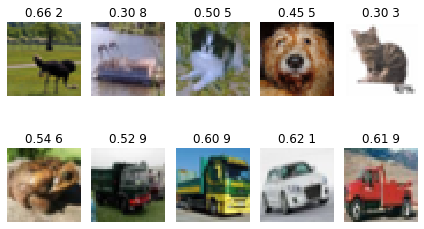

In [11]:
# Okay, less verbosity, and lets really train it!
EPOCHS = 50
BATCHES = 100
BATCH_SIZE = 128
IMAGE_NOISE_START = .1
LABEL_SMOOTHING_MAGNITUDE = .1

# Lets get fresh copies of everything for a real run.
# Not that the above should have messed anything up.
discriminator = create_discriminator(INPUT_SHAPE, N_CLASSES, label_smoothing = LABEL_SMOOTHING_MAGNITUDE)
generator = create_generator(NOISE_DIM, LATENT_DENSE_SIZE, N_CLASSES)
gan = create_gan(generator, discriminator, label_smoothing = LABEL_SMOOTHING_MAGNITUDE)

train_gan(
    gan,
    generator,
    discriminator,
    NOISE_DIM,
    EPOCHS,
    BATCHES,
    BATCH_SIZE,
    IMAGE_NOISE_START,
    verbose=2
)

Beginning training... 100 epochs, each with 200 batches of 128
Latent vector size 100
Image noise initial magnitude: 0.05, decay: 0.0005
Training... 
Metrics: Discriminator Real, Discriminator Fake, Generator
After 12800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


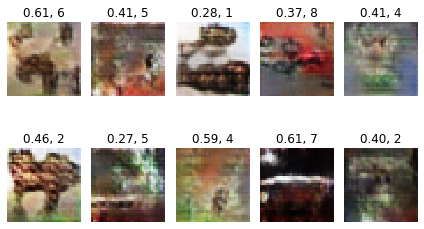

  Real Images and Discriminator Output:


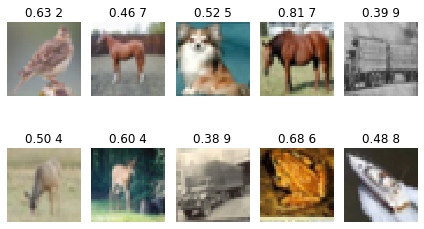

After 25600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


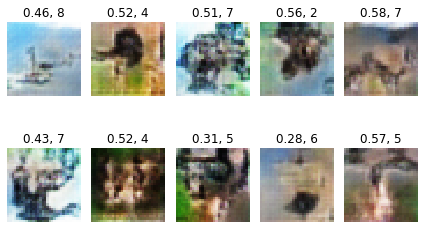

  Real Images and Discriminator Output:


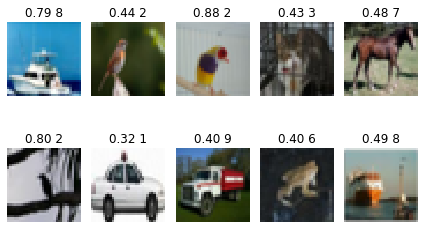

After 38400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


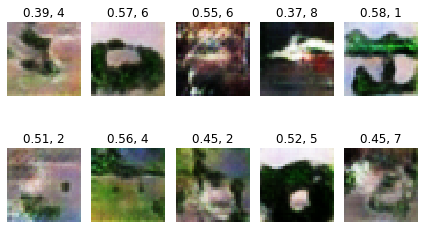

  Real Images and Discriminator Output:


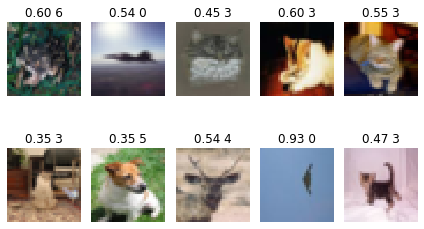

After 51200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


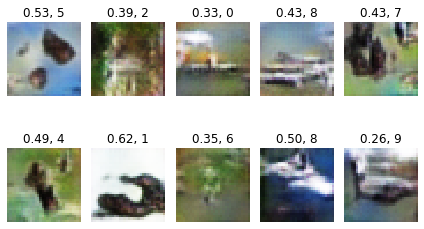

  Real Images and Discriminator Output:


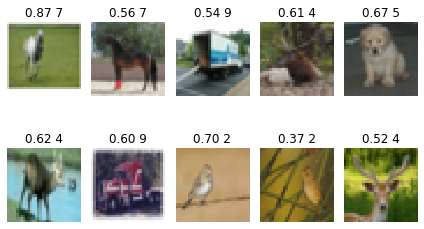

After 64000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


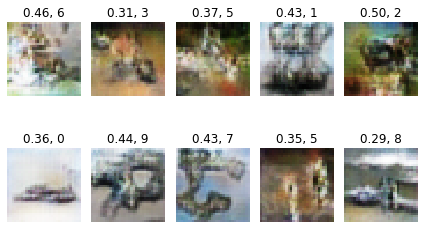

  Real Images and Discriminator Output:


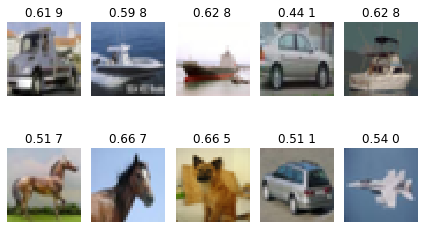

After 76800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


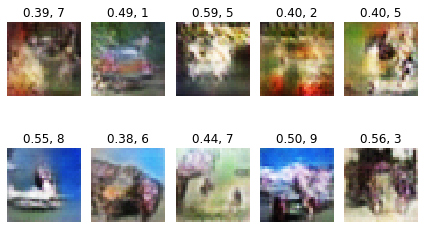

  Real Images and Discriminator Output:


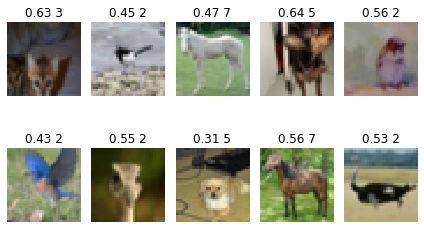

After 89600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


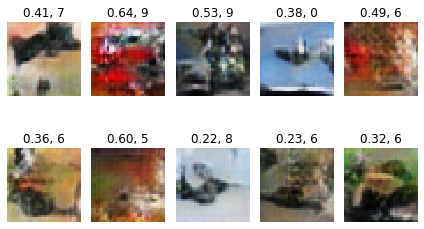

  Real Images and Discriminator Output:


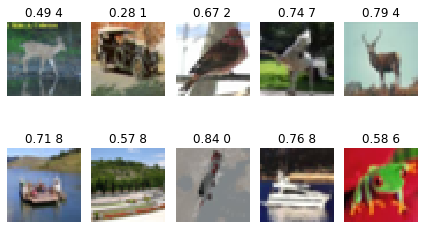

After 102400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


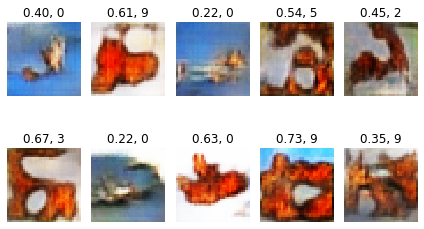

  Real Images and Discriminator Output:


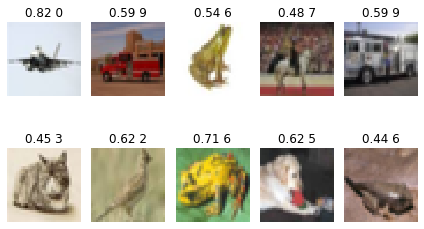

After 115200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


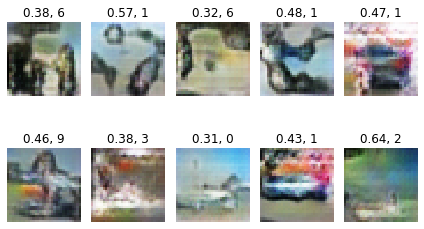

  Real Images and Discriminator Output:


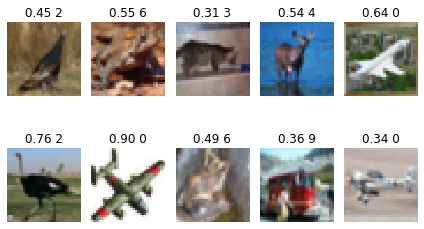

After 128000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


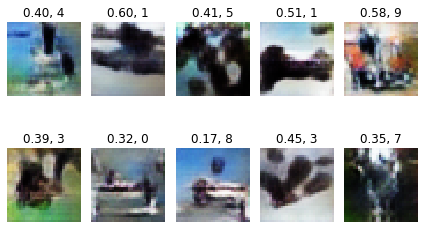

  Real Images and Discriminator Output:


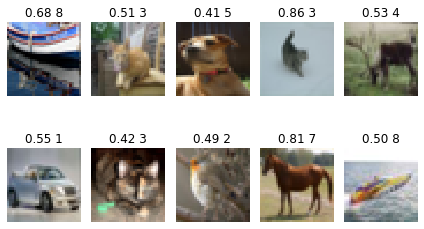

After 140800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


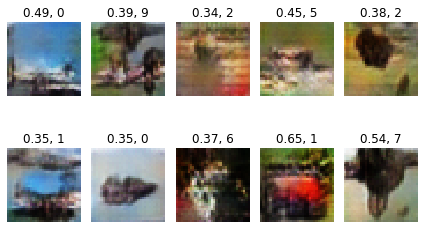

  Real Images and Discriminator Output:


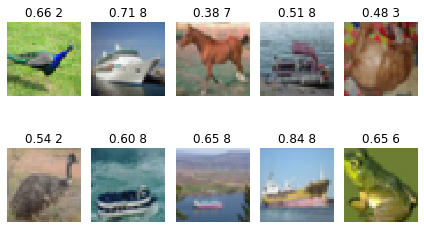

After 153600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


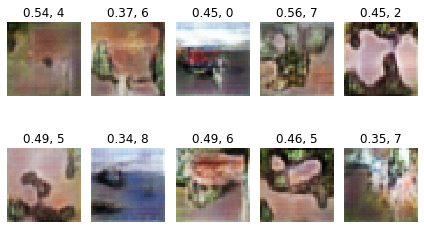

  Real Images and Discriminator Output:


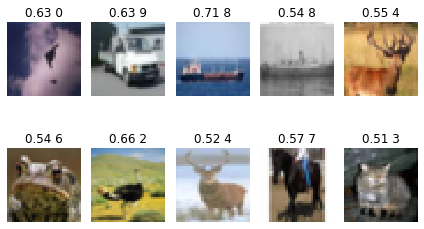

After 166400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


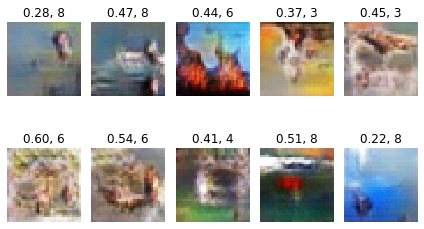

  Real Images and Discriminator Output:


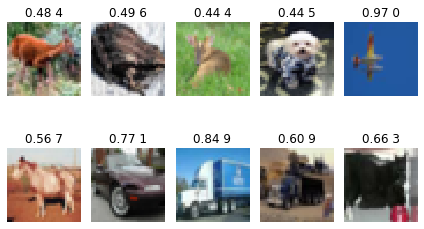

After 179200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


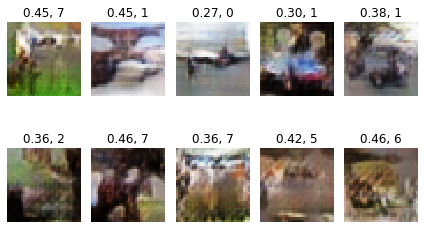

  Real Images and Discriminator Output:


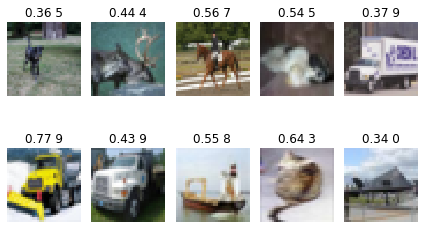

After 192000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


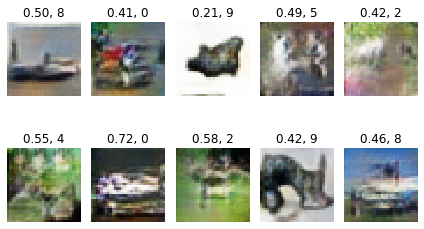

  Real Images and Discriminator Output:


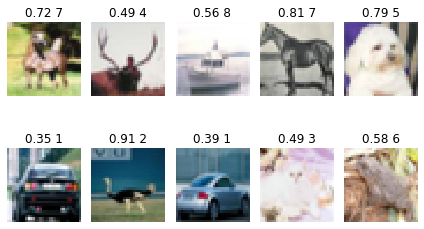

After 204800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


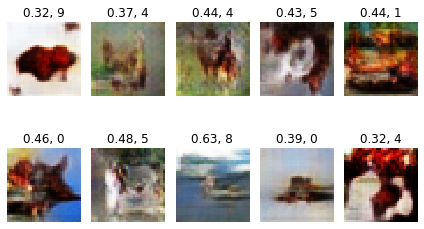

  Real Images and Discriminator Output:


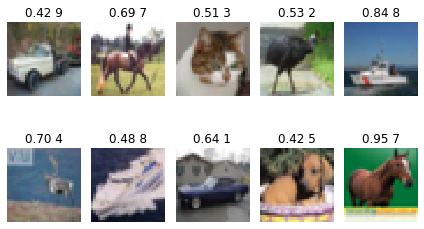

After 217600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


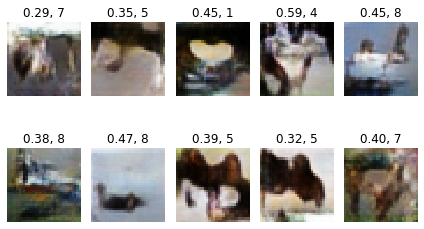

  Real Images and Discriminator Output:


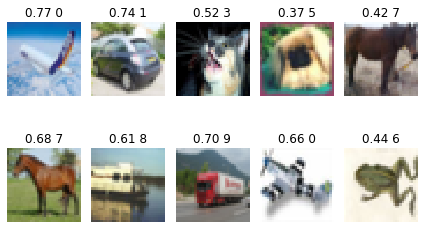

After 230400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


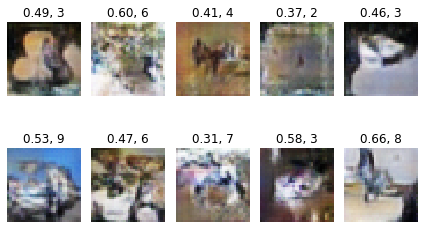

  Real Images and Discriminator Output:


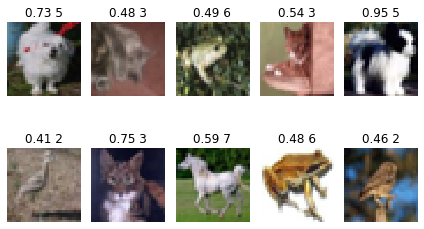

After 243200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


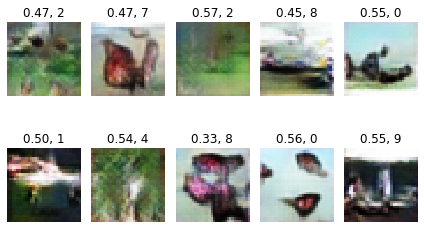

  Real Images and Discriminator Output:


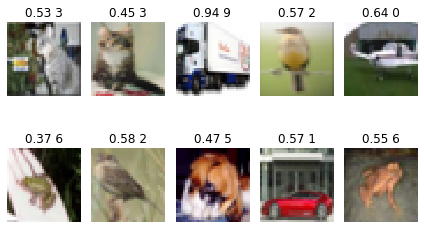

After 256000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


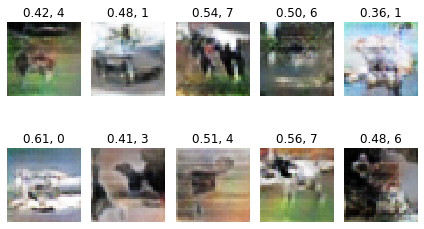

  Real Images and Discriminator Output:


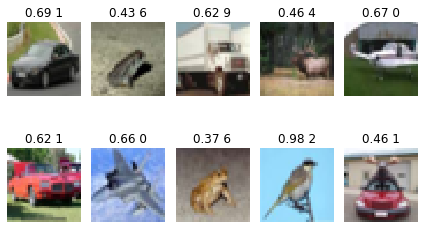

After 268800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


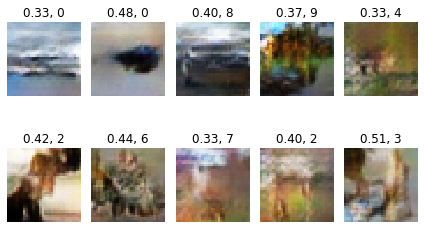

  Real Images and Discriminator Output:


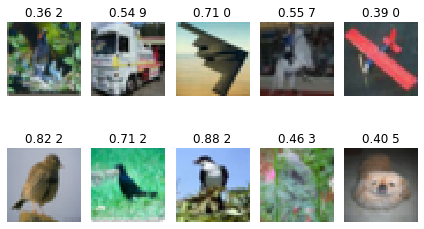

After 281600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


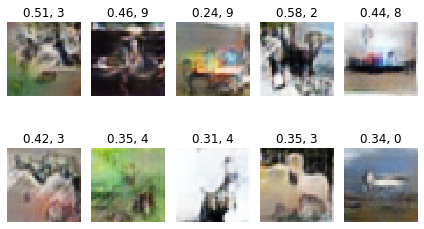

  Real Images and Discriminator Output:


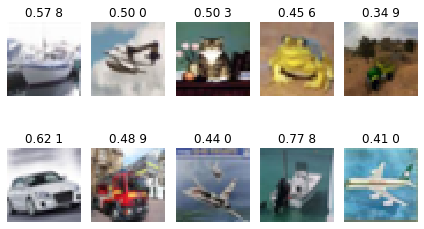

After 294400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


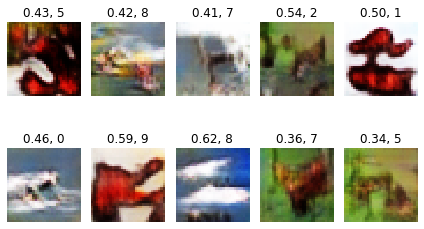

  Real Images and Discriminator Output:


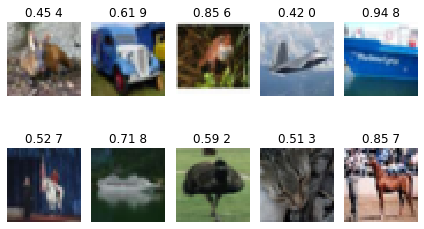

After 307200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


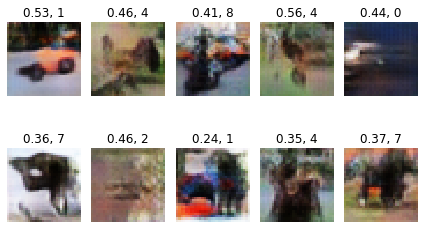

  Real Images and Discriminator Output:


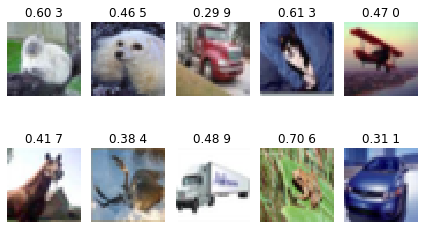

After 320000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


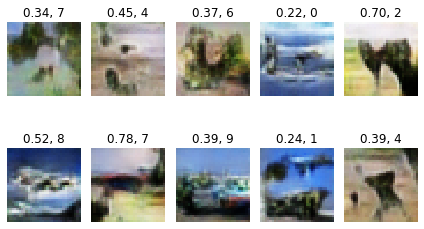

  Real Images and Discriminator Output:


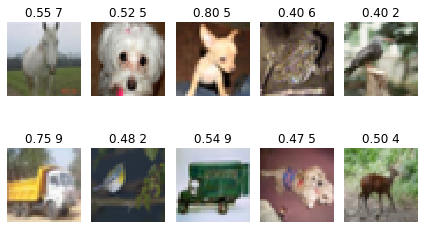

After 332800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


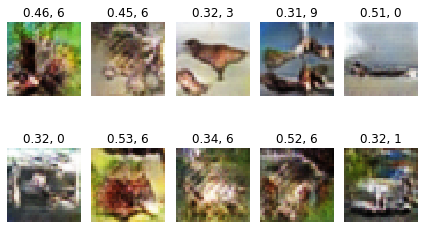

  Real Images and Discriminator Output:


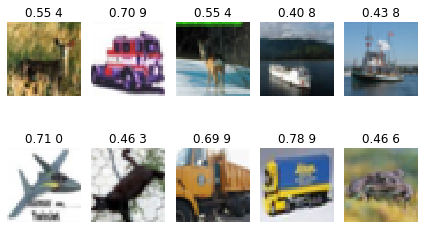

After 345600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


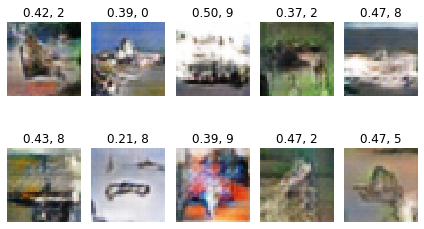

  Real Images and Discriminator Output:


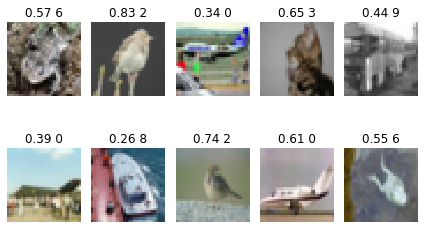

After 358400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


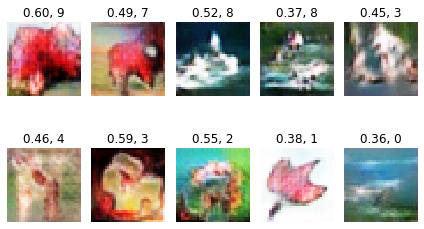

  Real Images and Discriminator Output:


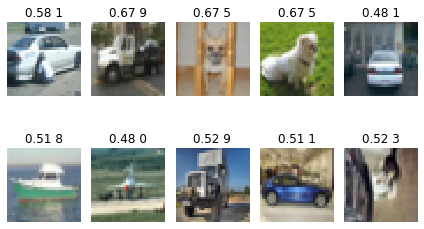

After 371200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


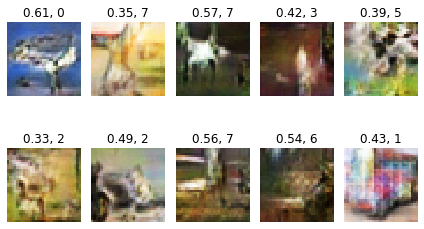

  Real Images and Discriminator Output:


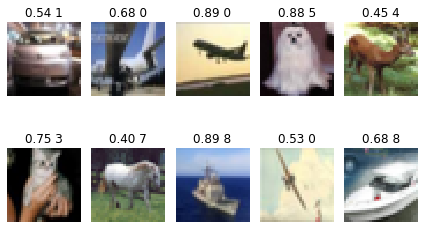

After 384000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


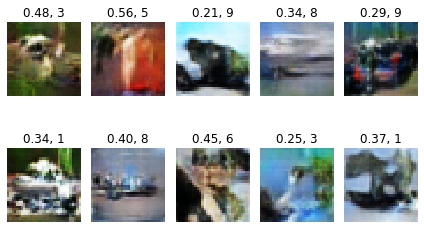

  Real Images and Discriminator Output:


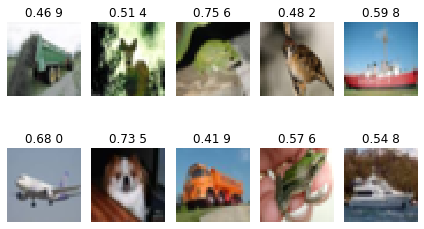

After 396800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


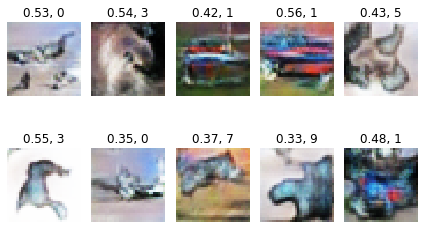

  Real Images and Discriminator Output:


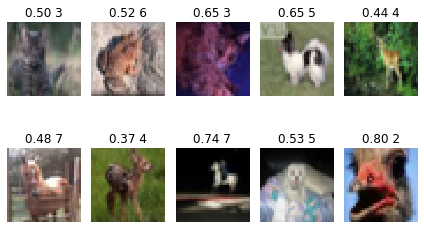

After 409600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


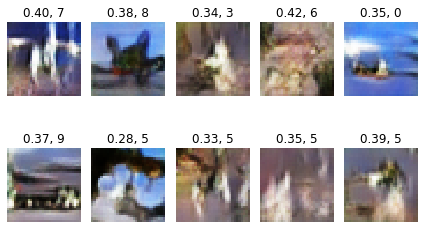

  Real Images and Discriminator Output:


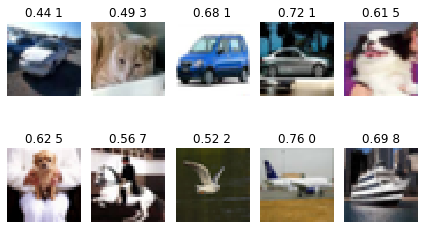

After 422400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


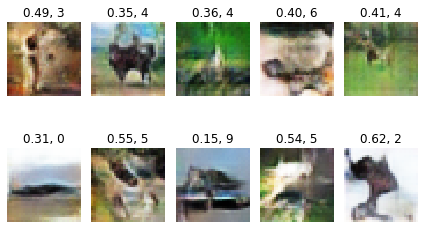

  Real Images and Discriminator Output:


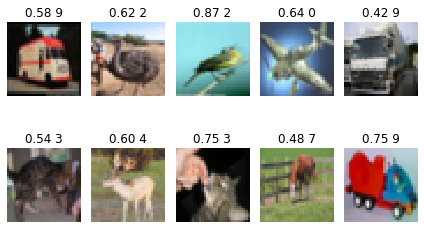

After 435200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


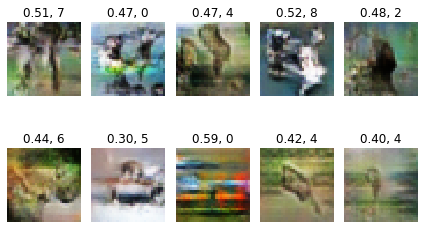

  Real Images and Discriminator Output:


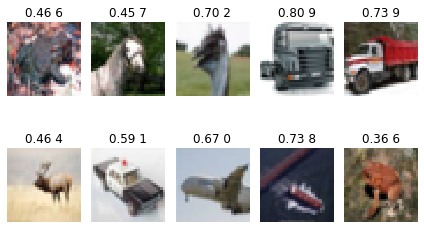

After 448000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


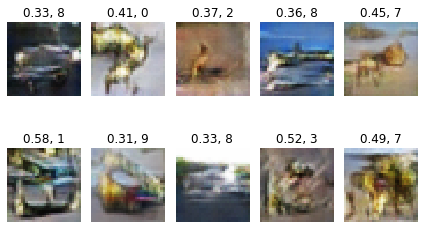

  Real Images and Discriminator Output:


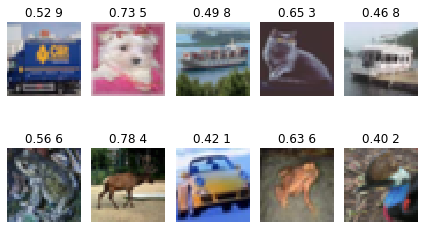

After 460800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


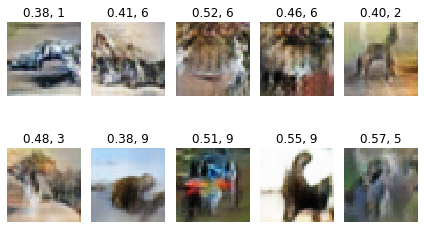

  Real Images and Discriminator Output:


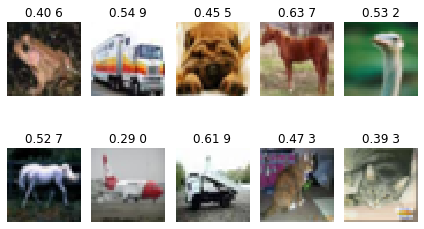

After 473600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


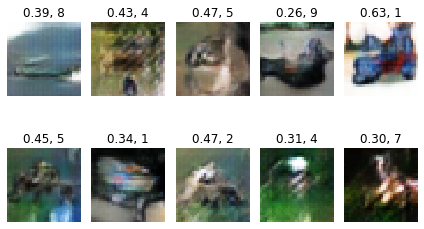

  Real Images and Discriminator Output:


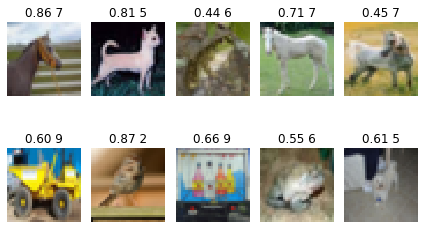

After 486400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


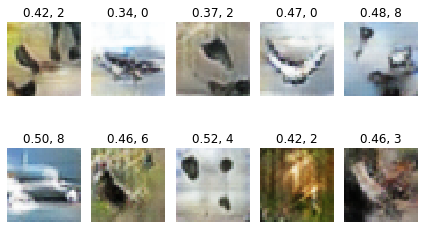

  Real Images and Discriminator Output:


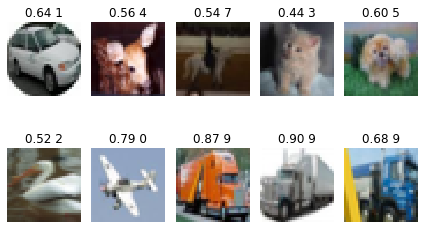

After 499200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


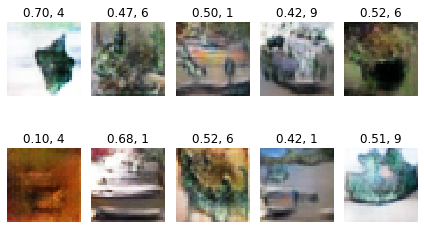

  Real Images and Discriminator Output:


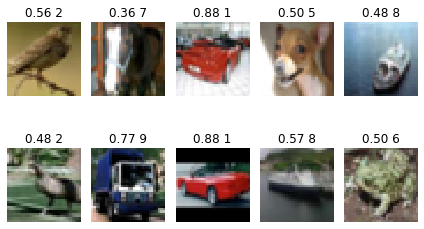

After 512000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


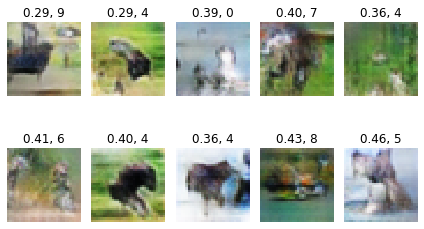

  Real Images and Discriminator Output:


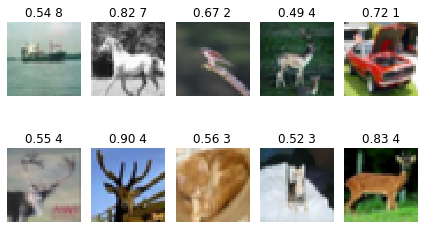

After 524800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


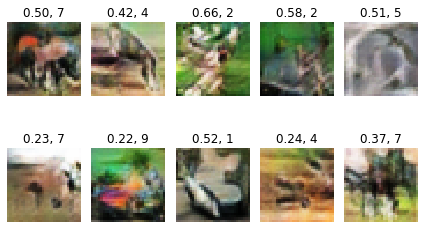

  Real Images and Discriminator Output:


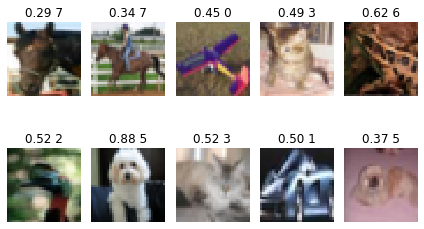

After 537600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


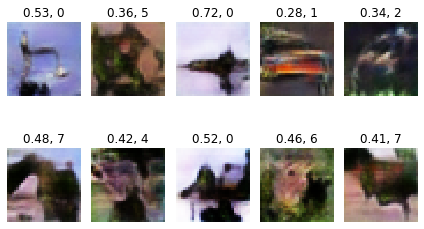

  Real Images and Discriminator Output:


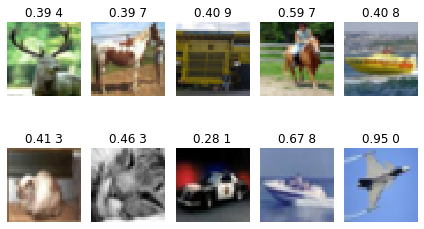

After 550400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


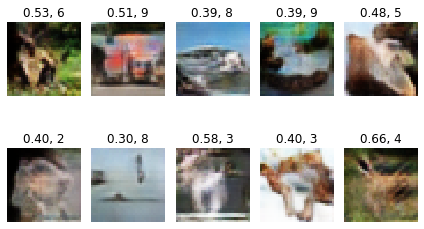

  Real Images and Discriminator Output:


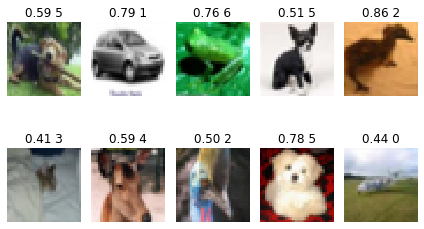

After 563200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


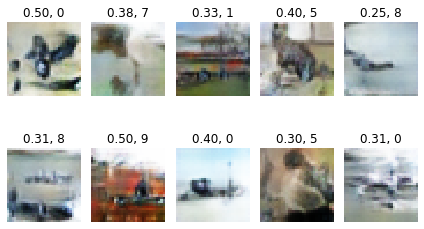

  Real Images and Discriminator Output:


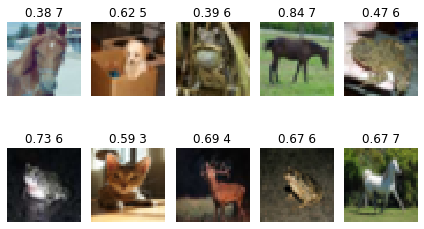

After 576000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


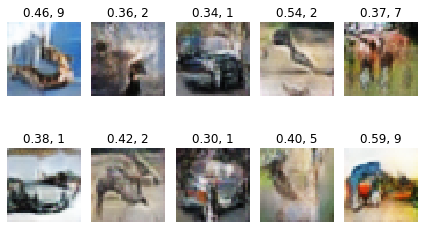

  Real Images and Discriminator Output:


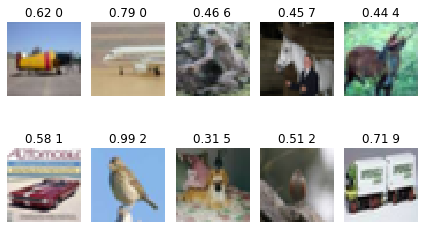

After 588800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


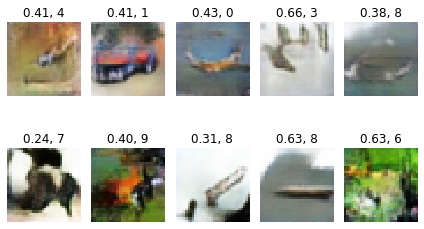

  Real Images and Discriminator Output:


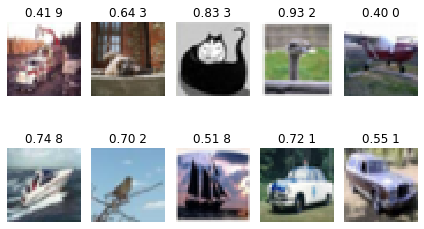

After 601600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


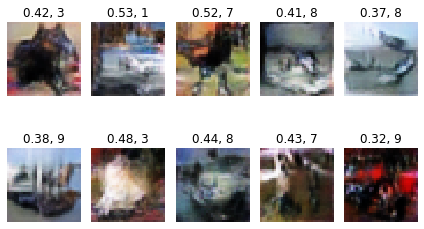

  Real Images and Discriminator Output:


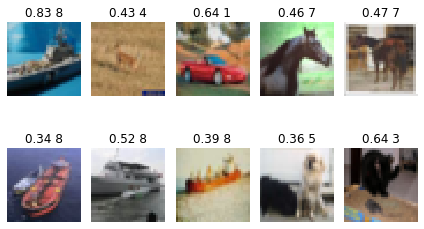

After 614400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


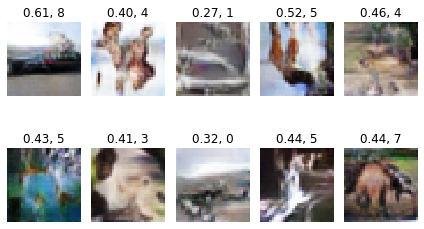

  Real Images and Discriminator Output:


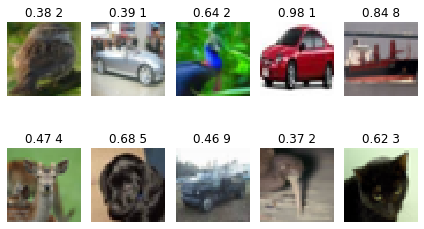

After 627200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


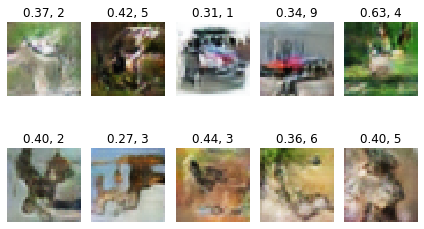

  Real Images and Discriminator Output:


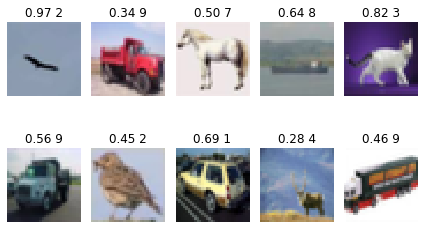

After 640000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


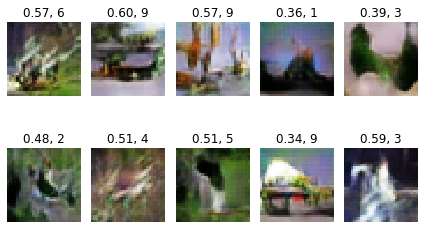

  Real Images and Discriminator Output:


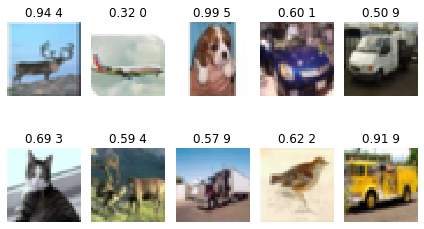

After 652800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


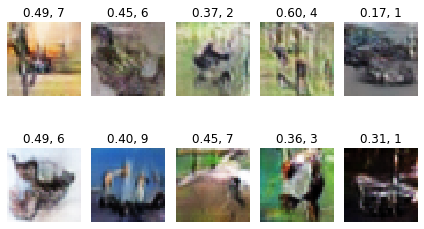

  Real Images and Discriminator Output:


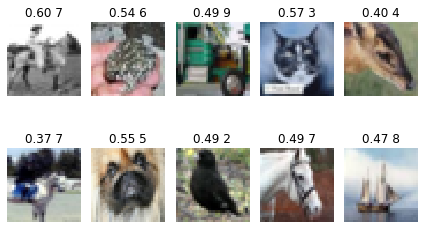

After 665600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


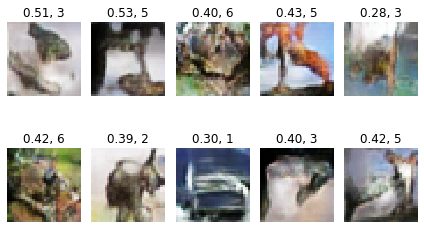

  Real Images and Discriminator Output:


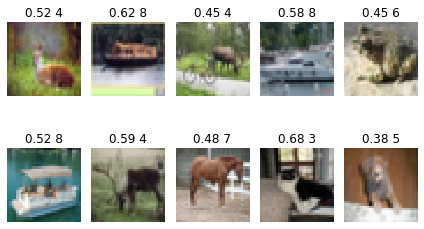

After 678400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


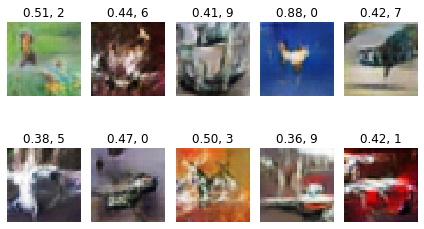

  Real Images and Discriminator Output:


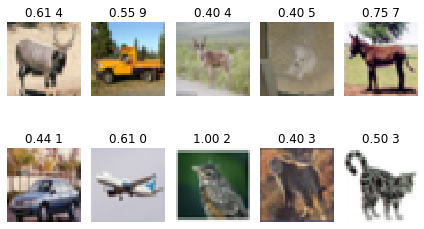

After 691200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


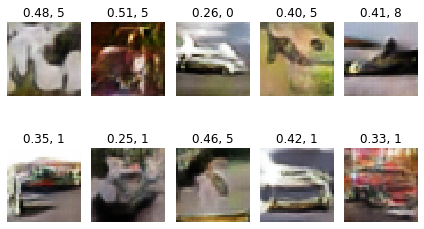

  Real Images and Discriminator Output:


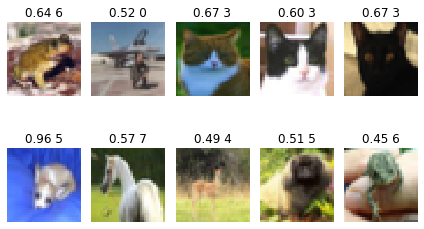

After 704000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


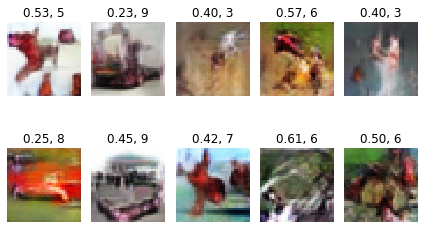

  Real Images and Discriminator Output:


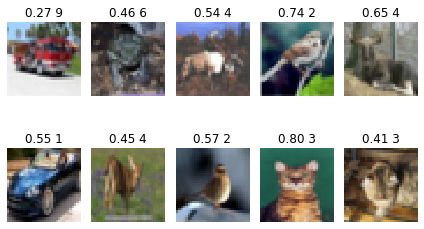

After 716800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


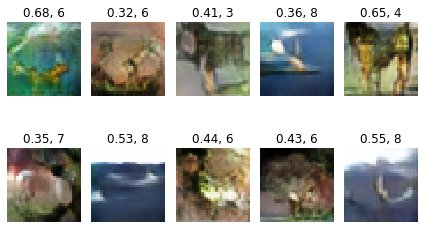

  Real Images and Discriminator Output:


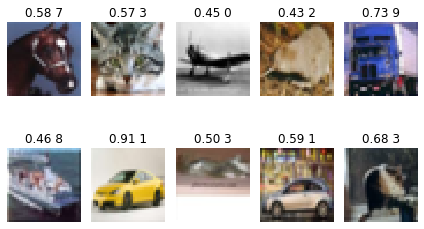

After 729600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


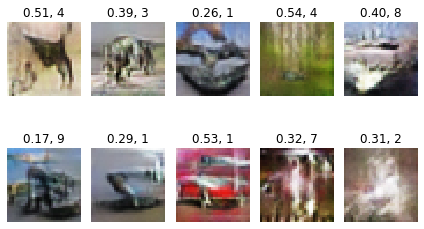

  Real Images and Discriminator Output:


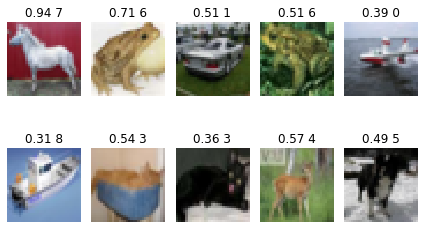

After 742400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


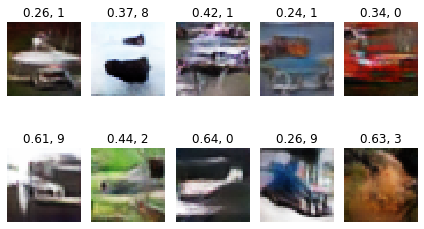

  Real Images and Discriminator Output:


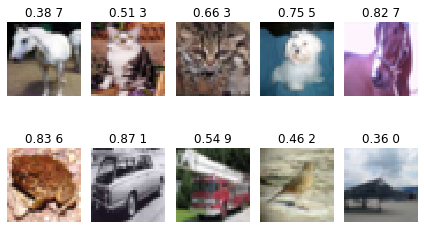

After 755200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


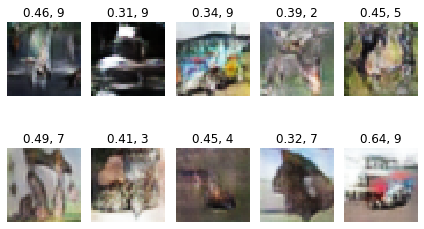

  Real Images and Discriminator Output:


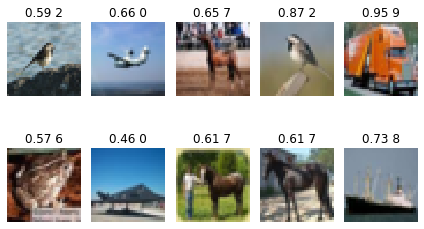

After 768000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


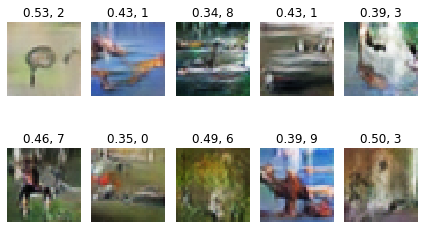

  Real Images and Discriminator Output:


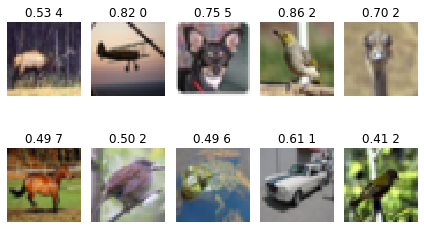

After 780800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


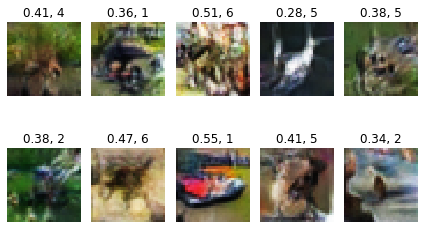

  Real Images and Discriminator Output:


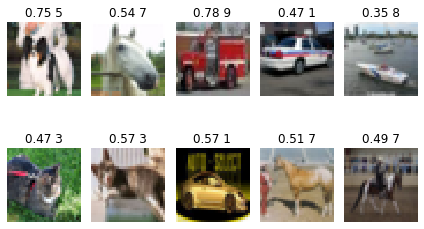

After 793600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


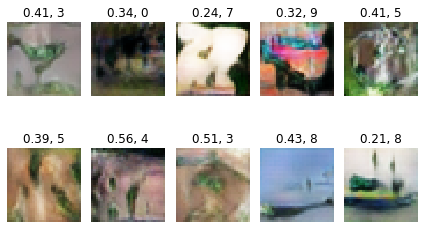

  Real Images and Discriminator Output:


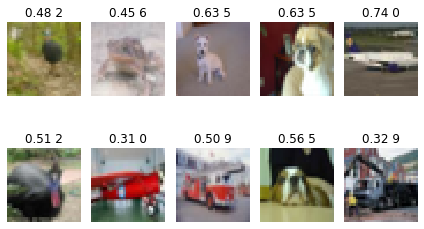

After 806400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


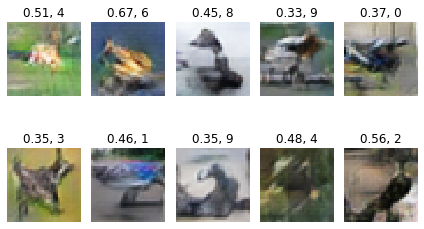

  Real Images and Discriminator Output:


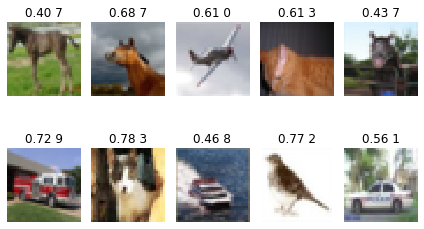

After 819200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


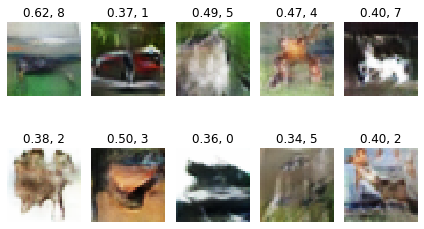

  Real Images and Discriminator Output:


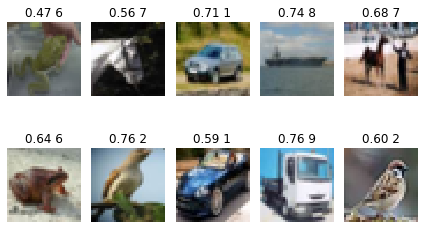

After 832000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


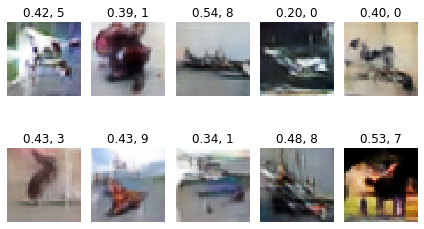

  Real Images and Discriminator Output:


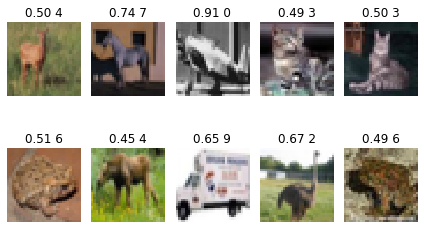

After 844800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


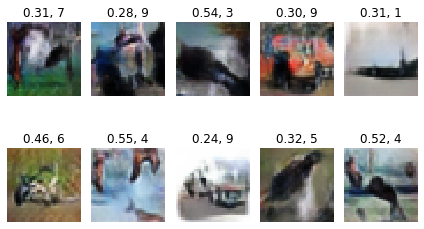

  Real Images and Discriminator Output:


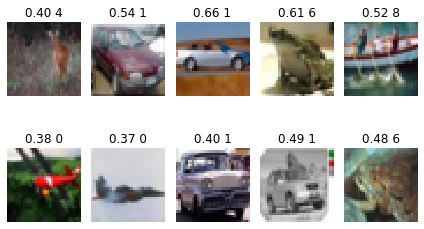

After 857600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


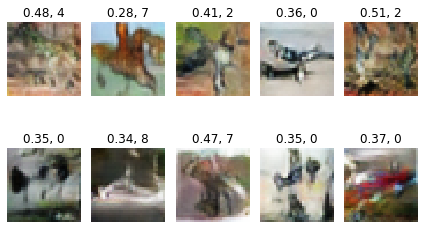

  Real Images and Discriminator Output:


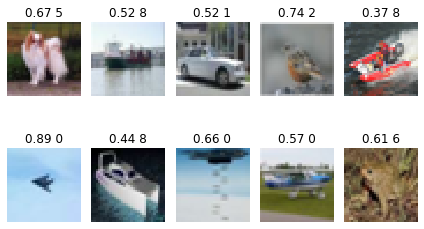

After 870400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


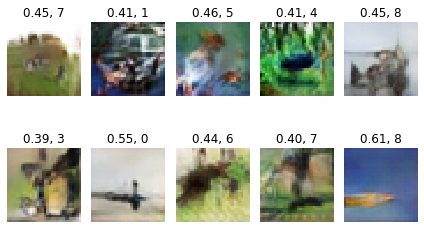

  Real Images and Discriminator Output:


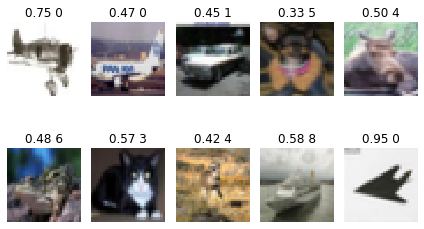

After 883200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


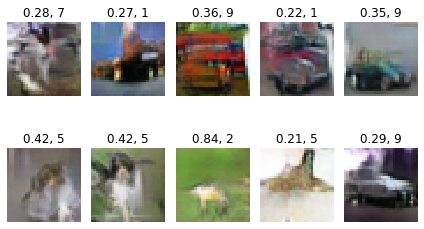

  Real Images and Discriminator Output:


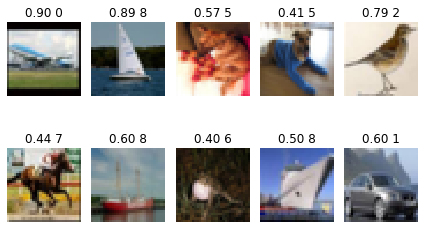

After 896000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


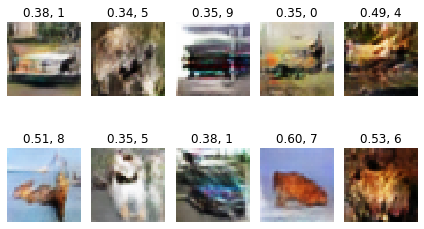

  Real Images and Discriminator Output:


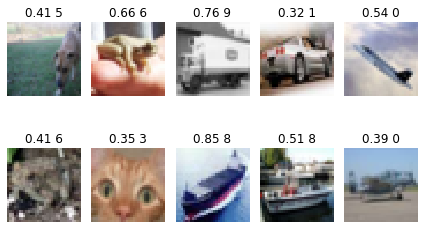

After 908800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


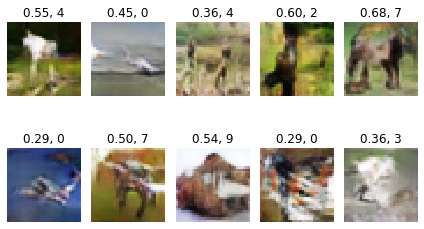

  Real Images and Discriminator Output:


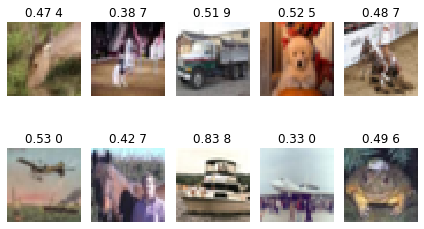

After 921600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


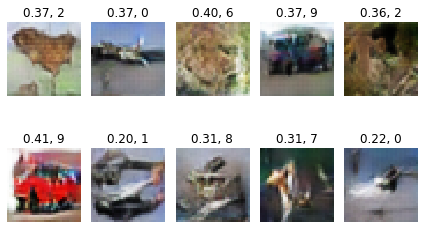

  Real Images and Discriminator Output:


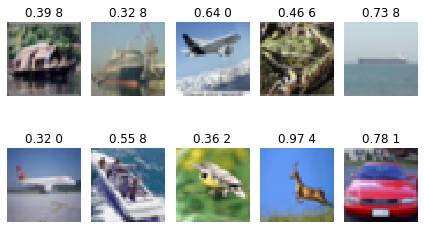

After 934400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


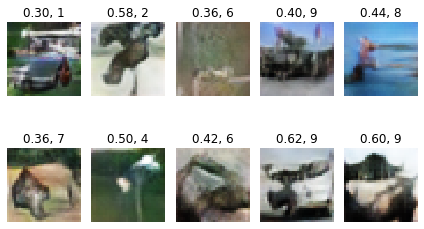

  Real Images and Discriminator Output:


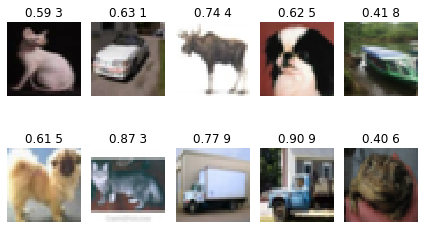

After 947200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


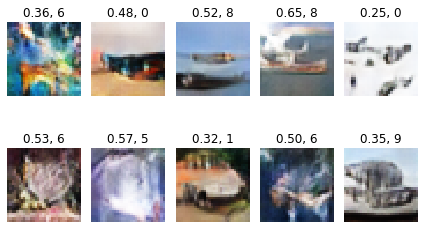

  Real Images and Discriminator Output:


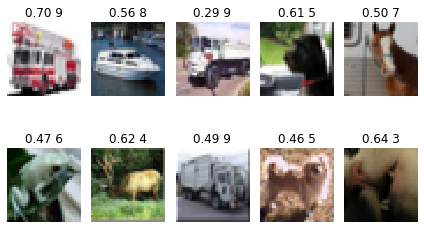

After 960000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


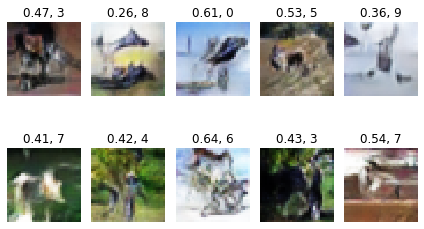

  Real Images and Discriminator Output:


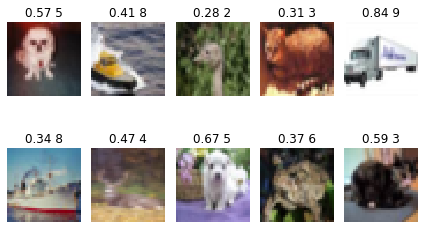

After 972800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


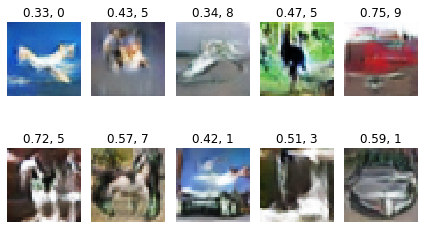

  Real Images and Discriminator Output:


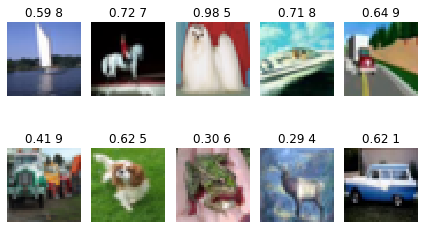

After 985600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


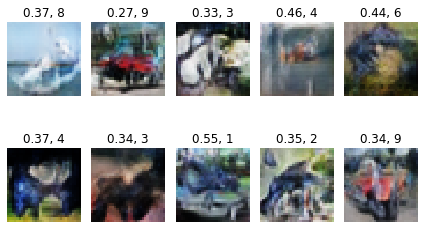

  Real Images and Discriminator Output:


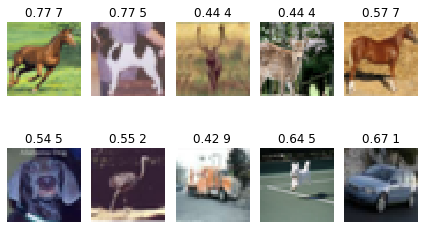

After 998400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


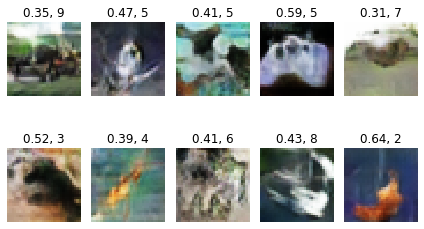

  Real Images and Discriminator Output:


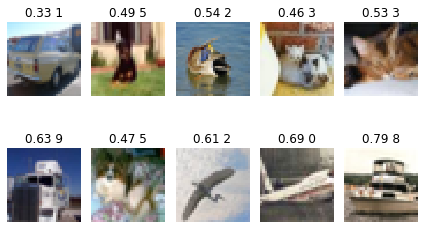

After 1011200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


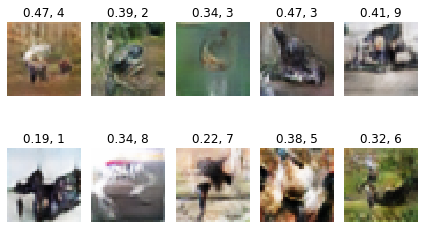

  Real Images and Discriminator Output:


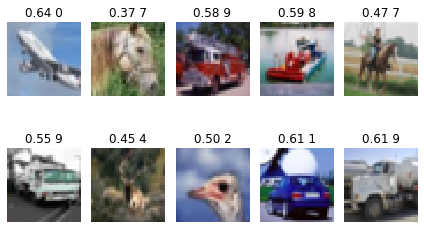

After 1024000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


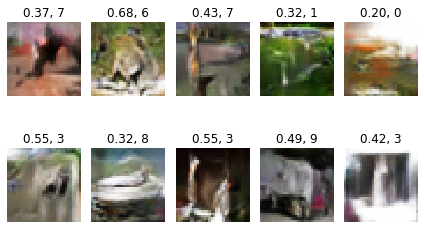

  Real Images and Discriminator Output:


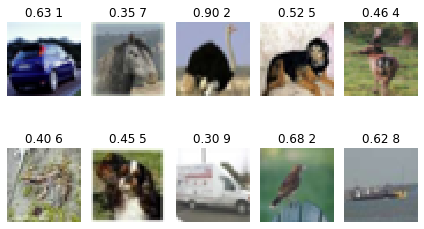

After 1036800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


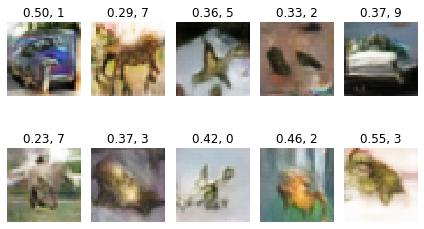

  Real Images and Discriminator Output:


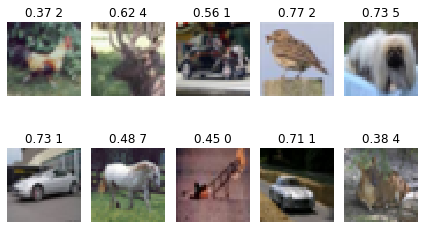

After 1049600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


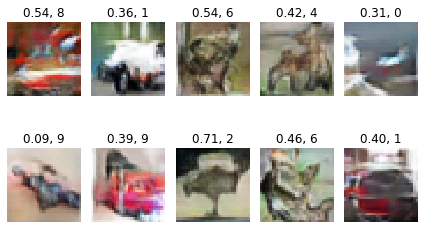

  Real Images and Discriminator Output:


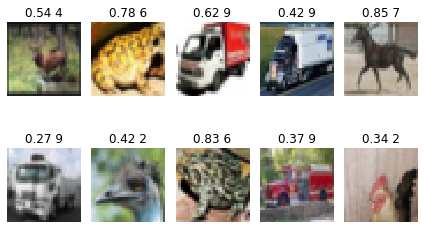

After 1062400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


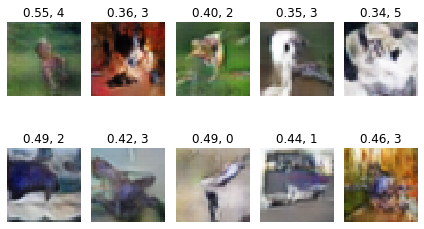

  Real Images and Discriminator Output:


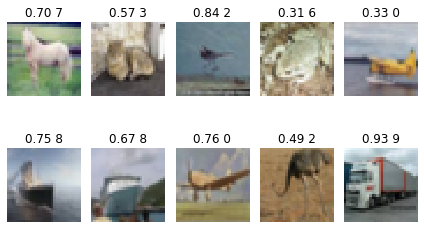

After 1075200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


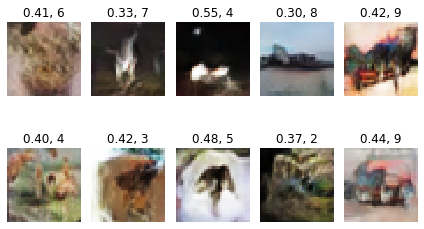

  Real Images and Discriminator Output:


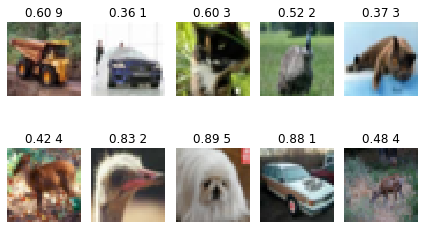

After 1088000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


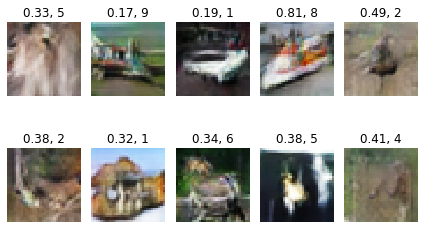

  Real Images and Discriminator Output:


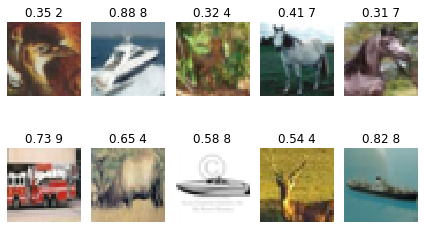

After 1100800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


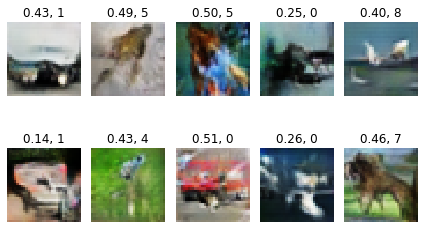

  Real Images and Discriminator Output:


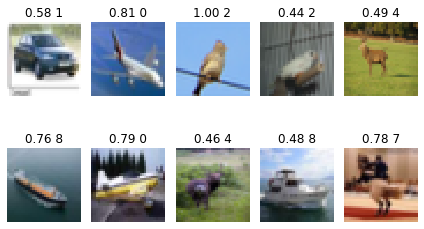

After 1113600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


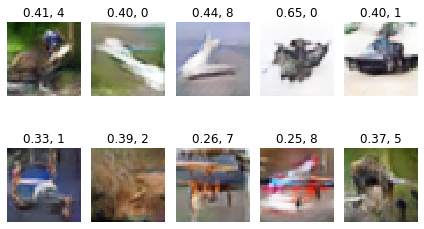

  Real Images and Discriminator Output:


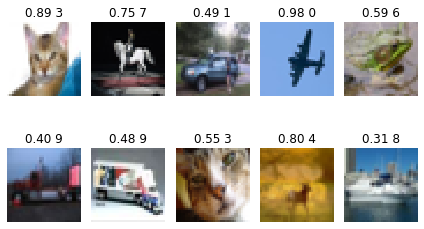

After 1126400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


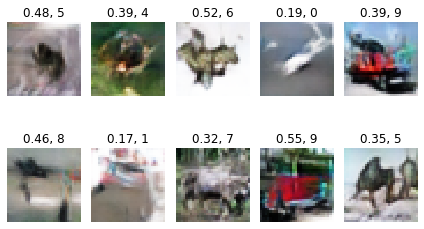

  Real Images and Discriminator Output:


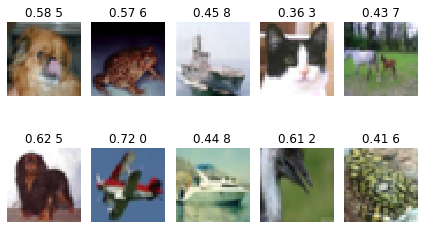

After 1139200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


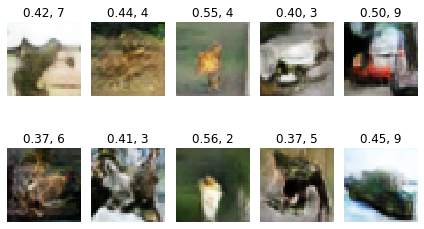

  Real Images and Discriminator Output:


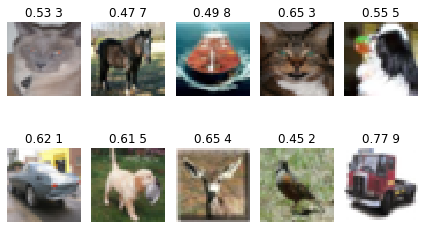

After 1152000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


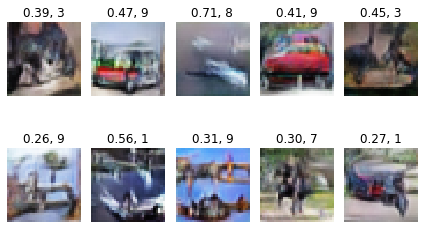

  Real Images and Discriminator Output:


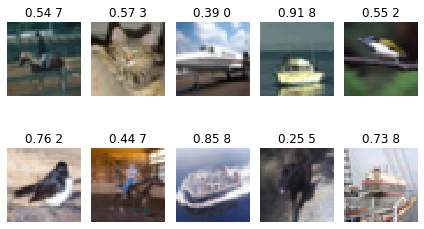

After 1164800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


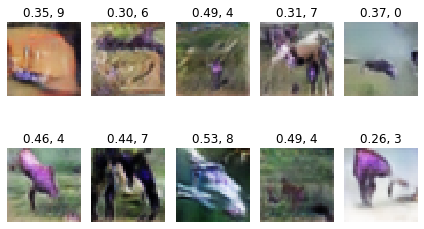

  Real Images and Discriminator Output:


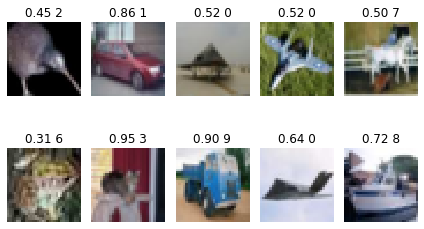

After 1177600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


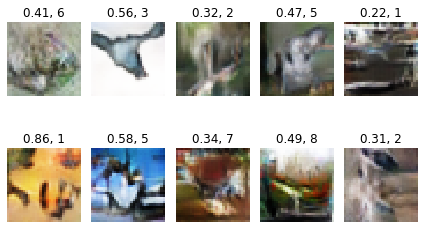

  Real Images and Discriminator Output:


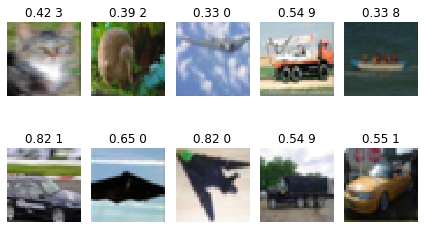

After 1190400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


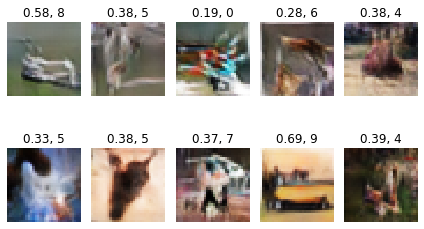

  Real Images and Discriminator Output:


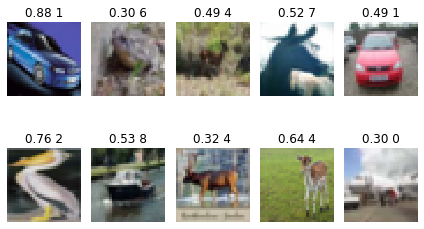

After 1203200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


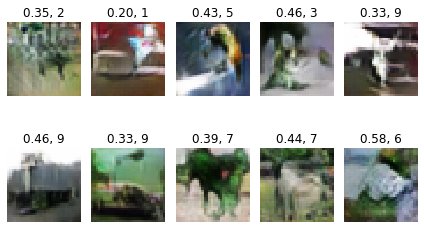

  Real Images and Discriminator Output:


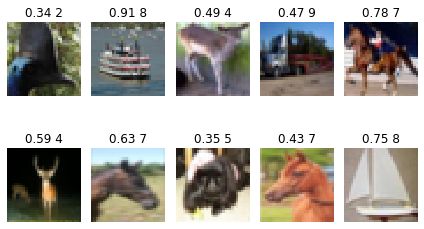

After 1216000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


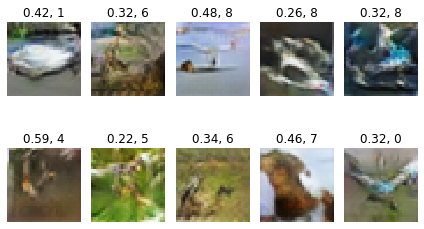

  Real Images and Discriminator Output:


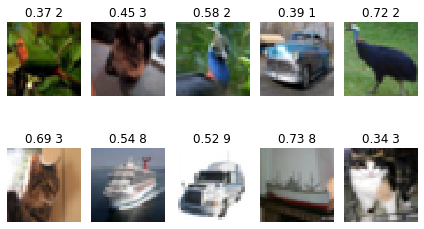

After 1228800 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


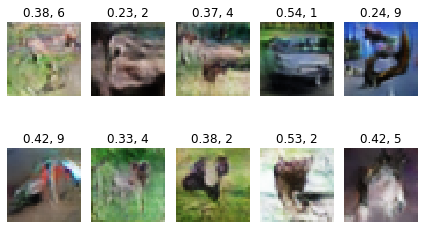

  Real Images and Discriminator Output:


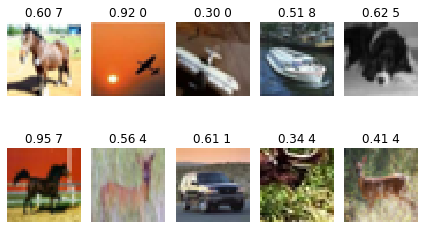

After 1241600 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


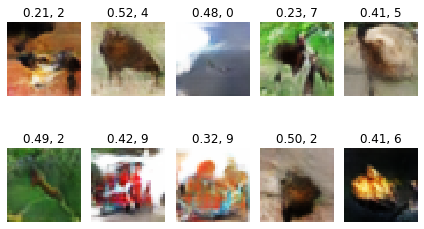

  Real Images and Discriminator Output:


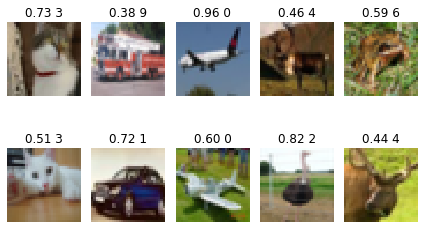

After 1254400 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


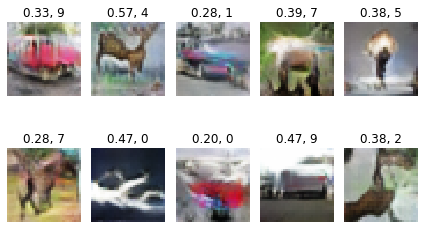

  Real Images and Discriminator Output:


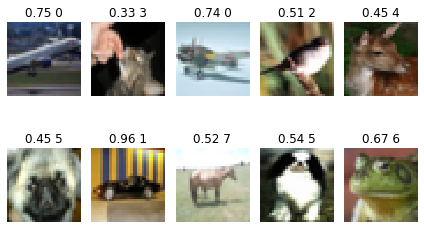

After 1267200 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


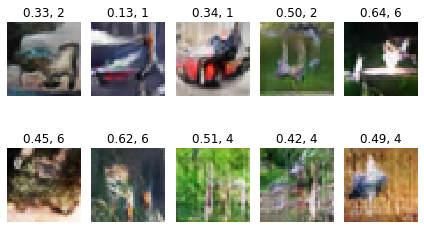

  Real Images and Discriminator Output:


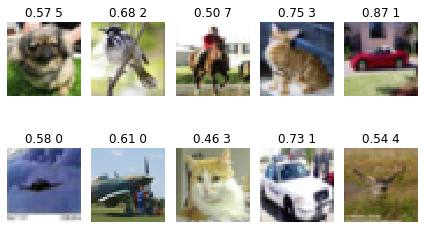

After 1280000 samples.
Image labels are D(image) and Class(image)
  Generated Images and Discriminator Output:


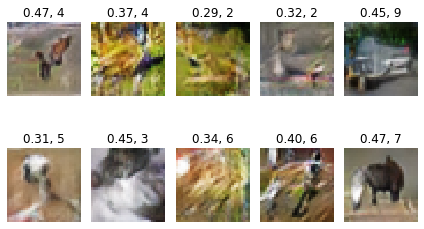

  Real Images and Discriminator Output:


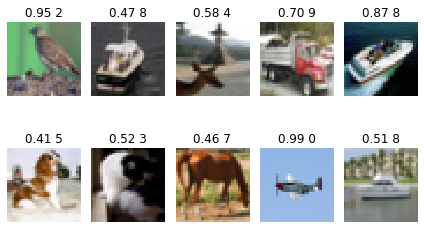

In [17]:
# Lets go again, the above seems to be improving still, and it's not as good as we'd hope...
# label smoothing continues since the way we've built it we have to recompile
# the model with a new optimizer to unsmooth them. Lowered the starting noise, since
# we've already trained significantly with noise. Increased the total amount of training
# by increasing #batchs and #epochs
train_gan(
    gan,
    generator,
    discriminator,
    NOISE_DIM,
    100,
    200,
    128,
    .05,
    verbose=1
)

# Generating Images From Trained Model

In [18]:
# Since this took quite a lot of training time... 
generator.save('cifar_gen_final')
discriminator.save('cifar_discriminator_final')

/Users/tylerbettilyon/.local/share/virtualenvs/deep-learning-intro-1Adgpw9A/lib/python3.7/site-packages/keras/engine/saving.py:165: UserWarning: TensorFlow optimizers do not make it possible to access optimizer attributes or optimizer state after instantiation. As a result, we cannot save the optimizer as part of the model save file.You will have to compile your model again after loading it. Prefer using a Keras optimizer instead (see keras.io/optimizers).
  'TensorFlow optimizers do not '


plane


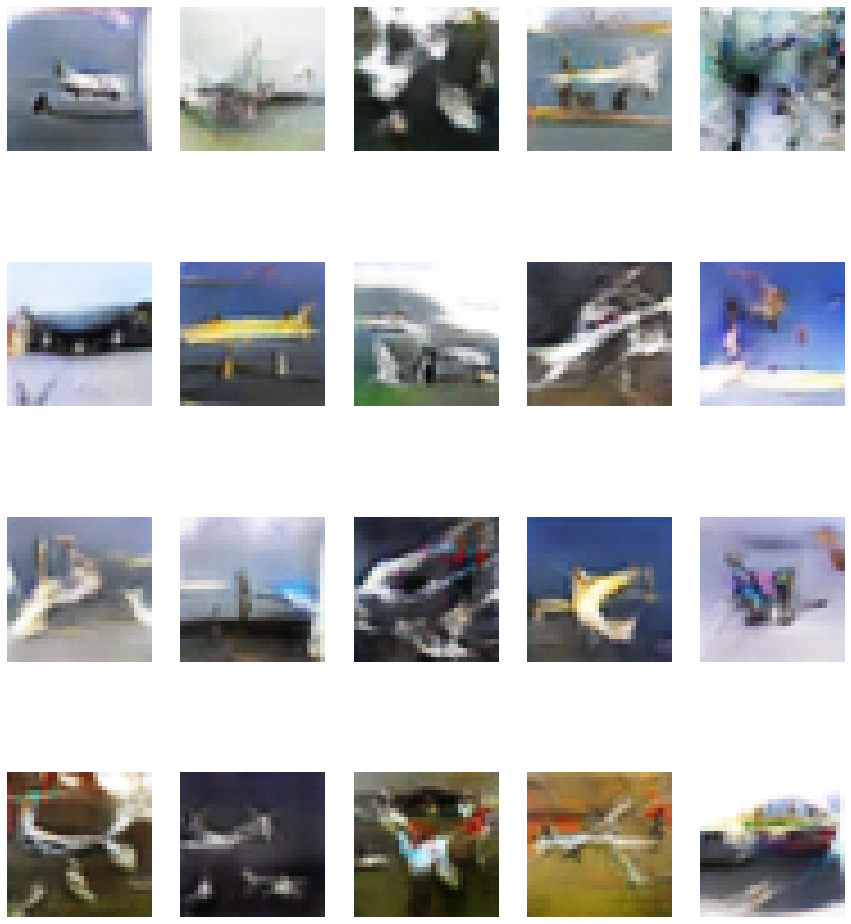

car


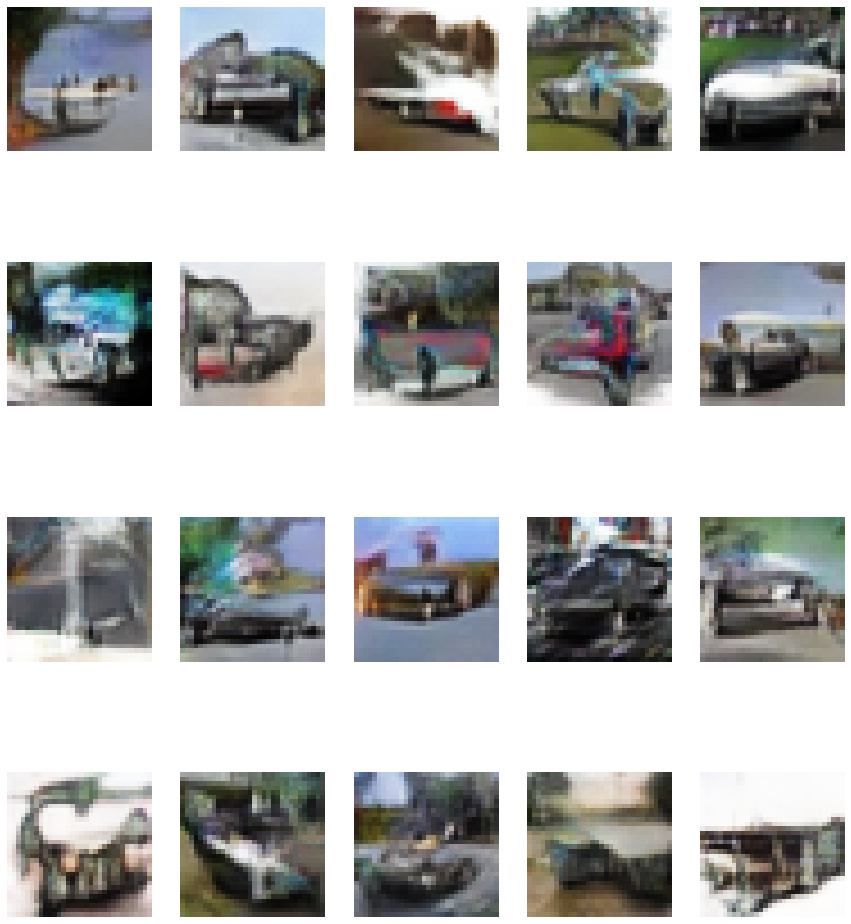

bird


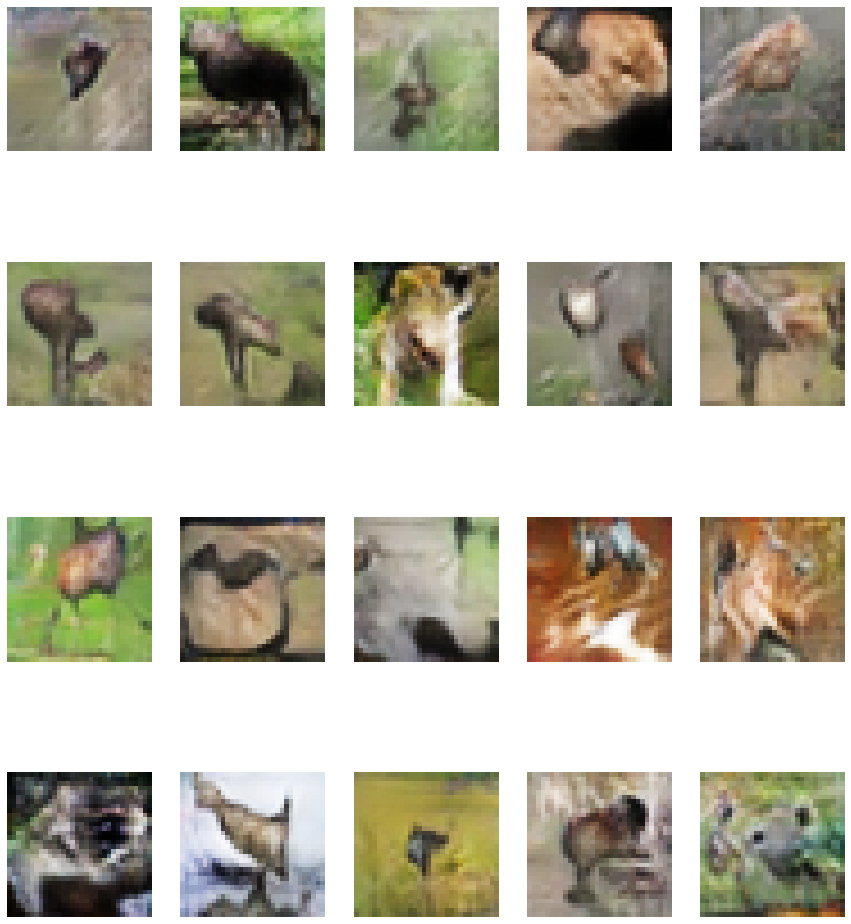

cat


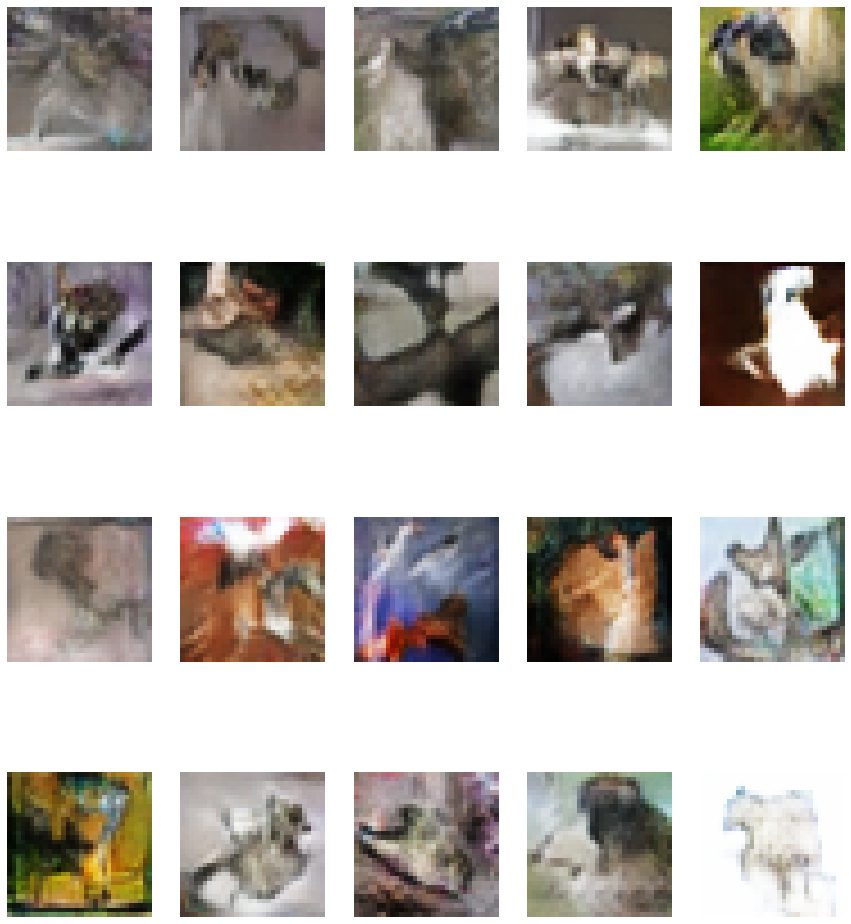

deer


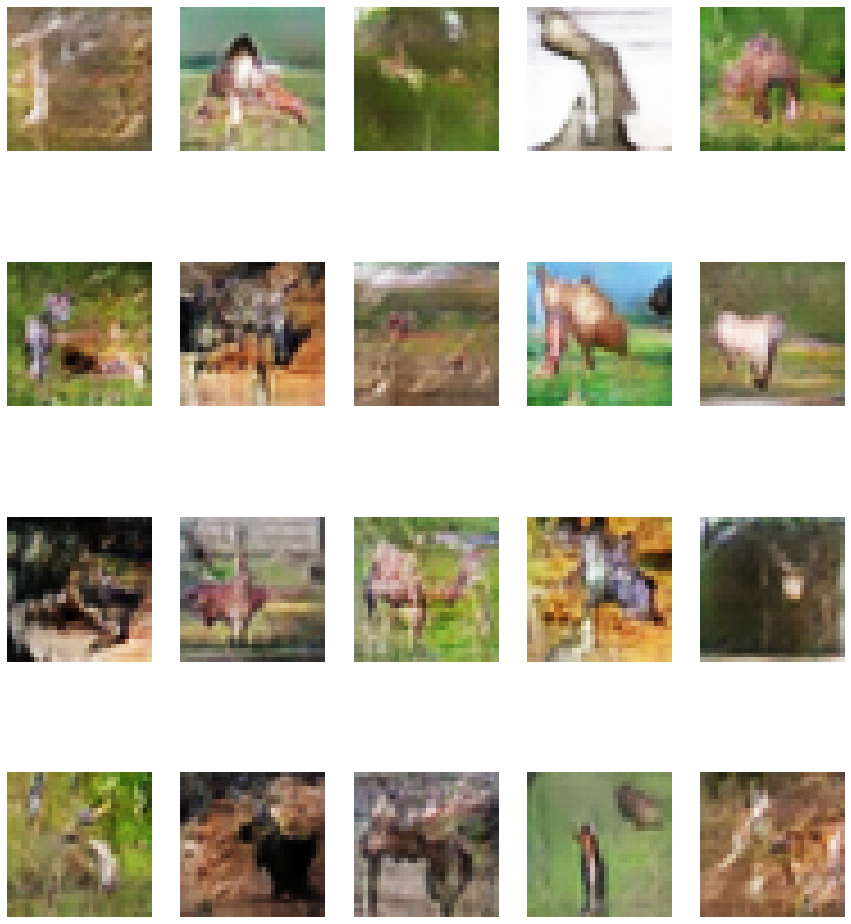

dog


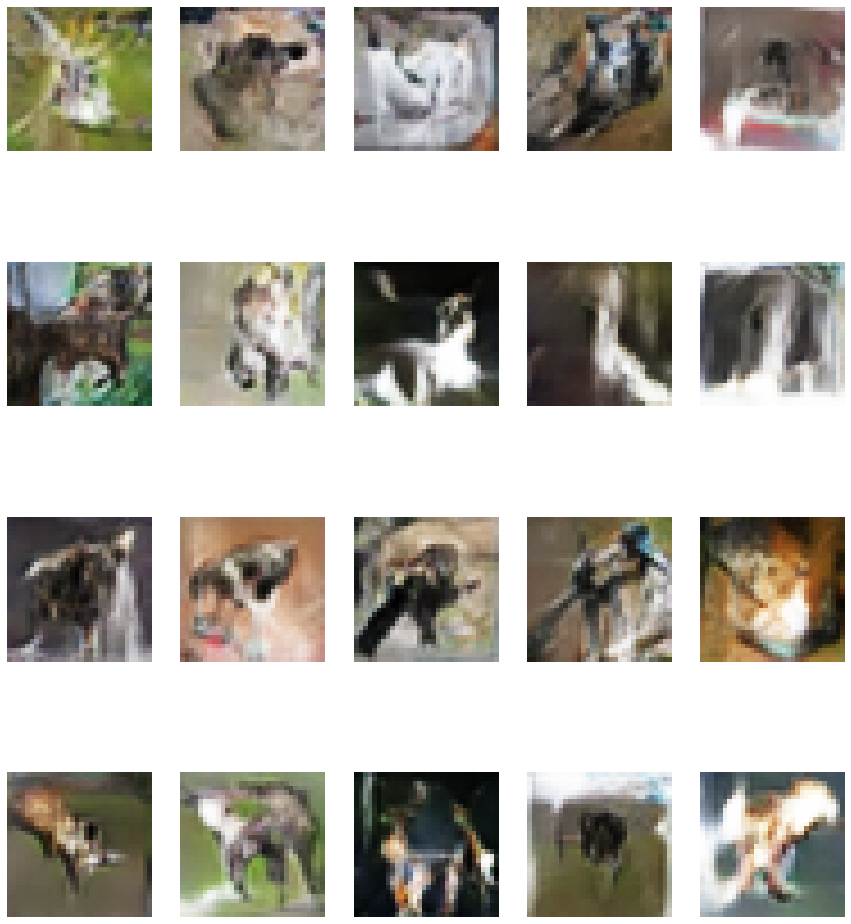

frog


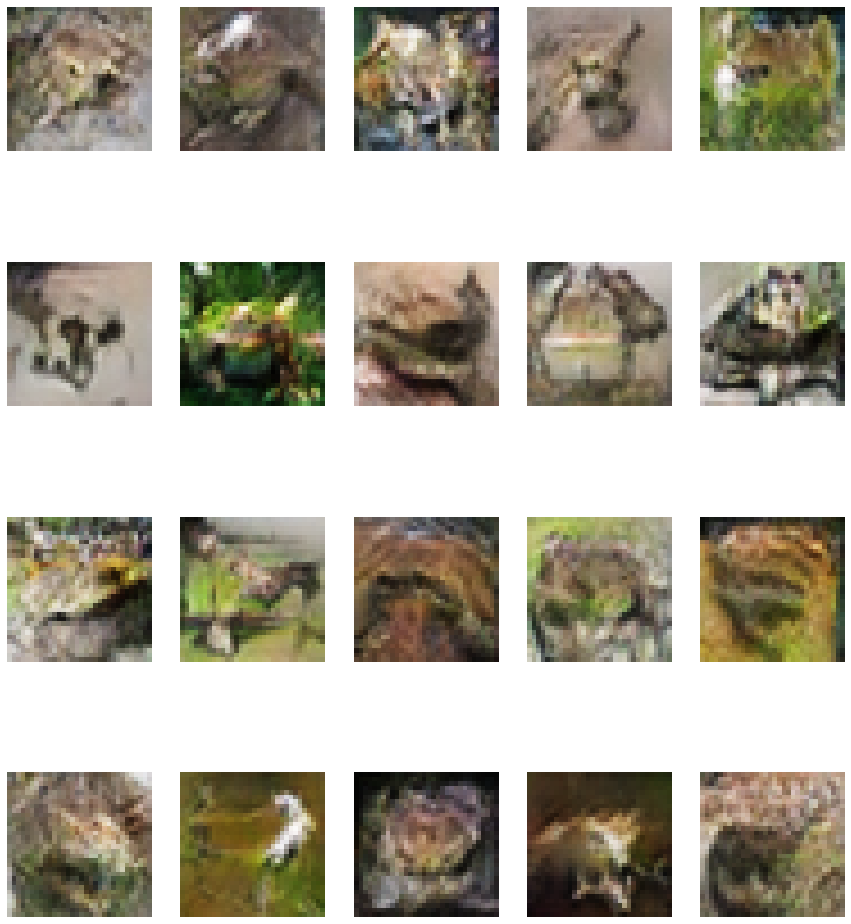

horse


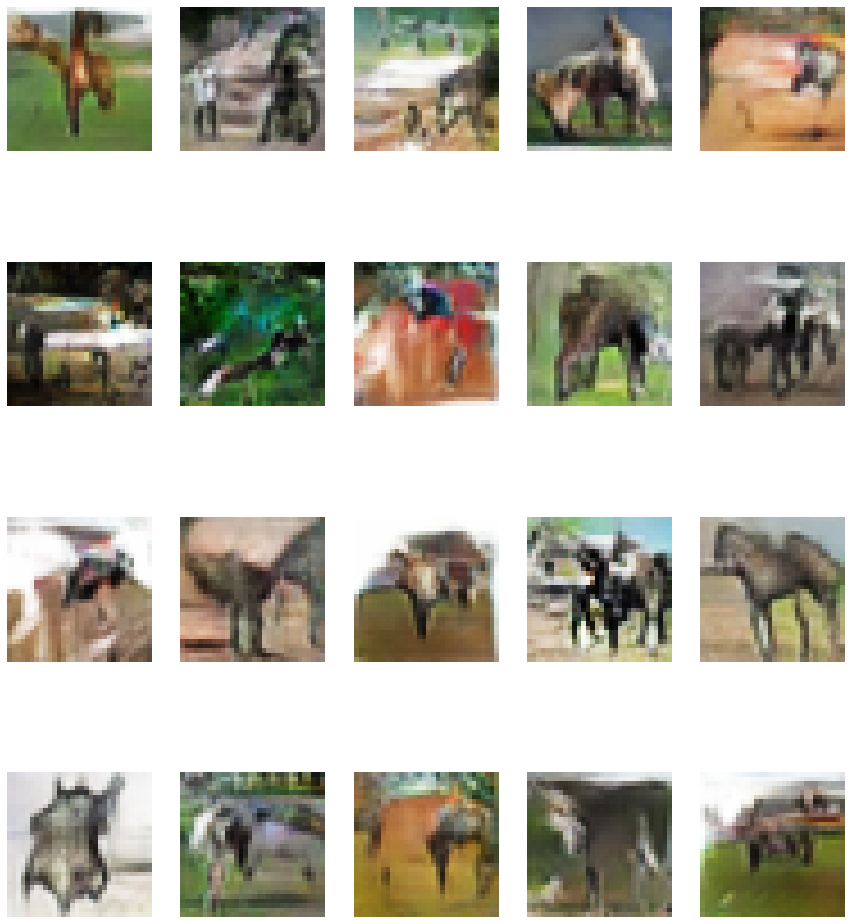

ship


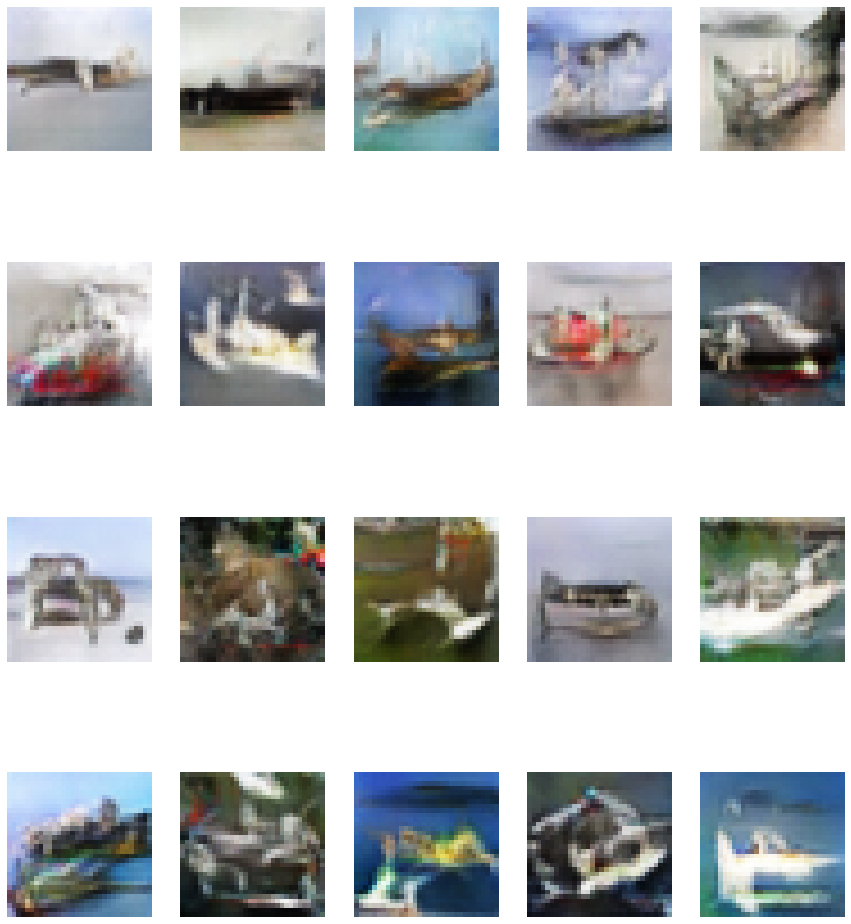

In [35]:
# Because we're using a CGAN we can choose which class to generate
# although... well we'll see.
cifar_classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

# 20 per class
for i in range(9):
    latent_vec, _ = generate_noise_vector(NOISE_DIM, 20, 10) #20 samples, 10 classes
    images = generator.predict([latent_vec, np.full(20, i)])
    images = (images + 1) / 2 # Renormalize to 0-1 range, from -1 to 1 range
    
    print(cifar_classes[i])
    figure = plt.figure(figsize=(15,18))
    for j in range(20):
        ax = plt.subplot(4, 5, j+1)
        ax.axis('off')
        plt.imshow(images[j])
    plt.show()